# import packges

In [4]:
library(DESeq2)
library(data.table)
library(dplyr)
#library(TxDb.Hsapiens.UCSC.hg38.knownGene)
#library(EnsDb.Hsapiens.v86)
library(clusterProfiler)
library(AnnotationDbi)
library(org.Hs.eg.db)
library(ggplot2)
library(gridExtra)
library(RColorBrewer)
library(IRdisplay)
library(GGally)
library(ChIPpeakAnno)
library(universalmotif)
library(IRdisplay)
library(ggpubr)
library(DiffBind)
library(kableExtra)
library(tidyverse)
library(ggraph)
library(tidygraph)
library(readxl)
library(corrplot)
library(ggrepel)
library(msigdbr)
library(fgsea)
library(ggvenn)
library(ComplexHeatmap)
library(ggVennDiagram)
#library(venneuler)
library(sva)
library(DT)
library(tools)
library(tidyverse)
library(RSQLite)
library(eulerr)
library(minfi)
library(IlluminaHumanMethylationEPICmanifest)
library(IlluminaHumanMethylationEPICanno.ilm10b5.hg38)
library(IlluminaMouseMethylationmanifest)
library(IlluminaMouseMethylationanno.12.v1.mm10)


library(edgeR)

#txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene

source('~/script/utils.r')
data_dir1 = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/DNA_Methylation/2024-09-11_xu_lyu_mousemethylation_835144/'
data_dir2 = '/research_jude/rgs01_jude/groups/jxugrp/projects/jxugrp_hartwell/common/illuminaMethylation/2024-12-12_xu_lyu_mousemethylation_841689/'

base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua/'
dir.create(base_dir, showWarnings = F)
setwd(base_dir)

options(width = 168)


# mouse cell line rnaseq batch 1

## design table

In [ ]:
/research_jude/rgs01_jude/groups/jxugrp/projects\NextSeq2000\common\Run92_JL_JX_12-15-2024\241215_VH01570_93_AAGHFWKM5\Data\Intensities\BaseCalls\fastq_files

In [15]:
dsn_mmu_rna = fread('rnaseq/mouse/samplesheet_mouse.csv')
dsn_mmu_rna[, group := sub('JL_(.*)_\\d_S.*', '\\1', sample)]
dsn_mmu_rna[, group := factor(group) ]
dsn_mmu_rna = relocate(dsn_mmu_rna, group, sample)
dsn_mmu_rna[, sample_name := sub('JL_(.*_\\d)_S.*', '\\1', sample)]
dsn_mmu_rna = relocate(dsn_mmu_rna, sample_name, sample)
dsn_mmu_rna_df = setDF(copy(dsn_mmu_rna), rownames = dsn_mmu_rna$sample_name)
head(dsn_mmu_rna_df) 


,sample_name,sample,group,fastq_1,fastq_2,strandedness
,<chr>,<chr>,<fct>,<chr>,<chr>,<chr>
ITD_B1M_1,ITD_B1M_1,JL_ITD_B1M_1_S26,ITD_B1M,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1M_1_S26_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1M_1_S26_R2_001.fastq.gz,auto
ITD_B1M_2,ITD_B1M_2,JL_ITD_B1M_2_S27,ITD_B1M,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1M_2_S27_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1M_2_S27_R2_001.fastq.gz,auto
ITD_B1M_3,ITD_B1M_3,JL_ITD_B1M_3_S28,ITD_B1M,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1M_3_S28_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1M_3_S28_R2_001.fastq.gz,auto
ITD_B1M_4,ITD_B1M_4,JL_ITD_B1M_4_S29,ITD_B1M,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1M_4_S29_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1M_4_S29_R2_001.fastq.gz,auto
ITD_B1M_5,ITD_B1M_5,JL_ITD_B1M_5_S30,ITD_B1M,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1M_5_S30_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1M_5_S30_R2_001.fastq.gz,auto
ITD_B1_1,ITD_B1_1,JL_ITD_B1_1_S21,ITD_B1,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1_1_S21_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_ITD_B1_1_S21_R2_001.fastq.gz,auto


In [16]:
dim(dsn_mmu_rna)

[1] 54  6

In [17]:
table(dsn_mmu_rna$group)


       ITD_B1       ITD_B1M      ITD_MIGR   QM28_E1_Kit   QM28_E1_LSK   QM46_E2_Kit   QM46_E2_LSK   QM47_C2_Kit   QM47_C2_LSK   QM48_C3_Kit   QM48_C3_LSK   QM49_E3_Kit 
            5             5             5             1             1             1             1             1             1             1             1             1 
  QM49_E3_LSK    QM8_C1_Kit    QM8_C1_LSK         WT_B1   WT_B1_Kit_1   WT_B1_Kit_2   WT_B1_Kit_3   WT_B1_LSK_1   WT_B1_LSK_2   WT_B1_LSK_3        WT_B1M       WT_MIGR 
            1             1             1             5             1             1             1             1             1             1             5             5 
WT_MIGR_Kit_1 WT_MIGR_Kit_2 WT_MIGR_Kit_3 WT_MIGR_LSK_1 WT_MIGR_LSK_2 WT_MIGR_LSK_3 
            1             1             1             1             1             1 

In [18]:
tail(dsn_mmu_rna)

sample_name,sample,group,fastq_1,fastq_2,strandedness
<chr>,<chr>,<fct>,<chr>,<chr>,<chr>
WT_MIGR_Kit_1,WT_MIGR_Kit_1,WT_MIGR_Kit_1,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_Kit_1_S7_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_Kit_1_S7_R2_001.fastq.gz,auto
WT_MIGR_Kit_2,WT_MIGR_Kit_2,WT_MIGR_Kit_2,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_Kit_2_S8_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_Kit_2_S8_R2_001.fastq.gz,auto
WT_MIGR_Kit_3,WT_MIGR_Kit_3,WT_MIGR_Kit_3,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_Kit_3_S9_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_Kit_3_S9_R2_001.fastq.gz,auto
WT_MIGR_LSK_1,WT_MIGR_LSK_1,WT_MIGR_LSK_1,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_LSK_1_S19_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_LSK_1_S19_R2_001.fastq.gz,auto
WT_MIGR_LSK_2,WT_MIGR_LSK_2,WT_MIGR_LSK_2,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_LSK_2_S20_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_LSK_2_S20_R2_001.fastq.gz,auto
WT_MIGR_LSK_3,WT_MIGR_LSK_3,WT_MIGR_LSK_3,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_LSK_3_S21_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/JL_WT_MIGR_LSK_3_S21_R2_001.fastq.gz,auto


In [19]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua"

## gene coordination

In [20]:
# import gene regions
gene_bed = fread('rnaseq/mouse/batch1/output/genes.bed')
# import gene_id w/ transcript id
gene_id = fread('rnaseq/mouse/batch1/output/star_rsem/JL_WT_B1M_2_S12.genes.results')
setnames(gene_id, 2, 'tx')
gene_id = separate_rows(gene_id, 'tx', sep = ',')
gene_bed = merge(gene_bed, gene_id, by.x = 'V4', by.y = 'tx', all.x = T) 
gene_bed = relocate(gene_bed, 'gene_id', .before = 'V1')
setnames(gene_bed, 1, 'tx')
setnames(gene_bed, 3, 'chr')
setnames(gene_bed, 4, 'start')
setnames(gene_bed, 5, 'end')
setnames(gene_bed, 7, 'strand')
head(gene_bed) 


tx,gene_id,chr,start,end,V5,strand,V7,V8,V9,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
NM_001001130,Zfp85,chr13,67747799,67755134,0,-,67748529,67755068,0,4,"1923,96,127,72,","0,3810,4588,7263,",2218.00,2054.43,21.71,2.39,2.02
NM_001001144,Scap,chr9,110333355,110384949,0,+,110353042,110384801,0,23,"150,219,130,158,221,106,173,127,113,95,99,219,377,189,202,116,514,86,83,167,81,207,394,","0,19590,29038,38841,39620,40034,40641,41154,43207,44283,44988,45213,46100,46845,47138,47417,47616,48207,50193,50376,50710,50911,51200,",4138.00,3974.43,331.00,18.86,15.95
NM_001001152,Zfp458,chr13,67254917,67269068,0,-,67256114,67269036,0,4,"3227,96,127,38,","0,4643,5199,14113,",3488.00,3324.43,7.00,0.48,0.40
NM_001001160,Fbxo41,chr6,85469575,85502994,0,-,85473025,85484724,0,14,"3513,116,159,119,96,153,116,242,359,74,226,1038,175,286,","0,3625,5504,5818,7992,8280,8530,8825,10052,10644,11191,14250,16345,33133,",6557.33,6393.77,0.00,0.00,0.00
NM_001001176,Taf9b,chrX,106206873,106219842,0,-,106208493,106219629,0,7,"1784,111,70,135,137,82,264,","0,2833,9253,11223,11436,12022,12705,",2521.00,2357.43,50.00,4.80,4.06
NM_001001177,BC051142,chr17,34398819,34460734,0,+,34417520,34460467,0,20,"34,138,292,87,33,135,21,21,21,12,15,21,27,30,57,24,21,24,15,872,","0,17647,18422,20035,20732,23033,42047,44618,45218,46667,47199,48137,49274,49483,49946,50431,50989,52811,53680,61043,",1575.00,1411.43,8.00,1.28,1.09


In [21]:
#fwrite(gene_bed, file = 'rnaseq/mouse/output/gene_bed.tsv', sep = '\t')
gene_bed = fread(file = 'rnaseq/mouse/batch1/output/gene_bed.tsv') 


In [22]:
head(gene_bed)

tx,gene_id,chr,start,end,V5,strand,V7,V8,V9,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
NM_001001130,Zfp85,chr13,67747799,67755134,0,-,67748529,67755068,0,4,"1923,96,127,72,","0,3810,4588,7263,",2218.00,2054.43,21.71,2.39,2.02
NM_001001144,Scap,chr9,110333355,110384949,0,+,110353042,110384801,0,23,"150,219,130,158,221,106,173,127,113,95,99,219,377,189,202,116,514,86,83,167,81,207,394,","0,19590,29038,38841,39620,40034,40641,41154,43207,44283,44988,45213,46100,46845,47138,47417,47616,48207,50193,50376,50710,50911,51200,",4138.00,3974.43,331.00,18.86,15.95
NM_001001152,Zfp458,chr13,67254917,67269068,0,-,67256114,67269036,0,4,"3227,96,127,38,","0,4643,5199,14113,",3488.00,3324.43,7.00,0.48,0.40
NM_001001160,Fbxo41,chr6,85469575,85502994,0,-,85473025,85484724,0,14,"3513,116,159,119,96,153,116,242,359,74,226,1038,175,286,","0,3625,5504,5818,7992,8280,8530,8825,10052,10644,11191,14250,16345,33133,",6557.33,6393.77,0.00,0.00,0.00
NM_001001176,Taf9b,chrX,106206873,106219842,0,-,106208493,106219629,0,7,"1784,111,70,135,137,82,264,","0,2833,9253,11223,11436,12022,12705,",2521.00,2357.43,50.00,4.80,4.06
NM_001001177,BC051142,chr17,34398819,34460734,0,+,34417520,34460467,0,20,"34,138,292,87,33,135,21,21,21,12,15,21,27,30,57,24,21,24,15,872,","0,17647,18422,20035,20732,23033,42047,44618,45218,46667,47199,48137,49274,49483,49946,50431,50989,52811,53680,61043,",1575.00,1411.43,8.00,1.28,1.09


## mouse rnaseq batch 2

In [23]:
fq_dir = '/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run92_JL_JX_12-15-2024/241215_VH01570_93_AAGHFWKM5/Data/Intensities/BaseCalls/fastq_files/'
fq_files = dir(fq_dir, pattern = "*.fastq.gz")
head(fq_files) 


[1] "JL_QM28_E1_Kit_S2_R1_001.fastq.gz"  "JL_QM28_E1_Kit_S2_R2_001.fastq.gz"  "JL_QM28_E1_LSK_S14_R1_001.fastq.gz" "JL_QM28_E1_LSK_S14_R2_001.fastq.gz"
[5] "JL_QM46_E2_Kit_S3_R1_001.fastq.gz"  "JL_QM46_E2_Kit_S3_R2_001.fastq.gz"

In [24]:
r1 = fq_files[grep('R1_', fq_files)] 

In [25]:
tmp = data.table(r1 = paste0(fq_dir, r1) ) 
tmp[, r2 := sub('_R1_', '_R2_', r1) ]
tmp[, sample_name := sub('_S.*', '', basename(r1) ) ]
tmp[, sample_name := sub('JL_', '', sample_name ) ]
datatable(tmp)
                 

HTML widgets cannot be represented in plain text (need html)

In [344]:
tmp2 = fread(text = 'sname	genotype	group
QM28_E1_Kit	B1KI	KitKI
QM46_E2_Kit	B1KI	KitKI
QM49_E3_Kit	B1KI	KitKI
QM8_C1_Kit	WT	KitKI
QM47_C2_Kit	WT	KitKI
QM48_C3_Kit	WT	KitKI
WT_MIGR_Kit_1	WTMIGR	KitOE
WT_MIGR_Kit_2	WTMIGR	KitOE
WT_MIGR_Kit_3	WTMIGR	KitOE
WT_B1_Kit_1	B1OE	KitOE
WT_B1_Kit_2	B1OE	KitOE
WT_B1_Kit_3	B1OE	KitOE
QM8_C1_LSK	WT	LSKKI
QM47_C2_LSK	WT	LSKKI
QM48_C3_LSK	WT	LSKKI
QM28_E1_LSK	B1KI	LSKKI
QM46_E2_LSK	B1KI	LSKKI
QM49_E3_LSK	B1KI	LSKKI
WT_MIGR_LSK_1	WTMIGR	LSKOE
WT_MIGR_LSK_2	WTMIGR	LSKOE
WT_MIGR_LSK_3	WTMIGR	LSKOE
WT_B1_LSK_1	WTB1	LSKOE
WT_B1_LSK_2	WTB1	LSKOE
WT_B1_LSK_3	WTB1	LSK')
tmp3 = merge(tmp, tmp2, by.x = 'sample_name', by.y = 'sname')
tmp3[, grp := paste0(genotype, '_', celltype) ]
head(tmp)


ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'merge': object 'tmp' not found


In [27]:
tmp4 = tmp3[, .(sample_name, r1, r2) ]
setnames(tmp4, c('sample', 'fastq_1', 'fastq_2'))
tmp4[, strandedness := 'auto' ]
write.csv(tmp4, file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua/rnaseq/mouse/batch2/samplesheet_mouse.csv', quote = F, row.names = F)


In [28]:
dim(tmp4)

[1] 24  4

## run rnaseq pipeline

In [392]:
# sample sheets were combined from two batches 
# run under /home/whu78/WenhuoHu/collab_Junhua/rnaseq/mouse
dsn_rna = fread('/home/whu78/WenhuoHu/collab_Junhua/rnaseq/mouse/samplesheet_mouse.csv')
dim(dsn_rna) 


[1] 54  4

In [393]:
tmp1 = fread(text = 'sname	genotype	group
sname	genotype	group
JL_ITD_B1M_1_S26	B1M	ITD
JL_ITD_B1M_2_S27	B1M	ITD
JL_ITD_B1M_3_S28	B1M	ITD
JL_ITD_B1M_4_S29	B1M	ITD
JL_ITD_B1M_5_S30	B1M	ITD
JL_ITD_B1_1_S21	B1	ITD
JL_ITD_B1_2_S22	B1	ITD
JL_ITD_B1_3_S23	B1	ITD
JL_ITD_B1_4_S24	B1	ITD
JL_ITD_B1_5_S25	B1	ITD
JL_ITD_MIGR_1_S16	MIGR	ITD
JL_ITD_MIGR_2_S17	MIGR	ITD
JL_ITD_MIGR_3_S18	MIGR	ITD
JL_ITD_MIGR_4_S19	MIGR	ITD
JL_ITD_MIGR_5_S20	MIGR	ITD
JL_WT_B1M_1_S11	B1M	Vitro
JL_WT_B1M_2_S12	B1M	Vitro
JL_WT_B1M_3_S13	B1M	Vitro
JL_WT_B1M_4_S14	B1M	Vitro
JL_WT_B1M_5_S15	B1M	Vitro
JL_WT_B1_1_S6	B1	Vitro
JL_WT_B1_2_S7	B1	Vitro
JL_WT_B1_3_S8	B1	Vitro
JL_WT_B1_4_S9	B1	Vitro
JL_WT_B1_5_S10	B1	Vitro
JL_WT_MIGR_1_S1	MIGR	Vitro
JL_WT_MIGR_2_S2	MIGR	Vitro
JL_WT_MIGR_3_S3	MIGR	Vitro
JL_WT_MIGR_4_S4	MIGR	Vitro
JL_WT_MIGR_5_S5	MIGR	Vitro')

In [394]:
tmp2 = fread(text = 'sname	genotype	group
QM28_E1_Kit	B1KI	KitKI
QM46_E2_Kit	B1KI	KitKI
QM49_E3_Kit	B1KI	KitKI
QM8_C1_Kit	WT	KitKI
QM47_C2_Kit	WT	KitKI
QM48_C3_Kit	WT	KitKI
WT_MIGR_Kit_1	WTMIGR	KitOE
WT_MIGR_Kit_2	WTMIGR	KitOE
WT_MIGR_Kit_3	WTMIGR	KitOE
WT_B1_Kit_1	B1OE	KitOE
WT_B1_Kit_2	B1OE	KitOE
WT_B1_Kit_3	B1OE	KitOE
QM8_C1_LSK	WT	LSKKI
QM47_C2_LSK	WT	LSKKI
QM48_C3_LSK	WT	LSKKI
QM28_E1_LSK	B1KI	LSKKI
QM46_E2_LSK	B1KI	LSKKI
QM49_E3_LSK	B1KI	LSKKI
WT_MIGR_LSK_1	WTMIGR	LSKOE
WT_MIGR_LSK_2	WTMIGR	LSKOE
WT_MIGR_LSK_3	WTMIGR	LSKOE
WT_B1_LSK_1	WTB1	LSKOE
WT_B1_LSK_2	WTB1	LSKOE
WT_B1_LSK_3	WTB1	LSKOE')

In [395]:
tmp = rbind(tmp1, tmp2)
datatable(tmp)

HTML widgets cannot be represented in plain text (need html)

In [396]:
dsn_rna = merge(dsn_rna, tmp, by.x = 'sample', by.y = 'sname', all.x = T)

In [397]:
datatable(dsn_rna[, .(sample, group, genotype)])

HTML widgets cannot be represented in plain text (need html)

In [419]:
dsn_rna[, grp := paste0(group, '_', genotype) ]

In [402]:
dim(dsn_rna)


[1] 54  7

In [436]:
# swicth ITD_MIGR and ITD-B1
dsn_rna[, grp_ori := grp ]
dsn_rna[grp_ori == 'ITD_B1',   grp := 'ITD_MIGR'] 
dsn_rna[grp_ori == 'ITD_MIGR', grp := 'ITD_B1'] 


In [435]:
table(dsn_rna$grp)


      ITD_B1      ITD_B1M     ITD_MIGR   KitKI_B1KI     KitKI_WT   KitOE_B1OE KitOE_WTMIGR   LSKKI_B1KI     LSKKI_WT 
           5            5            5            3            3            3            3            3            3 
  LSKOE_WTB1 LSKOE_WTMIGR     Vitro_B1    Vitro_B1M   Vitro_MIGR 
           3            3            5            5            5 

In [39]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua"

# import counts file

In [40]:
dsn_rna[, count_file := paste0('/home/whu78/WenhuoHu/collab_Junhua/rnaseq/mouse/output/star_rsem/', sample, '.genes.results')]
file.exists(dsn_rna$count_file)
# output/star_rsem/JL_ITD_B1M_5_S30.genes.results
head(dsn_rna$sample[1])

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[33] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

[1] "JL_ITD_B1M_1_S26"

## DEG list

In [41]:
load('rnaseq/mouse/output/star_rsem/deseq2_qc/deseq2.dds.RData')                      
dds


class: DESeqDataSet 
dim: 24411 54 
metadata(1): version
assays(2): counts vst
rownames(24411): 0610005C13Rik 0610007P14Rik ... a l7Rn6
rowData names(0):
colnames(54): JL_ITD_B1M_1_S26 JL_ITD_B1M_2_S27 ... WT_MIGR_LSK_2 WT_MIGR_LSK_3
colData names(2): sample sizeFactor

In [78]:
file.size('rnaseq/mouse/output/star_rsem/deseq2_qc/deseq2.dds.RData')
file.info('rnaseq/mouse/output/star_rsem/deseq2_qc/deseq2.dds.RData')

[1] 5108109

,size,isdir,mode,mtime,ctime,atime,uid,gid,uname,grname
,<dbl>,<lgl>,<octmode>,<dttm>,<dttm>,<dttm>,<int>,<int>,<chr>,<chr>
rnaseq/mouse/output/star_rsem/deseq2_qc/deseq2.dds.RData,5108109,FALSE,700,2025-02-26 16:39:47,2025-02-26 16:39:47,2025-03-17 10:44:36,111554,76937,whu78,Domain Users


In [79]:
dim(dsn_rna)

[1] 54  8

In [450]:
colnames(dds) == dsn_rna$sample

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[25] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[49] TRUE TRUE TRUE TRUE TRUE TRUE

In [452]:
groups = unique(dsn_rna$group)
groups
cmp_list = lapply(groups, function(gg){
    xx = sort(unique(dsn_rna[group == gg, grp]))
    combn_fun(xx)
})
names(cmp_list) = groups
cmp_dt = rbindlist(cmp_list, idcol = T)
dim(cmp_dt)
head(cmp_dt)


[1] "ITD"   "Vitro" "KitKI" "LSKKI" "KitOE" "LSKOE"

[1] 10  5

.id,rn,grp1,grp2,tag
<chr>,<int>,<chr>,<chr>,<chr>
ITD,1,ITD_B1,ITD_B1M,ITD_B1__ITD_B1M
ITD,2,ITD_B1,ITD_MIGR,ITD_B1__ITD_MIGR
ITD,3,ITD_B1M,ITD_MIGR,ITD_B1M__ITD_MIGR
Vitro,1,Vitro_B1,Vitro_B1M,Vitro_B1__Vitro_B1M
Vitro,2,Vitro_B1,Vitro_MIGR,Vitro_B1__Vitro_MIGR
Vitro,3,Vitro_B1M,Vitro_MIGR,Vitro_B1M__Vitro_MIGR


In [454]:
cmp_dt$rn = 1:nrow(cmp_dt)
head(cmp_dt)


.id,rn,grp1,grp2,tag
<chr>,<int>,<chr>,<chr>,<chr>
ITD,1,ITD_B1,ITD_B1M,ITD_B1__ITD_B1M
ITD,2,ITD_B1,ITD_MIGR,ITD_B1__ITD_MIGR
ITD,3,ITD_B1M,ITD_MIGR,ITD_B1M__ITD_MIGR
Vitro,4,Vitro_B1,Vitro_B1M,Vitro_B1__Vitro_B1M
Vitro,5,Vitro_B1,Vitro_MIGR,Vitro_B1__Vitro_MIGR
Vitro,6,Vitro_B1M,Vitro_MIGR,Vitro_B1M__Vitro_MIGR


In [47]:
# QM49_E3_Kit

In [453]:
dds$Group = factor(dsn_rna$grp) 
dds@design = ~ Group
dds = DESeq(dds)


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [424]:
logcpm_mmu <- counts(dds, normalized=TRUE)
logcpm_mmu = log2(logcpm_mmu + 1)
head(logcpm_mmu) 


,JL_ITD_B1M_1_S26,JL_ITD_B1M_2_S27,JL_ITD_B1M_3_S28,JL_ITD_B1M_4_S29,JL_ITD_B1M_5_S30,JL_ITD_B1_1_S21,JL_ITD_B1_2_S22,JL_ITD_B1_3_S23,JL_ITD_B1_4_S24,JL_ITD_B1_5_S25,⋯,WT_B1_Kit_3,WT_B1_LSK_1,WT_B1_LSK_2,WT_B1_LSK_3,WT_MIGR_Kit_1,WT_MIGR_Kit_2,WT_MIGR_Kit_3,WT_MIGR_LSK_1,WT_MIGR_LSK_2,WT_MIGR_LSK_3
0610005C13Rik,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.7584735,⋯,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
0610007P14Rik,8.694772,8.415165,8.465443,8.602114,8.522386,8.905587,8.948251,8.795270,8.667747,8.9285625,⋯,8.252122,8.005118,8.462948,8.523210,8.042025,8.029561,8.238411,8.538784,8.467492,8.541905
0610009B22Rik,6.395032,6.380420,7.116613,6.860098,6.988672,7.124083,7.391012,7.202240,7.212422,7.0788419,⋯,6.371478,6.767567,6.557579,6.235830,6.464528,6.365332,6.398923,6.518777,6.445961,6.502243
0610009L18Rik,1.386658,3.599674,4.574209,2.708637,5.294038,2.973841,4.372841,3.693737,3.588345,4.3482035,⋯,3.043990,4.882414,4.574300,3.860067,2.992697,3.474292,3.343701,5.447591,4.246852,4.457521
0610009O20Rik,9.304594,8.924701,9.458209,9.239687,9.348395,8.737326,8.738838,8.783103,8.783166,8.8485613,⋯,8.982280,8.782950,8.958281,8.880077,8.942422,9.081688,9.128728,8.878727,9.033666,8.923111
0610010B08Rik,6.218584,5.507540,4.809828,6.075627,5.445559,6.162278,5.946544,5.793768,6.346036,5.8159846,⋯,6.147478,6.060877,7.433031,7.500442,5.741828,5.896129,5.881740,8.369016,6.143539,6.009815


In [455]:
deg_list = lapply(cmp_dt$rn, function(ii){
    grp1 = cmp_dt[ii, grp1]
    grp2 = cmp_dt[ii, grp2]
    message(grp1, '\t', grp2)
    as.data.table(results(dds, contrast = c('Group', grp1, grp2)), keep.rownames = T)
})


ITD_B1	ITD_B1M

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
ITD_B1	ITD_MIGR

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
ITD_B1M	ITD_MIGR

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Vitro_B1	Vitro_B1M

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Vitro_B1	Vitro_MIGR

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Vitro_B1M	Vitro_MIGR

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
KitKI_B1KI	KitKI_WT

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
LSKKI_B1KI	LSKKI_WT

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
KitOE_B1OE	KitOE_WTMIGR

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
LSKOE_WTB1	LSKOE_WTMIGR

Warning message in .local(x, 

In [456]:
names(deg_list) = cmp_dt$tag
deg_dt = rbindlist(deg_list, idcol = T)
deg_dt = merge(deg_dt, gene_bed[!duplicated(gene_id), ], by.x = 'rn', by.y = 'gene_id', all.x = T)
deg_dt[log2FoldChange > 0, updn := 'up' ]
deg_dt[log2FoldChange < 0, updn := 'dn' ]
deg_dt[, updn := factor(updn, levels = c('up', 'dn') )]


In [457]:
deg_dt[rn == 'Bcat1', ]

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V9,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
Bcat1,ITD_B1__ITD_B1M,3667.838,-0.4577641,0.7089468,-0.6456959,5.184763e-01,6.898203e-01,NM_001024468,chr6,⋯,0,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,dn
Bcat1,ITD_B1__ITD_MIGR,3667.838,2.7298202,0.7300542,3.7392024,1.846051e-04,7.301245e-04,NM_001024468,chr6,⋯,0,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,up
Bcat1,ITD_B1M__ITD_MIGR,3667.838,3.1875843,0.7149240,4.4586340,8.248363e-06,3.195546e-05,NM_001024468,chr6,⋯,0,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,up
Bcat1,Vitro_B1__Vitro_B1M,3667.838,0.2956314,0.6841455,0.4321178,6.656558e-01,1.000000e+00,NM_001024468,chr6,⋯,0,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,up
Bcat1,Vitro_B1__Vitro_MIGR,3667.838,9.4221405,0.7062747,13.3406177,1.343418e-40,1.710708e-36,NM_001024468,chr6,⋯,0,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,up
Bcat1,Vitro_B1M__Vitro_MIGR,3667.838,9.1265091,0.7063016,12.9215460,3.402357e-38,4.585016e-34,NM_001024468,chr6,⋯,0,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,up
Bcat1,KitKI_B1KI__KitKI_WT,3667.838,2.0281157,0.8841427,2.2938782,2.179750e-02,1.000000e+00,NM_001024468,chr6,⋯,0,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,up
Bcat1,LSKKI_B1KI__LSKKI_WT,3667.838,1.4640342,0.8835045,1.6570761,9.750409e-02,1.000000e+00,NM_001024468,chr6,⋯,0,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,up
Bcat1,KitOE_B1OE__KitOE_WTMIGR,3667.838,8.3162818,0.8911724,9.3318441,1.040446e-20,1.911826e-16,NM_001024468,chr6,⋯,0,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,up


In [461]:
#fwrite(deg_dt, file = 'rnaseq/mouse/output/deg_dt.tsv', sep = '\t')

In [54]:
#fwrite(deg_dt, file = 'rnaseq/mouse/output/deg_dt.tsv', sep = '\t')
deg_dt = fread(file = 'rnaseq/mouse/output/deg_dt.tsv')


In [416]:
dim(deg_dt)
head(deg_dt)


[1] 244110     26

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V9,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
0610005C13Rik,ITD_B1M__ITD_B1,0.1010885,-0.01934597,6.826727,-0.002833857,0.9977389,NA,NR_038165,chr7,⋯,0,4,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,dn
0610005C13Rik,ITD_B1M__ITD_MIGR,0.1010885,-2.58394935,6.823475,-0.378685274,0.7049216,NA,NR_038165,chr7,⋯,0,4,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,dn
0610005C13Rik,ITD_B1__ITD_MIGR,0.1010885,-2.56460339,6.822281,-0.375915824,0.7069795,NA,NR_038165,chr7,⋯,0,4,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,dn
0610005C13Rik,Vitro_B1M__Vitro_B1,0.1010885,0.10379970,6.827920,0.015202243,0.9878708,1,NR_038165,chr7,⋯,0,4,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,up
0610005C13Rik,Vitro_B1M__Vitro_MIGR,0.1010885,0.00000000,6.827920,0.000000000,1.0000000,NA,NR_038165,chr7,⋯,0,4,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,NA
0610005C13Rik,Vitro_B1__Vitro_MIGR,0.1010885,0.44484984,6.827920,0.065151589,0.9480533,NA,NR_038165,chr7,⋯,0,4,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,up


In [58]:
col_sel = colData(dds)$Group[colData(dds)$Group %in% c('ITD_ITDB1M', 'ITD_ITDB1')]
col_sel
print(logcpm_mmu['Tceanc2', colData(dds)$Group %in% c('ITD_ITDB1M', 'ITD_ITDB1')])

[1] ITD_ITDB1M ITD_ITDB1M ITD_ITDB1M ITD_ITDB1M ITD_ITDB1M ITD_ITDB1  ITD_ITDB1  ITD_ITDB1  ITD_ITDB1  ITD_ITDB1 
14 Levels: ITD_ITDB1 ITD_ITDB1M ITD_ITDMIGR Kit_B1KI Kit_B1KI_WT Kit_B1OE Kit_B1OE_WT LSK_B1KI LSK_B1KI_WT LSK_B1OE LSK_B1OE_WT vitro_vitroB1 ... vitro_vitroMIGR

JL_ITD_B1M_1_S26 JL_ITD_B1M_2_S27 JL_ITD_B1M_3_S28 JL_ITD_B1M_4_S29 JL_ITD_B1M_5_S30  JL_ITD_B1_1_S21  JL_ITD_B1_2_S22  JL_ITD_B1_3_S23  JL_ITD_B1_4_S24 
        8.215783         8.357622         8.532842         8.399392         8.589012         5.195840         5.037945         5.341644         4.796115 
 JL_ITD_B1_5_S25 
        5.153197 


Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


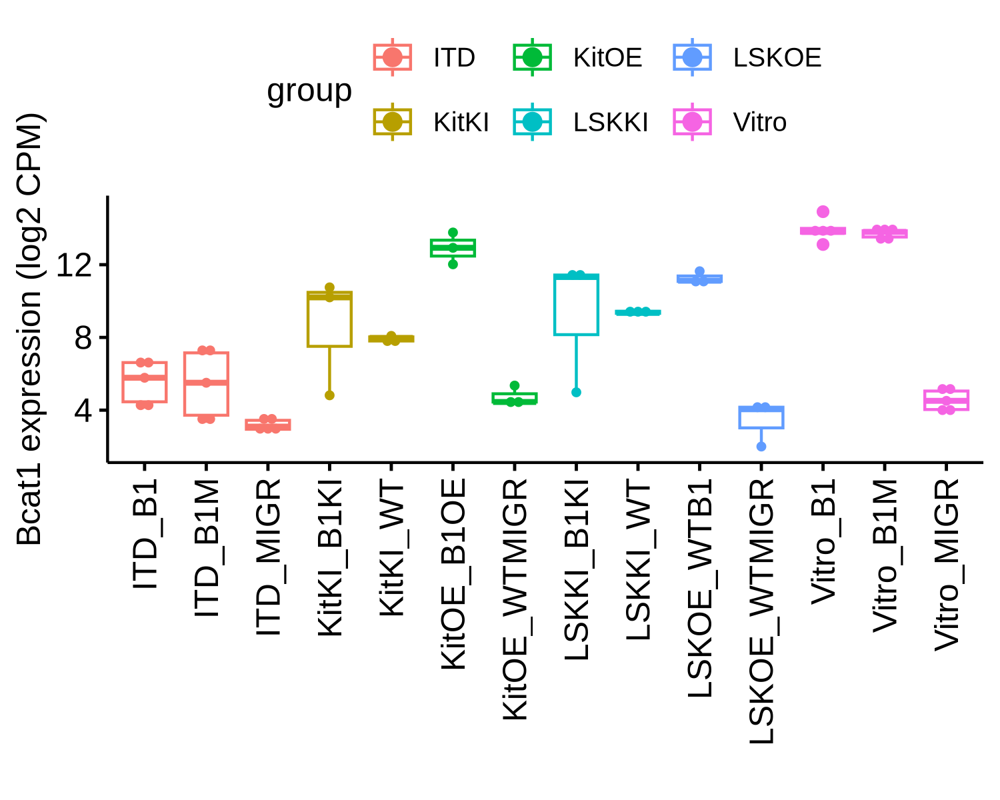

In [458]:
plotdat = as.data.table(logcpm_mmu['Bcat1',], keep.rownames = T)
plotdat = merge(plotdat, dsn_rna[, .(sample, grp, group)], by.x = 'V1', by.y = 'sample')
plotdat = plotdat[order(grp), ]
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
ggboxplot(plotdat, x = 'grp', y = 'V2', add = 'dotplot', color = 'group') + rotate_x_text(90) + ylab('Bcat1 expression (log2 CPM)') + xlab('')

Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


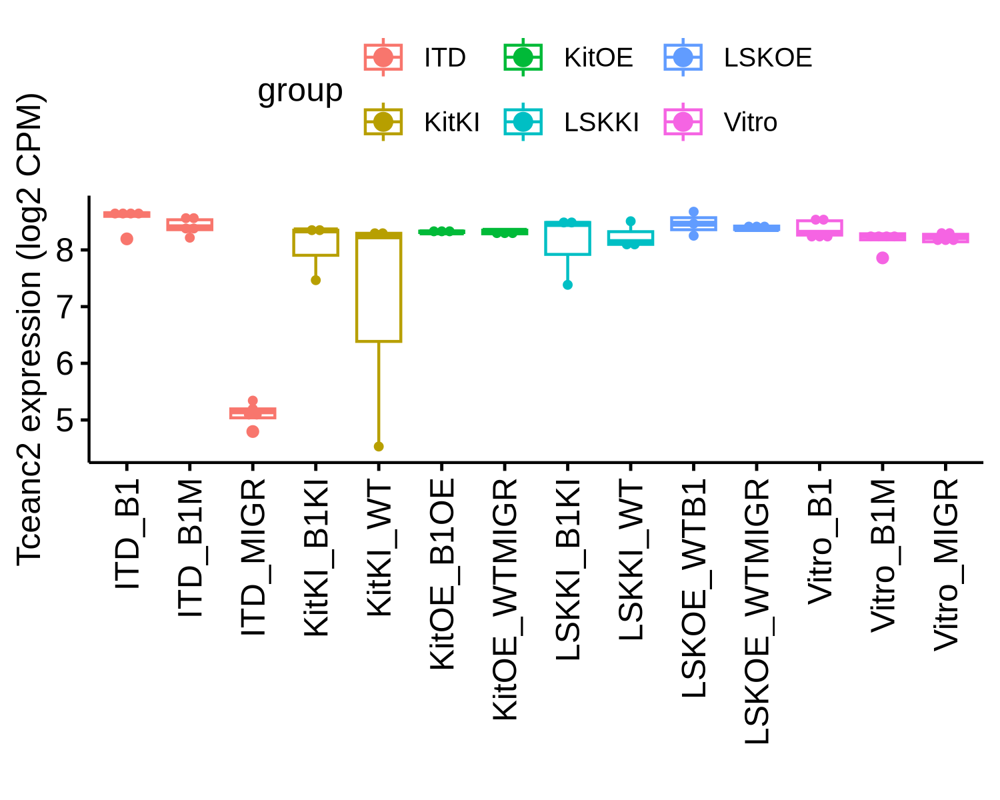

In [442]:
plotdat = as.data.table(logcpm_mmu['Tceanc2',], keep.rownames = T)
plotdat = merge(plotdat, dsn_rna[, .(sample, grp, group)], by.x = 'V1', by.y = 'sample')
plotdat = plotdat[order(grp), ]
ggboxplot(plotdat, x = 'grp', y = 'V2', add = 'dotplot', color = 'group') + rotate_x_text(90) + ylab('Tceanc2 expression (log2 CPM)') + xlab('')


Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


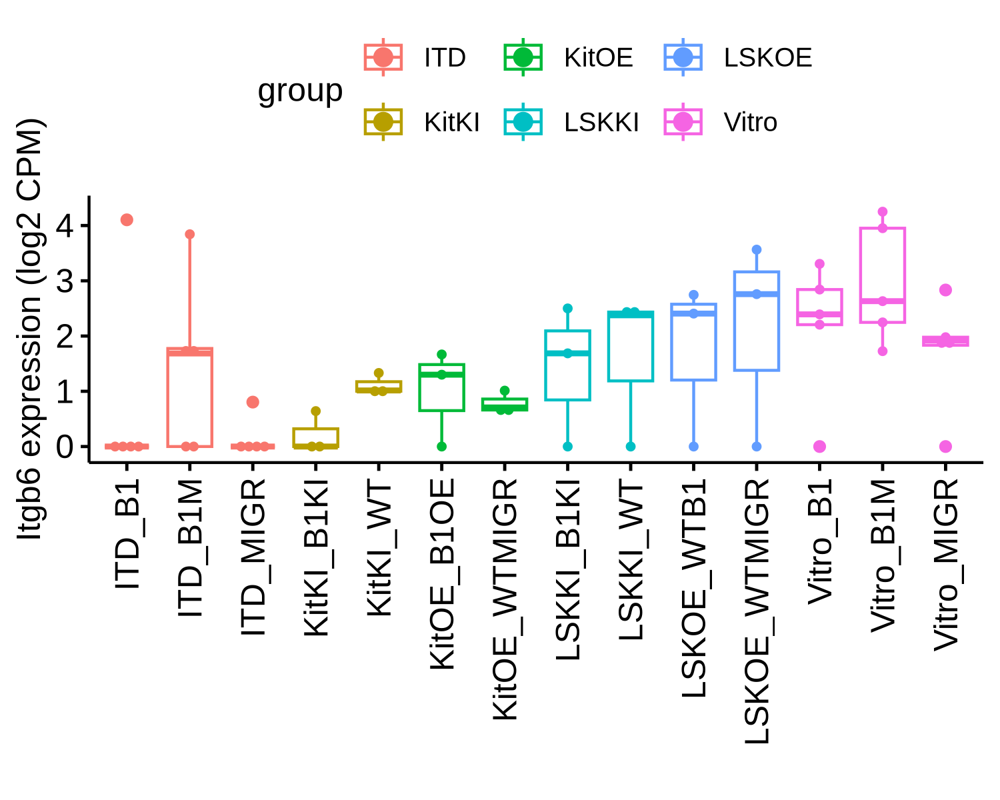

In [443]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
#hsa_deg_dt[rn %in% c('AZU1', 'ITGB6') & .id == 'DKO__WT', ]
plotdat = as.data.table(logcpm_mmu['Itgb6',], keep.rownames = T)
plotdat = merge(plotdat, dsn_rna[, .(sample, grp, group)], by.x = 'V1', by.y = 'sample')
plotdat = plotdat[order(grp), ]
ggboxplot(plotdat, x = 'grp', y = 'V2', add = 'dotplot', color = 'group') + rotate_x_text(90) + ylab('Itgb6 expression (log2 CPM)') + xlab('')
# The human AZU1 gene encodes azurocidin 1, a protein primarily found in neutrophil granules 
# with antimicrobial properties and roles in immune response. 
# In mice, a direct ortholog of AZU1 has not been clearly identified. 
# However, mice possess genes encoding proteins with similar functions, 
# such as cathepsin G (Ctsg) and neutrophil elastase (Elane), 
# which are also serine proteases involved in antimicrobial activity within neutrophils.

# It's important to note that while these mouse proteins share functional similarities with human azurocidin, 
# they are not direct homologs. The absence of a direct mouse counterpart to human AZU1 suggests species-specific differences in neutrophil protein composition and function.


In [506]:
deg_dt[rn == 'Itgb6', ][order(pvalue), ]

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM,updn,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
Itgb6,ITD_ITDB1M__ITD_ITDB1,3.115592,3.97945565,1.444450,2.75499665,0.005869274,0.01231152,NM_001159564,chr2,⋯,18,"2292,167,120,95,223,418,135,90,96,162,166,247,205,80,76,52,82,188,","0,6848,13075,18353,21919,29456,30043,36288,51682,54850,56347,69996,70810,74340,75110,75720,76355,124124,",4788,4624.43,10,0.49,0.41,up,0.01231152
Itgb6,ITD_ITDB1__ITD_ITDMIGR,3.115592,-2.84264118,1.619173,-1.75561333,0.079154454,0.13451942,NM_001159564,chr2,⋯,18,"2292,167,120,95,223,418,135,90,96,162,166,247,205,80,76,52,82,188,","0,6848,13075,18353,21919,29456,30043,36288,51682,54850,56347,69996,70810,74340,75110,75720,76355,124124,",4788,4624.43,10,0.49,0.41,dn,0.13451942
Itgb6,Kit_B1KI__Kit_B1OE,3.115592,-2.70852266,1.878221,-1.44206808,0.149283169,NA,NM_001159564,chr2,⋯,18,"2292,167,120,95,223,418,135,90,96,162,166,247,205,80,76,52,82,188,","0,6848,13075,18353,21919,29456,30043,36288,51682,54850,56347,69996,70810,74340,75110,75720,76355,124124,",4788,4624.43,10,0.49,0.41,dn,NA
Itgb6,Kit_B1KI__Kit_B1KI_WT,3.115592,-2.66454475,1.878542,-1.41841123,0.156070738,1.00000000,NM_001159564,chr2,⋯,18,"2292,167,120,95,223,418,135,90,96,162,166,247,205,80,76,52,82,188,","0,6848,13075,18353,21919,29456,30043,36288,51682,54850,56347,69996,70810,74340,75110,75720,76355,124124,",4788,4624.43,10,0.49,0.41,dn,1.00000000
Itgb6,vitro_vitroB1M__vitro_vitroMIGR,3.115592,1.58734571,1.217608,1.30365856,0.192350026,NA,NM_001159564,chr2,⋯,18,"2292,167,120,95,223,418,135,90,96,162,166,247,205,80,76,52,82,188,","0,6848,13075,18353,21919,29456,30043,36288,51682,54850,56347,69996,70810,74340,75110,75720,76355,124124,",4788,4624.43,10,0.49,0.41,up,NA
Itgb6,Kit_B1KI__Kit_B1OE_WT,3.115592,-1.98125274,1.938948,-1.02181854,0.306866792,1.00000000,NM_001159564,chr2,⋯,18,"2292,167,120,95,223,418,135,90,96,162,166,247,205,80,76,52,82,188,","0,6848,13075,18353,21919,29456,30043,36288,51682,54850,56347,69996,70810,74340,75110,75720,76355,124124,",4788,4624.43,10,0.49,0.41,dn,1.00000000
Itgb6,LSK_B1KI__LSK_B1OE_WT,3.115592,-1.25442882,1.435964,-0.87357943,0.382347330,0.77235233,NM_001159564,chr2,⋯,18,"2292,167,120,95,223,418,135,90,96,162,166,247,205,80,76,52,82,188,","0,6848,13075,18353,21919,29456,30043,36288,51682,54850,56347,69996,70810,74340,75110,75720,76355,124124,",4788,4624.43,10,0.49,0.41,dn,0.77235233
Itgb6,vitro_vitroB1M__vitro_vitroB1,3.115592,0.98355310,1.177269,0.83545316,0.403462611,1.00000000,NM_001159564,chr2,⋯,18,"2292,167,120,95,223,418,135,90,96,162,166,247,205,80,76,52,82,188,","0,6848,13075,18353,21919,29456,30043,36288,51682,54850,56347,69996,70810,74340,75110,75720,76355,124124,",4788,4624.43,10,0.49,0.41,up,1.00000000
Itgb6,ITD_ITDB1M__ITD_ITDMIGR,3.115592,1.13681447,1.391637,0.81688993,0.413991335,0.59882952,NM_001159564,chr2,⋯,18,"2292,167,120,95,223,418,135,90,96,162,166,247,205,80,76,52,82,188,","0,6848,13075,18353,21919,29456,30043,36288,51682,54850,56347,69996,70810,74340,75110,75720,76355,124124,",4788,4624.43,10,0.49,0.41,up,0.59882952


In [ ]:
# mouse don't have this gene !
head(logcpm_mmu['Azu1', ])

In [63]:
#hsa_deg_dt[rn %in% c('AZU1', 'ITGB6') & .id == 'DKO__WT', ]
plotdat = as.data.table(logcpm_mmu['Azu1',], keep.rownames = T)
plotdat = merge(plotdat, dsn_rna[, .(sample, grp, group)], by.x = 'V1', by.y = 'sample')
plotdat = plotdat[order(grp), ]
plotdat
ggboxplot(plotdat, x = 'grp', y = 'V2', add = 'dotplot', color = 'group') + rotate_x_text(90) + ylab('Bcat1 expression (log2 CPM)') + xlab('')

ERROR: Error in logcpm_mmu["Azu1", ]: subscript out of bounds


## test batch 1 only

In [476]:
load('rnaseq/mouse/batch1/output/star_rsem/deseq2_qc/deseq2.dds.RData')                      
dds


class: DESeqDataSet 
dim: 24411 30 
metadata(1): version
assays(2): counts vst
rownames(24411): 0610005C13Rik 0610007P14Rik ... a l7Rn6
rowData names(0):
colnames(30): JL_ITD_B1M_1_S26 JL_ITD_B1M_2_S27 ... JL_WT_MIGR_4_S4 JL_WT_MIGR_5_S5
colData names(5): sample Group1 Group2 Group3 sizeFactor

In [481]:
tmp = data.table(samplename = colnames(dds))
tmp[grep('_ITD_B1_', samplename), group := 'ITDB1' ]
tmp[grep('_ITD_B1M', samplename), group := 'ITDB1M' ]
tmp[grep('_ITD_MIGR', samplename), group := 'ITDMIGR' ]
tmp[grep('_WT_B1_', samplename), group := 'WTB1' ]
tmp[grep('_WT_B1M', samplename), group := 'WTB1M' ]
tmp[grep('_WT_MIGR', samplename), group := 'WTMIGR' ]

In [482]:
colData(dds)$Group = factor(tmp$group)
colData(dds)$Group
dds@design = ~ Group
dds = DESeq(dds)

tmp_mmu = counts(dds, normalized=TRUE)
tmp_mmu = log2(tmp_mmu + 1)
head(tmp_mmu) 


[1] ITDB1M  ITDB1M  ITDB1M  ITDB1M  ITDB1M  ITDB1   ITDB1   ITDB1   ITDB1   ITDB1   ITDMIGR ITDMIGR ITDMIGR ITDMIGR ITDMIGR WTB1M   WTB1M   WTB1M   WTB1M   WTB1M  
[21] WTB1    WTB1    WTB1    WTB1    WTB1    WTMIGR  WTMIGR  WTMIGR  WTMIGR  WTMIGR 
Levels: ITDB1 ITDB1M ITDMIGR WTB1 WTB1M WTMIGR

using pre-existing size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



,JL_ITD_B1M_1_S26,JL_ITD_B1M_2_S27,JL_ITD_B1M_3_S28,JL_ITD_B1M_4_S29,JL_ITD_B1M_5_S30,JL_ITD_B1_1_S21,JL_ITD_B1_2_S22,JL_ITD_B1_3_S23,JL_ITD_B1_4_S24,JL_ITD_B1_5_S25,⋯,JL_WT_B1_1_S6,JL_WT_B1_2_S7,JL_WT_B1_3_S8,JL_WT_B1_4_S9,JL_WT_B1_5_S10,JL_WT_MIGR_1_S1,JL_WT_MIGR_2_S2,JL_WT_MIGR_3_S3,JL_WT_MIGR_4_S4,JL_WT_MIGR_5_S5
0610005C13Rik,0.0000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.509229,⋯,0.000000,0.798800,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
0610007P14Rik,7.9993206,7.683847,7.765955,7.890074,7.819868,8.203047,8.238376,8.092551,7.957192,8.221937,⋯,7.586689,7.971560,7.855294,7.335678,7.936407,7.632576,7.817442,6.971890,7.567460,7.859049
0610009B22Rik,5.7080377,5.657744,6.421071,6.153616,6.290824,6.426146,6.684747,6.503634,6.505804,6.377091,⋯,5.829467,6.078286,5.963424,5.558572,5.586864,5.792158,5.694768,5.774645,5.984894,5.105277
0610009L18Rik,0.9968392,2.942416,3.909635,2.129135,4.612036,2.380611,3.704845,3.057545,2.950202,3.683932,⋯,3.262223,3.981220,3.246588,2.708318,2.536645,2.851730,2.666062,3.347085,2.127426,3.487025
0610009O20Rik,8.6083974,8.192550,8.757450,8.526797,8.644801,8.035020,8.029254,8.080400,8.072437,8.142043,⋯,8.063032,8.320984,8.142186,7.844264,8.290731,8.256039,8.481650,8.061243,8.006030,8.285468
0610010B08Rik,5.5329666,4.794307,4.139670,5.374852,4.761282,5.470471,5.249651,5.105293,5.644505,5.123631,⋯,5.006990,5.275094,5.397447,7.335678,6.264491,4.932562,6.576865,6.429697,4.889457,5.960569


V1,V2,grp,group
<chr>,<dbl>,<chr>,<chr>
JL_ITD_B1_1_S21,2.492707,ITD_ITDB1,ITD
JL_ITD_B1_2_S22,2.811446,ITD_ITDB1,ITD
JL_ITD_B1_3_S23,2.356319,ITD_ITDB1,ITD
JL_ITD_B1_4_S24,2.276467,ITD_ITDB1,ITD
JL_ITD_B1_5_S25,2.958403,ITD_ITDB1,ITD
JL_ITD_B1M_1_S26,2.695087,ITD_ITDB1M,ITD
JL_ITD_B1M_2_S27,4.794307,ITD_ITDB1M,ITD
JL_ITD_B1M_3_S28,6.455644,ITD_ITDB1M,ITD
JL_ITD_B1M_4_S29,3.074508,ITD_ITDB1M,ITD


Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


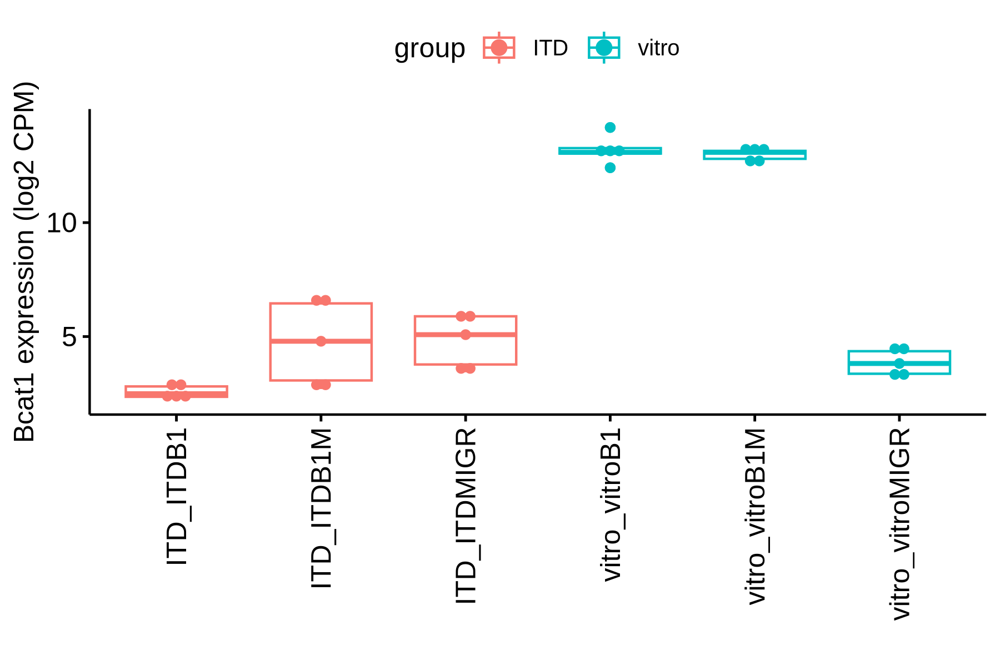

In [487]:
plotdat = as.data.table(tmp_mmu['Bcat1',], keep.rownames = T)
plotdat = merge(plotdat, dsn_rna[, .(sample, grp, group)], by.x = 'V1', by.y = 'sample')
plotdat = plotdat[order(grp), ]
plotdat
ggboxplot(plotdat, x = 'grp', y = 'V2', add = 'dotplot', color = 'group') + rotate_x_text(90) + ylab('Bcat1 expression (log2 CPM)') + xlab('')


## maplot

In [444]:
table(deg_dt$.id)


        ITD_B1__ITD_MIGR          ITD_B1M__ITD_B1        ITD_B1M__ITD_MIGR     KitKI_B1KI__KitKI_WT KitOE_B1OE__KitOE_WTMIGR 
                   24411                    24411                    24411                    24411                    24411 
    LSKKI_B1KI__LSKKI_WT LSKOE_WTB1__LSKOE_WTMIGR     Vitro_B1__Vitro_MIGR      Vitro_B1M__Vitro_B1    Vitro_B1M__Vitro_MIGR 
                   24411                    24411                    24411                    24411                    24411 

In [325]:
cmp_sel = c('ITD_ITDMIGR__ITD_ITDB1', 'ITD_ITDB1M__ITD_ITDMIGR', 'ITD_ITDB1M__ITD_ITDB1', 
            'Kit_B1KI__Kit_B1KI_WT', 'LSK_B1KI__LSK_B1KI_WT', 
            'Kit_B1OE__Kit_B1OE_WT', 'LSK_B1OE__LSK_B1OE_WT', 
            'vitro_vitroB1__vitro_vitroMIGR', 'vitro_vitroB1M__vitro_vitroMIGR')


In [459]:
plotdat = deg_dt[padj < 0.05 & abs(log2FoldChange) > 1, ]
plotdat = as.data.table(table(plotdat$.id), keep.rownames = T)
#plotdat = plotdat[V1 %in% cmp_sel, ]
plotdat


V1,N
<chr>,<int>
ITD_B1__ITD_B1M,1775
ITD_B1__ITD_MIGR,3618
ITD_B1M__ITD_MIGR,4131
KitOE_B1OE__KitOE_WTMIGR,2
LSKKI_B1KI__LSKKI_WT,14
LSKOE_WTB1__LSKOE_WTMIGR,29
Vitro_B1__Vitro_B1M,6
Vitro_B1__Vitro_MIGR,17
Vitro_B1M__Vitro_MIGR,143


### ITD


   Dn    NS    Up 
  836 11970  2156 

Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


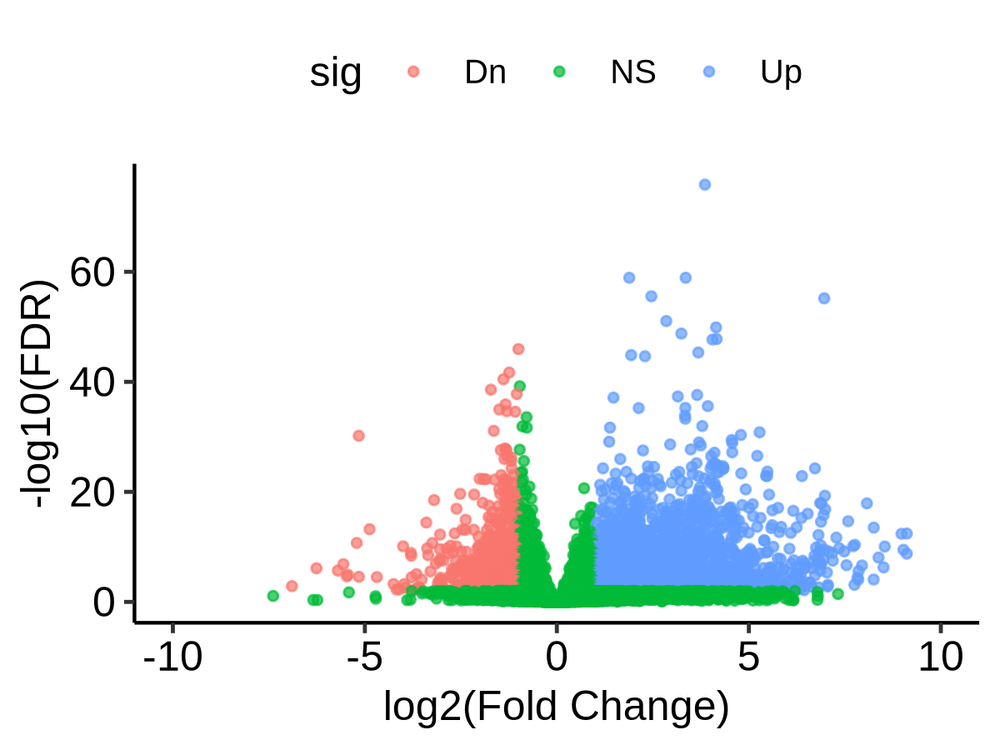

In [464]:
plotdat = deg_dt[.id == 'ITD_B1__ITD_MIGR', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]

plotdat[, sig := 'NS']
plotdat[padj < 0.01 & log2FoldChange > 1, sig := 'Up']
plotdat[padj < 0.01 & log2FoldChange < -1, sig := 'Dn']
plotdat[, logFDR := -log(padj, base = 10) ]
table(plotdat$sig)
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
p = ggplot(plotdat, aes(y = logFDR, x = log2FoldChange)) + geom_point(aes(color = sig),  size = 1, alpha = .7) + theme_pubr() + xlim(-10, 10) 
p = p + xlab('log2(Fold Change)') + ylab('-log10(FDR)')
p


In [465]:
table(deg_dt$.id)


         ITD_B1__ITD_B1M         ITD_B1__ITD_MIGR        ITD_B1M__ITD_MIGR     KitKI_B1KI__KitKI_WT KitOE_B1OE__KitOE_WTMIGR 
                   24411                    24411                    24411                    24411                    24411 
    LSKKI_B1KI__LSKKI_WT LSKOE_WTB1__LSKOE_WTMIGR      Vitro_B1__Vitro_B1M     Vitro_B1__Vitro_MIGR    Vitro_B1M__Vitro_MIGR 
                   24411                    24411                    24411                    24411                    24411 


   Dn    NS    Up 
 1485 11307  2170 

Warning message:
“Removed 7 rows containing missing values or values outside the scale range (`geom_point()`).”


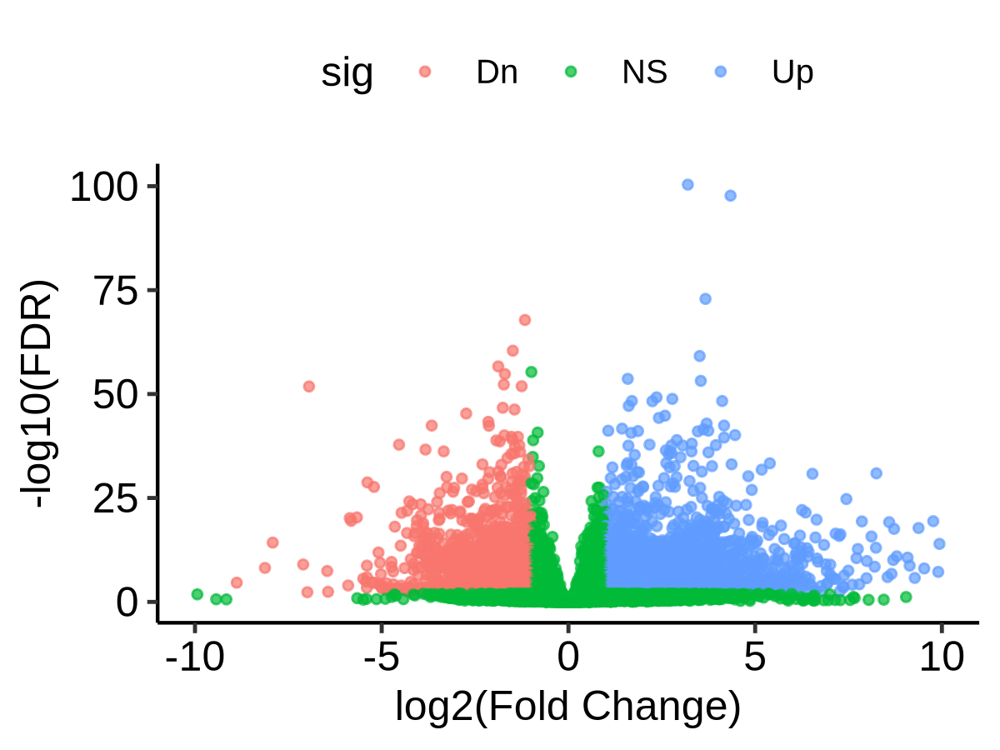

In [466]:
plotdat = deg_dt[.id == 'ITD_B1M__ITD_MIGR', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]

plotdat[, sig := 'NS']
plotdat[padj < 0.01 & log2FoldChange > 1, sig := 'Up']
plotdat[padj < 0.01 & log2FoldChange < -1, sig := 'Dn']
plotdat[, logFDR := -log(padj, base = 10) ]
table(plotdat$sig)
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
p = ggplot(plotdat, aes(y = logFDR, x = log2FoldChange)) + geom_point(aes(color = sig),  size = 1, alpha = .7) + theme_pubr() + xlim(-10, 10) 
p = p + xlab('log2(Fold Change)') + ylab('-log10(FDR)')
p



   Dn    NS    Up 
  446 13413   731 

Warning message:
“Removed 2 rows containing missing values or values outside the scale range (`geom_point()`).”


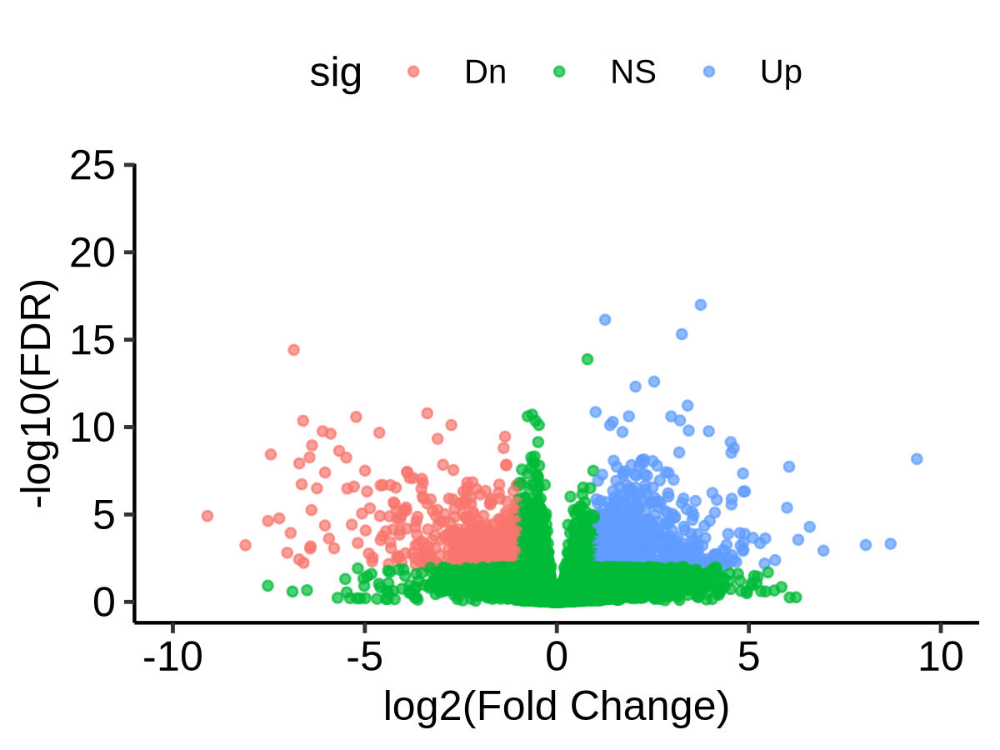

In [467]:
plotdat = deg_dt[.id == 'ITD_B1__ITD_B1M', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]

plotdat[, sig := 'NS']
plotdat[padj < 0.01 & log2FoldChange > 1, sig := 'Up']
plotdat[padj < 0.01 & log2FoldChange < -1, sig := 'Dn']
plotdat[, logFDR := -log(padj, base = 10) ]
table(plotdat$sig)
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
p = ggplot(plotdat, aes(y = logFDR, x = log2FoldChange)) + geom_point(aes(color = sig),  size = 1, alpha = .7) + theme_pubr() + xlim(-10, 10) 
p = p + xlab('log2(Fold Change)') + ylab('-log10(FDR)')
p


### Kit


   NS    Up 
19418     1 

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V12,length,effective_length,expected_count,TPM,FPKM,updn,FDR,sig,logFDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<chr>,<dbl>
Bcat1,Kit_B1OE__Kit_B1OE_WT,3667.8380366,8.31628183,0.8911724,9.3318441,1.040446e-20,2.020443e-16,NM_001024468,chr6,⋯,"0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852.0,7688.43,9452.00,278.46,235.39,up,2.020443e-16,Up,15.69455340
Tmem254c,Kit_B1OE__Kit_B1OE_WT,25.1053554,21.11280768,4.3465628,4.8573571,1.189629e-06,1.155070e-02,NM_001270498,chr14,⋯,"0,1524,1800,3300,",1269.0,1105.43,7.78,1.59,1.35,up,1.155070e-02,NS,1.93739154
Atp1a2,Kit_B1OE__Kit_B1OE_WT,42.9828236,3.68568771,0.9721938,3.7911040,1.499792e-04,9.708151e-01,NM_178405,chr1,⋯,"0,4209,4412,6548,6826,7162,7604,7959,8227,8860,12791,13060,13945,14255,14489,15491,17592,18544,18902,19484,21618,21863,26172,",6227.0,6063.43,17.00,0.64,0.54,up,9.708151e-01,NS,0.01286349
0610005C13Rik,Kit_B1OE__Kit_B1OE_WT,0.1010885,0.00000000,8.8146698,0.0000000,1.000000e+00,1.000000e+00,NR_038165,chr7,⋯,"0,6618,6813,7332,",1018.5,854.93,0.00,0.00,0.00,NA,1.000000e+00,NS,0.00000000
0610007P14Rik,Kit_B1OE__Kit_B1OE_WT,349.3517057,0.05654805,0.1460617,0.3871517,6.986439e-01,1.000000e+00,NM_021446,chr12,⋯,"0,861,4024,6633,9016,",1185.0,1021.43,196.00,43.46,36.74,up,1.000000e+00,NS,0.00000000
0610009B22Rik,Kit_B1OE__Kit_B1OE_WT,100.2595567,-0.01854203,0.1829313,-0.1013606,9.192642e-01,1.000000e+00,NM_025319,chr11,⋯,"0,3163,",795.0,631.43,48.00,17.22,14.55,dn,1.000000e+00,NS,0.00000000


Warning message:
“Removed 1 row containing missing values or values outside the scale range (`geom_point()`).”


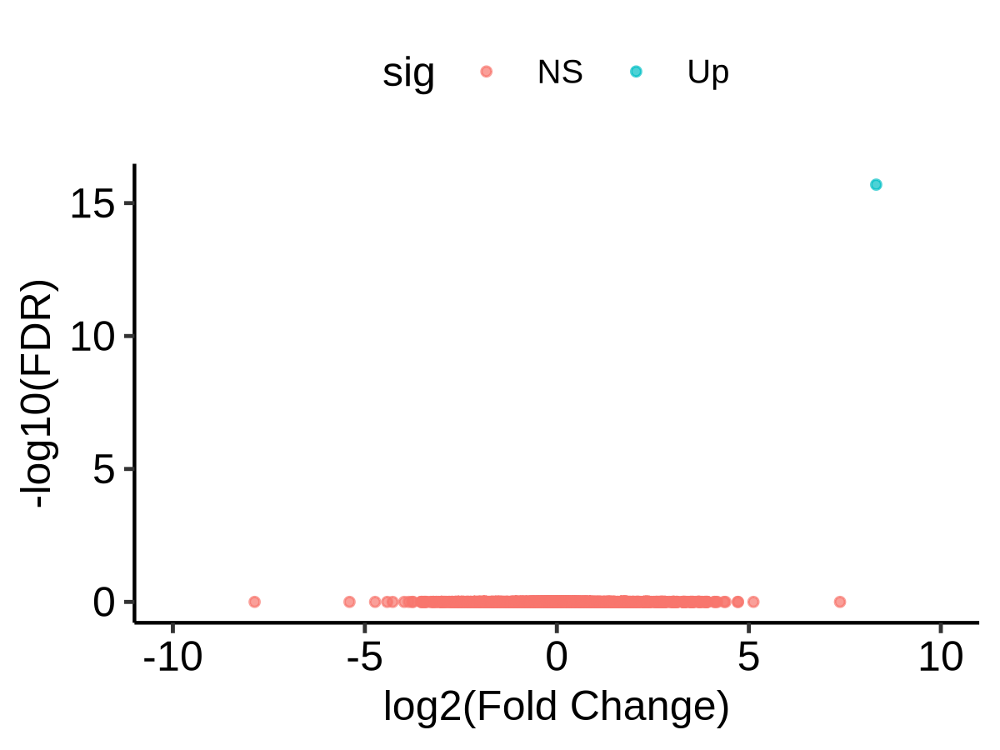

In [368]:
plotdat = deg_dt[.id == 'Kit_B1OE__Kit_B1OE_WT', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]
plotdat[, sig := 'NS']
plotdat[padj < 0.01 & log2FoldChange > 1, sig := 'Up']
plotdat[padj < 0.01 & log2FoldChange < -1, sig := 'Dn']
plotdat[, logFDR := -log(padj, base = 10) ]
table(plotdat$sig)

head(plotdat)

options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
p = ggplot(plotdat, aes(y = logFDR, x = log2FoldChange)) + geom_point(aes(color = sig),  size = 1, alpha = .7) + theme_pubr() + xlim(-10, 10) 
p = p + xlab('log2(Fold Change)') + ylab('-log10(FDR)')
p



   NS 
19419 

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V12,length,effective_length,expected_count,TPM,FPKM,updn,FDR,sig,logFDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<chr>,<dbl>
Bcat1,Kit_B1KI__Kit_B1KI_WT,3667.838,2.028116,0.8841427,2.293878,0.0217975,1,NM_001024468,chr6,⋯,"0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,up,1,NS,0


rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V12,length,effective_length,expected_count,TPM,FPKM,updn,FDR,sig,logFDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<chr>,<dbl>
Fosb,Kit_B1KI__Kit_B1KI_WT,30.1356730,-6.1326477,1.3374662,-4.5852730,4.533936e-06,0.0880445,NM_008036,chr7,⋯,"0,3863,4424,6610,",3776.0,3612.43,14.00,0.88,0.74,dn,0.0880445,NS,1.0552978
Cd3d,Kit_B1KI__Kit_B1KI_WT,59.7671833,2.7971386,0.6757833,4.1391061,3.486617e-05,0.2053966,NM_013487,chr9,⋯,"0,3184,3818,4271,4487,",1330.0,1166.43,57.00,11.07,9.36,up,0.2053966,NS,0.6874068
Hist1h2ai,Kit_B1KI__Kit_B1KI_WT,25.0236022,-5.2738272,1.2542662,-4.2047112,2.614157e-05,0.2053966,NM_178182,chr13,⋯,"0,",448.0,284.60,5.42,4.31,3.64,dn,0.2053966,NS,0.6874068
Tubb1,Kit_B1KI__Kit_B1KI_WT,64.5072246,-3.1941998,0.7801200,-4.0944982,4.230837e-05,0.2053966,NM_001080971,chr2,⋯,"0,5062,5995,6209,",2004.0,1840.43,60.00,7.38,6.24,dn,0.2053966,NS,0.6874068
0610005C13Rik,Kit_B1KI__Kit_B1KI_WT,0.1010885,0.0000000,8.8146698,0.0000000,1.000000e+00,1.0000000,NR_038165,chr7,⋯,"0,6618,6813,7332,",1018.5,854.93,0.00,0.00,0.00,NA,1.0000000,NS,0.0000000
0610007P14Rik,Kit_B1KI__Kit_B1KI_WT,349.3517057,-0.1417849,0.1451668,-0.9767036,3.287159e-01,1.0000000,NM_021446,chr12,⋯,"0,861,4024,6633,9016,",1185.0,1021.43,196.00,43.46,36.74,dn,1.0000000,NS,0.0000000


Warning message:
“Removed 1 row containing missing values or values outside the scale range (`geom_point()`).”


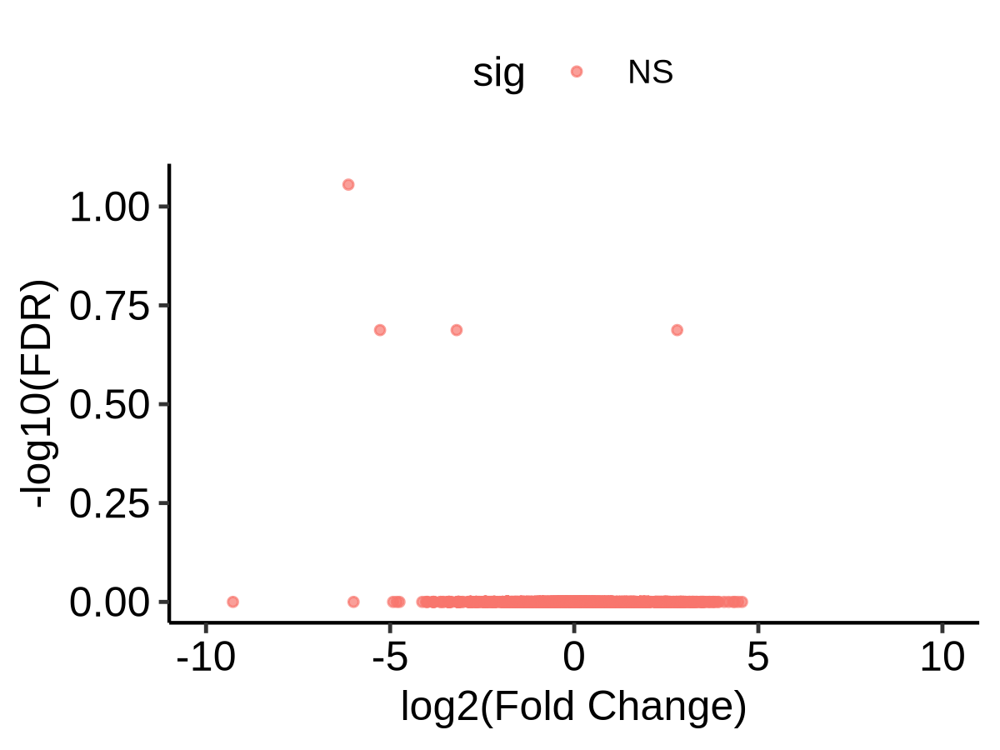

In [370]:
plotdat = deg_dt[.id == 'Kit_B1KI__Kit_B1KI_WT', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]
plotdat[, sig := 'NS']
plotdat[padj < 0.01 & log2FoldChange > 1, sig := 'Up']
plotdat[padj < 0.01 & log2FoldChange < -1, sig := 'Dn']
plotdat[, logFDR := -log(padj, base = 10) ]
table(plotdat$sig)
plotdat[rn == 'Bcat1', ]

head(plotdat)

options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
p = ggplot(plotdat, aes(y = logFDR, x = log2FoldChange)) + geom_point(aes(color = sig),  size = 1, alpha = .7) + theme_pubr() + xlim(-10, 10) 
p = p + xlab('log2(Fold Change)') + ylab('-log10(FDR)')
p


### LSK

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM,updn,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
4921525O09Rik,LSK_B1KI__LSK_B1KI_WT,9.037077,-46.349139,2.529182,-18.325742,5.157309e-75,7.907702e-71,NR_045061,chr13,⋯,8,"100,304,86,525,422,137,585,1113,","0,1801,2553,21426,22397,23325,25416,26307,",3272,3108.43,0.00,0.00,0.00,dn,7.907702e-71
Wscd1,LSK_B1KI__LSK_B1KI_WT,9.670448,21.520026,2.239968,9.607293,7.448167e-22,5.710137e-18,NM_177618,chr11,⋯,9,"123,689,115,185,122,160,165,201,978,","0,8875,16086,17926,21150,32555,33566,37015,37966,",2738,2574.43,1.00,0.09,0.07,up,5.710137e-18
Atp6v0c-ps2,LSK_B1KI__LSK_B1KI_WT,280.108334,20.887558,3.140650,6.650711,2.916806e-11,1.490780e-07,NR_037854,chr17,⋯,3,"744,184,190,","0,834,5341,",1118,954.43,0.00,0.00,0.00,up,1.490780e-07
5730488B01Rik,LSK_B1KI__LSK_B1KI_WT,24.833374,-15.660658,2.786067,-5.621062,1.897867e-08,7.274997e-05,NR_073462,chr4,⋯,1,"2311,","0,",2311,2147.43,1.00,0.11,0.09,dn,7.274997e-05
Tnc,LSK_B1KI__LSK_B1KI_WT,126.315328,-7.334781,1.469359,-4.991824,5.981169e-07,1.834185e-03,NM_011607,chr4,⋯,26,"759,164,162,97,152,133,131,144,120,144,123,273,273,273,273,273,264,90,186,270,157,116,264,1410,582,267,","0,2202,4813,5799,6726,7432,10529,11373,12893,15417,16661,22866,33242,35756,40128,40913,46461,47563,47897,48829,53283,54144,55110,57046,60359,86964,",7100,6936.43,109.00,3.56,3.01,dn,1.834185e-03
Tmem254c,LSK_B1KI__LSK_B1KI_WT,25.105355,-20.551003,4.349862,-4.724518,2.306613e-06,5.894550e-03,NM_001270498,chr14,⋯,4,"910,60,104,375,","0,1524,1800,3300,",1269,1105.43,7.78,1.59,1.35,dn,5.894550e-03



   Dn    NS    Up 
    4 15327     2 

Warning message:
“Removed 5 rows containing missing values or values outside the scale range (`geom_point()`).”


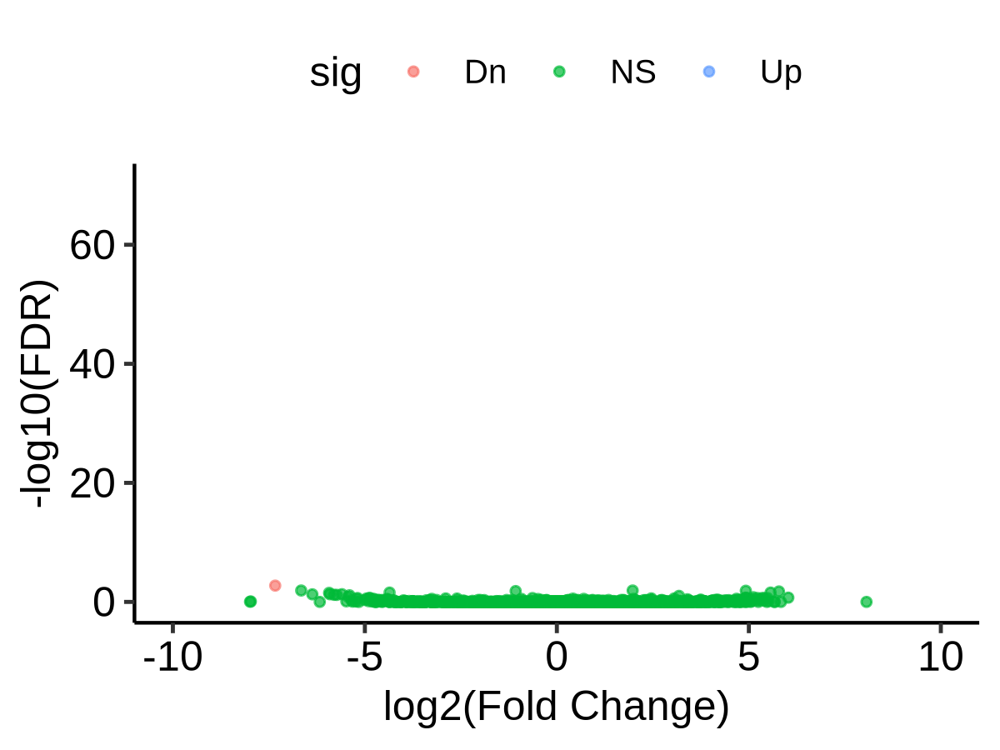

In [374]:
plotdat = deg_dt[.id == 'LSK_B1KI__LSK_B1KI_WT', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]
head(plotdat)

plotdat[, sig := 'NS']
plotdat[padj < 0.01 & log2FoldChange > 1, sig := 'Up']
plotdat[padj < 0.01 & log2FoldChange < -1, sig := 'Dn']
plotdat[, logFDR := -log(padj, base = 10) ]
table(plotdat$sig)
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
p = ggplot(plotdat, aes(y = logFDR, x = log2FoldChange)) + geom_point(aes(color = sig),  size = 1, alpha = .7) + theme_pubr() + xlim(-10, 10) 
p = p + xlab('log2(Fold Change)') + ylab('-log10(FDR)')
p


rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM,updn,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
Bcat1,LSK_B1OE__LSK_B1OE_WT,3667.83804,7.662563,0.9035686,8.480334,2.245477e-17,2.841905e-13,NM_001024468,chr6,⋯,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,up,2.841905e-13
Tmem255a,LSK_B1OE__LSK_B1OE_WT,31.24418,18.132699,2.1530627,8.421817,3.706913e-17,2.841905e-13,NM_001289727,chrX,⋯,10,"726,144,163,89,72,69,90,63,143,238,","0,11437,18605,28008,28481,30315,36530,39268,49143,55671,",3362,3198.43,2,0.14,0.12,up,2.841905e-13
6330403A02Rik,LSK_B1OE__LSK_B1OE_WT,52.98491,-17.989366,2.1887879,-8.218871,2.054272e-16,9.751729e-13,NM_001081227,chr1,⋯,4,"5991,9,180,377,","0,6733,10171,50755,",6557,6393.43,1,0.04,0.03,dn,9.751729e-13
Atp6v0c-ps2,LSK_B1OE__LSK_B1OE_WT,280.10833,-25.699530,3.1366952,-8.193187,2.543985e-16,9.751729e-13,NR_037854,chr17,⋯,3,"744,184,190,","0,834,5341,",1118,954.43,0,0.00,0.00,dn,9.751729e-13
Prss12,LSK_B1OE__LSK_B1OE_WT,76.98402,17.472291,2.5619082,6.820030,9.102131e-12,2.791259e-08,NM_008939,chr3,⋯,11,"724,151,179,142,197,142,206,79,123,281,383,","0,17824,31064,32652,35761,38510,40044,42643,44589,58365,59307,",2607,2443.43,1,0.09,0.08,up,2.791259e-08
Igf2bp3,LSK_B1OE__LSK_B1OE_WT,33.30442,-15.957445,2.4549376,-6.500143,8.024376e-11,2.050629e-07,NM_023670,chr6,⋯,15,"2223,114,132,75,117,126,136,123,135,282,64,52,49,61,658,","0,2550,3212,5758,8922,18956,20352,22124,23708,31934,49477,49629,83252,128049,129079,",4347,4183.43,0,0.00,0.00,dn,2.050629e-07



   Dn    NS    Up 
    5 15321     7 

Warning message:
“Removed 6 rows containing missing values or values outside the scale range (`geom_point()`).”


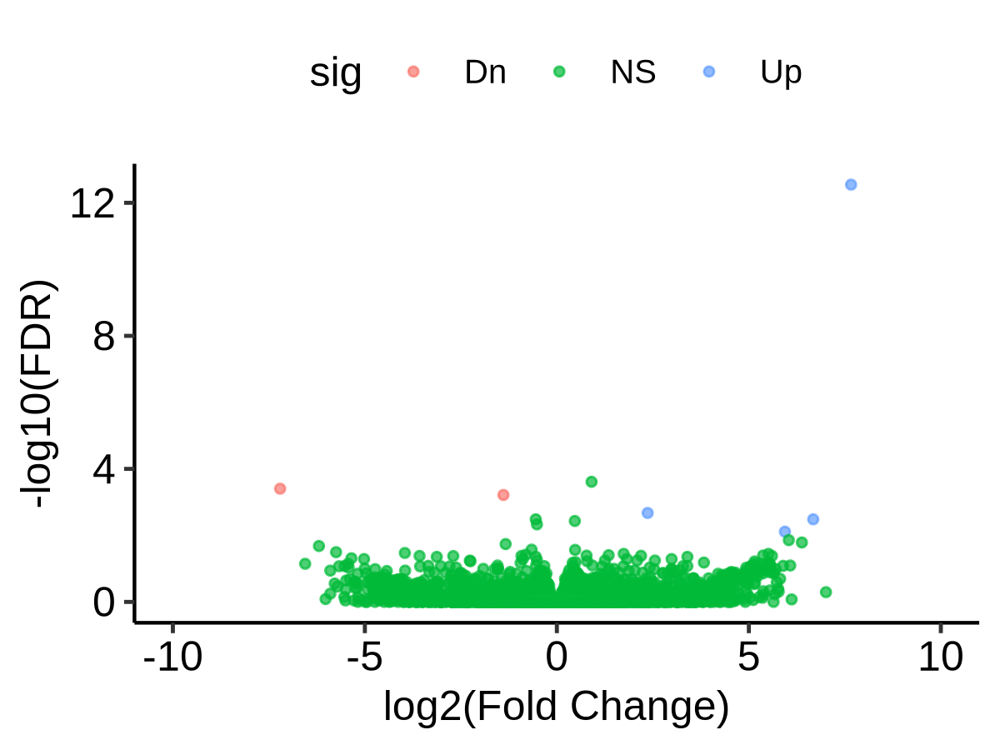

In [375]:
plotdat = deg_dt[.id == 'LSK_B1OE__LSK_B1OE_WT', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]
head(plotdat)

plotdat[, sig := 'NS']
plotdat[padj < 0.01 & log2FoldChange > 1, sig := 'Up']
plotdat[padj < 0.01 & log2FoldChange < -1, sig := 'Dn']
plotdat[, logFDR := -log(padj, base = 10) ]
table(plotdat$sig)
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
p = ggplot(plotdat, aes(y = logFDR, x = log2FoldChange)) + geom_point(aes(color = sig),  size = 1, alpha = .7) + theme_pubr() + xlim(-10, 10) 
p = p + xlab('log2(Fold Change)') + ylab('-log10(FDR)')
p


### vitro

In [376]:
table(deg_dt$.id)


         ITD_ITDB1__ITD_ITDMIGR           ITD_ITDB1M__ITD_ITDB1         ITD_ITDB1M__ITD_ITDMIGR           Kit_B1KI__Kit_B1KI_WT              Kit_B1KI__Kit_B1OE 
                          24411                           24411                           24411                           24411                           24411 
          Kit_B1KI__Kit_B1OE_WT           Kit_B1KI_WT__Kit_B1OE        Kit_B1KI_WT__Kit_B1OE_WT           Kit_B1OE__Kit_B1OE_WT           LSK_B1KI__LSK_B1KI_WT 
                          24411                           24411                           24411                           24411                           24411 
             LSK_B1KI__LSK_B1OE           LSK_B1KI__LSK_B1OE_WT           LSK_B1KI_WT__LSK_B1OE        LSK_B1KI_WT__LSK_B1OE_WT           LSK_B1OE__LSK_B1OE_WT 
                          24411                           24411                           24411                           24411                           24411 
 vitro_vitroB1__vitro_vitroMIGR  

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM,updn,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
Bcat1,vitro_vitroB1M__vitro_vitroMIGR,3667.838037,9.1265092,0.7063016,12.921546,3.402361e-38,4.585021e-34,NM_001024468,chr6,⋯,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852.0,7688.43,9452,278.46,235.39,up,4.585021e-34
Mobp,vitro_vitroB1M__vitro_vitroMIGR,13.203505,-20.4593617,1.8296725,-11.181980,4.996248e-29,3.366472e-25,NM_001039364,chr9,⋯,3,"56,210,2941,","0,18059,23409,",2664.0,2500.43,0,0.00,0.00,dn,3.366472e-25
Rrm2,vitro_vitroB1M__vitro_vitroMIGR,2784.735324,-0.8078196,0.1144132,-7.060544,1.658518e-12,7.450064e-09,NM_009104,chr12,⋯,10,"192,75,147,117,134,95,134,105,114,1067,","0,306,685,1071,2103,3193,3415,4407,4607,4826,",2180.0,2016.43,1161,130.42,110.24,dn,7.450064e-09
Cd24a,vitro_vitroB1M__vitro_vitroMIGR,7894.134107,-0.8735317,0.1299025,-6.724516,1.761775e-11,5.935419e-08,NM_009846,chr10,⋯,2,"154,1662,","0,3435,",1816.0,1652.43,3442,471.81,398.82,dn,5.935419e-08
Wnt5b,vitro_vitroB1M__vitro_vitroMIGR,41.498334,7.9194682,1.1968677,6.616829,3.669866e-11,9.891022e-08,NM_001271757,chr6,⋯,5,"1326,293,248,137,170,","0,7751,13804,15605,16686,",2122.3,1958.73,369,42.67,36.07,up,9.891022e-08
Galnt14,vitro_vitroB1M__vitro_vitroMIGR,8.140602,-25.9622251,3.9462469,-6.578966,4.737303e-11,1.063998e-07,NM_027864,chr17,⋯,15,"581,120,139,84,93,127,104,85,88,122,66,68,99,170,521,","0,1851,11100,11691,15775,18285,28867,31541,32485,41488,41771,43095,51274,81053,216180,",2467.0,2303.43,0,0.00,0.00,dn,1.063998e-07



   Dn    NS    Up 
   31 13416    29 

Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_point()`).”


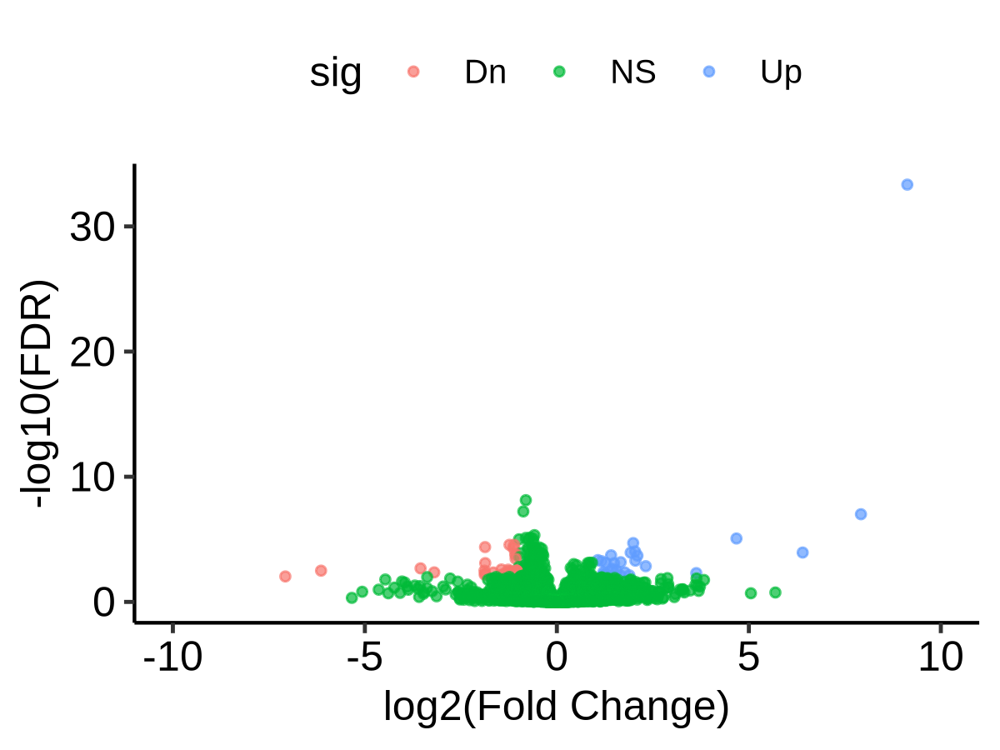

In [378]:
plotdat = deg_dt[.id == 'vitro_vitroB1M__vitro_vitroMIGR', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]
head(plotdat)

plotdat[, sig := 'NS']
plotdat[padj < 0.01 & log2FoldChange > 1, sig := 'Up']
plotdat[padj < 0.01 & log2FoldChange < -1, sig := 'Dn']
plotdat[, logFDR := -log(padj, base = 10) ]
table(plotdat$sig)
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
p = ggplot(plotdat, aes(y = logFDR, x = log2FoldChange)) + geom_point(aes(color = sig),  size = 1, alpha = .7) + theme_pubr() + xlim(-10, 10) 
p = p + xlab('log2(Fold Change)') + ylab('-log10(FDR)')
p


rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM,updn,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
Bcat1,vitro_vitroB1__vitro_vitroMIGR,3667.83804,9.4221406,0.7062747,13.340618,1.343419e-40,1.710710e-36,NM_001024468,chr6,⋯,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852.00,7688.43,9452,278.46,235.39,up,1.710710e-36
Procr,vitro_vitroB1__vitro_vitroMIGR,102.08344,2.1588837,0.3863017,5.588595,2.289147e-08,1.457500e-04,NM_011171,chr2,⋯,4,"248,258,288,710,","0,2128,3023,3552,",1504.00,1340.43,35,5.91,5.00,up,1.457500e-04
Ifitm1,vitro_vitroB1__vitro_vitroMIGR,822.08831,1.2103930,0.2460353,4.919591,8.672513e-07,3.681192e-03,NM_001112715,chr7,⋯,2,"363,339,","0,1413,",702.00,538.44,591,248.62,210.16,up,3.681192e-03
Csnk1e,vitro_vitroB1__vitro_vitroMIGR,513.55364,0.5208534,0.1108721,4.697787,2.629955e-06,8.372463e-03,NM_001289898,chr15,⋯,11,"1336,64,140,193,149,171,229,149,111,84,130,","0,2053,2732,2966,6988,7648,8407,11860,12203,20920,24076,",2809.36,2645.79,314,26.88,22.72,up,8.372463e-03
Casp12,vitro_vitroB1__vitro_vitroMIGR,93.89477,1.5257290,0.3388738,4.502351,6.720571e-06,9.500550e-03,NM_009808,chr9,⋯,11,"50,252,60,78,95,174,235,150,110,119,1282,","0,1006,3423,4924,6721,7196,8158,9058,12770,13249,26277,",2605.00,2441.43,65,6.03,5.10,up,9.500550e-03
Krt18,vitro_vitroB1__vitro_vitroMIGR,230.92811,1.2069437,0.2694010,4.480101,7.460775e-06,9.500550e-03,NM_010664,chr15,⋯,7,"459,83,157,165,126,224,186,","0,1250,1607,2403,2679,3080,3625,",1400.00,1236.43,114,20.88,17.65,up,9.500550e-03



   Dn    NS    Up 
    1 12727     6 

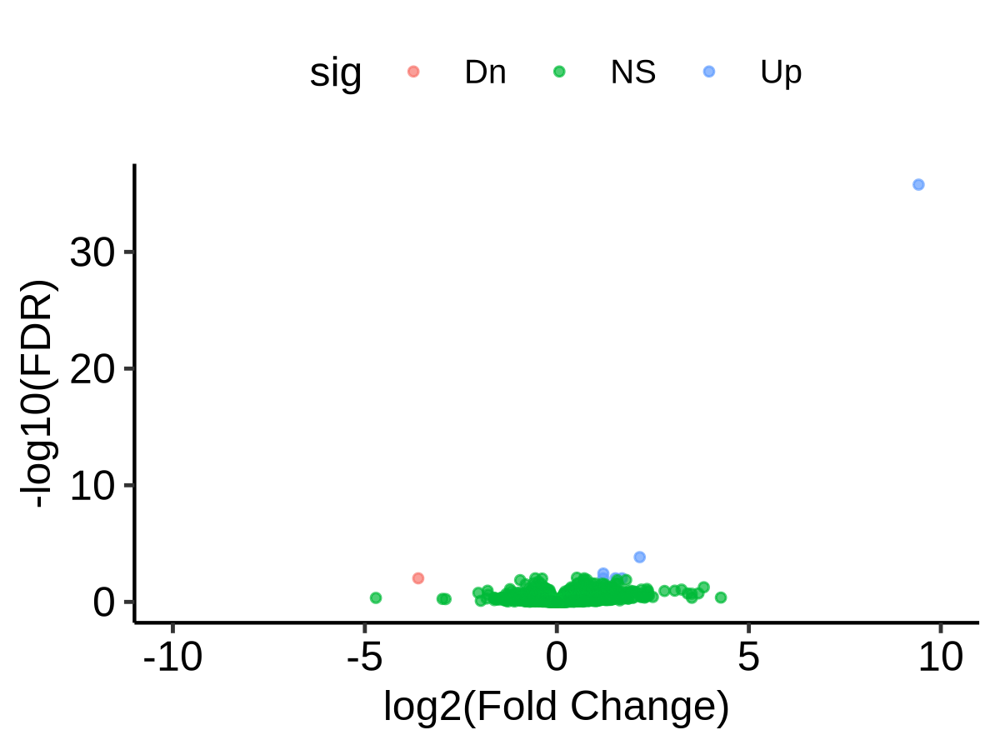

In [377]:
plotdat = deg_dt[.id == 'vitro_vitroB1__vitro_vitroMIGR', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]
head(plotdat)

plotdat[, sig := 'NS']
plotdat[padj < 0.01 & log2FoldChange > 1, sig := 'Up']
plotdat[padj < 0.01 & log2FoldChange < -1, sig := 'Dn']
plotdat[, logFDR := -log(padj, base = 10) ]
table(plotdat$sig)
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
p = ggplot(plotdat, aes(y = logFDR, x = log2FoldChange)) + geom_point(aes(color = sig),  size = 1, alpha = .7) + theme_pubr() + xlim(-10, 10) 
p = p + xlab('log2(Fold Change)') + ylab('-log10(FDR)')
p


## pathway analysis

In [73]:
#pathwaysDF <- msigdbr(species = "Mus musculus", category="C7") #, subcategory = 'IMMUNESIGDB') 
pathwaysDF <- msigdbr(species = "Mus musculus", category="C7") #, subcategory = 'VAX') 
pathwaysDF <- msigdbr(species = "Mus musculus", category="H") #, subcategory = 'immunesigdb') 
pathways <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)
pathways[1]


$HALLMARK_ADIPOGENESIS
  [1] "Abca1"    "Abcb8"    "Acaa2"    "Acadl"    "Acadm"    "Acads"    "Acly"     "Aco2"     "Acox1"    "Adcy6"    "Adig"     "Adipoq"   "Adipor2"  "Agpat3"  
 [15] "Aifm1"    "Ak2"      "Aldh2"    "Aldoa"    "Angpt1"   "Angptl4"  "Aplp2"    "Apoe"     "Araf"     "Arl4a"    "Atl2"     "Atp1b3"   "Atp5o"    "Baz2a"   
 [29] "Bckdha"   "Bcl2l13"  "Bcl6"     "C3"       "Cat"      "Cavin1"   "Cavin2"   "Ccng2"    "Cd151"    "Cd302"    "Cd36"     "Cdkn2c"   "Chchd10"  "Chuk"    
 [43] "Cidea"    "Cmbl"     "Cmpk1"    "Col15a1"  "Col4a1"   "Coq3"     "Coq5"     "Coq9"     "Cox6a1"   "Cox7b"    "Cox8a"    "Cpt2"     "Crat"     "Cs"      
 [57] "Cyc1"     "Cyp4b1"   "Dbt"      "Ddt"      "Decr1"    "Dgat1"    "Dhcr7"    "Dhrs7"    "Dhrs7b"   "Dlat"     "Dld"      "Dnajb9"   "Dnajc15"  "Dram2"   
 [71] "Ech1"     "Echs1"    "Elmod3"   "Elovl6"   "Enpp2"    "Ephx2"    "Esrra"    "Esyt1"    "Etfb"     "Fabp4"    "Fah"      "Fzd4"     "G3bp2"    "Gadd45a" 
 [85] "Gbe1"     "Ghitm"    "Gpam"     "Gpat4"    "Gpd2"     "Gphn"     "Gpx3"     "Gpx4"     "Grpel1"   "Hadh"     "Hibch"    "Hspb8"    "Idh1"     "Idh3a"   
 [99] "Idh3g"    "Ifngr1"   "Immt"     "Itga7"    "Itih5"    "Itsn1"    "Jagn1"    "Lama4"    "Lep"      "Lifr"     "Lipe"     "Lpcat3"   "Lpl"      "Ltc4s"   
[113] "Map4k3"   "Mccc1"    "Mdh2"     "Me1"      "Mgll"     "Mgst3"    "Miga2"    "Mrap"     "Mrpl15"   "Mtarc2"   "Mtch2"    "Mylk"     "Nabp1"    "Ndufa5"  
[127] "Ndufab1"  "Ndufb7"   "Ndufs3"   "Nkiras1"  "Nmt1"     "Omd"      "Orm1"     "Pdcd4"    "Pemt"     "Pex14"    "Pfkfb3"   "Pfkl"     "Pgm1"     "Phldb1"  
[141] "Phyh"     "Pim3"     "Plin2"    "Por"      "Pparg"    "Ppm1b"    "Ppp1r15b" "Prdx3"    "Preb"     "Ptcd3"    "Ptger3"   "Qdpr"     "Rab34"    "Reep5"   
[155] "Reep6"    "Retn"     "Retsat"   "Riok3"    "Rmdn3"    "Rnf11"    "Rreb1"    "Rtn3"     "Samm50"   "Scarb1"   "Scp2"     "Sdhb"     "Sdhc"     "Slc19a1" 
[169] "Slc1a5"   "Slc25a1"  "Slc25a10" "Slc27a1"  "Slc5a6"   "Pqlc3"    "Sncg"     "Sod1"     "Sorbs1"   "Sowahc"   "Sparcl1"  "Sqor"     "Sspn"     "Stat5a"  
[183] "Stom"     "Suclg1"   "Sult1a1"  "Taldo1"   "Tank"     "Tkt"      "Tob1"     "Tst"      "Ubc"      "Ubqln1"   "Uck1"     "Ucp2"     "Uqcr10"   "Uqcr11"  
[197] "Uqcrc1"   "Uqcrq"    "Vegfb"    "Ywhag"

### ITD_ITDB1__ITD_ITDMIGR

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (0.07% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_HEME_METABOLISM,8.955846e-11,4.477923e-09,0.8390889,0.8504213,1.543617,181,"Ctse, Bl...."
HALLMARK_MYOGENESIS,4.355190e-09,1.088797e-07,0.7614608,0.8291936,1.506066,183,"Tpm2, Tn...."
HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,1.264660e-04,2.107767e-03,0.5188481,0.7624173,1.382719,176,"Tpm2, My...."
HALLMARK_COAGULATION,5.864934e-04,7.331167e-03,0.4772708,0.7851079,1.412812,109,"Ctse, Mm...."
HALLMARK_APICAL_JUNCTION,1.101898e-03,1.009912e-02,0.4550599,0.7476971,1.360032,168,"Ctnna1, ...."
HALLMARK_INTERFERON_GAMMA_RESPONSE,1.413877e-03,1.009912e-02,0.4550599,0.7341979,1.335740,191,"Cxcl9, M...."


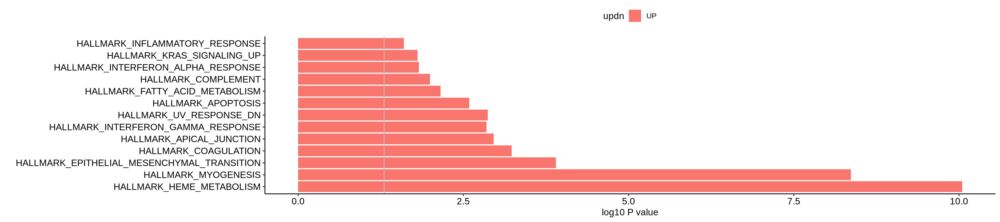

In [468]:
plotdat = deg_dt[.id == 'ITD_B1__ITD_MIGR', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]

plotdat[, ranking := -log2FoldChange*log10(padj)]
r_top = max(plotdat$ranking[is.finite(plotdat$ranking)])
r_bot = min(plotdat$ranking[is.finite(plotdat$ranking)])
xx = plotdat[ranking > r_top, ]
plotdat[ranking > r_top, ranking := r_top + 1:nrow(xx)]
xx = plotdat[ranking < r_bot, ]
plotdat[ranking < r_bot, ranking := r_bot - 1:nrow(xx)]
xx = plotdat[!is.na(ranking), ] 

ranked = plotdat$ranking
names(ranked) = plotdat$rn
ranked = sort(ranked, decreasing = TRUE)

fgsea <- fgsea(pathways = pathways, stats = ranked, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log(pval, 10)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[padj < 0.1, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 

options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr() + geom_hline(yintercept = -log(0.05, 10), color = 'grey')  + ylab('log10 P value') + xlab('')


### ITD_ITDB1M__ITD_ITDMIGR

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (0.07% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_HEME_METABOLISM,1.064708e-09,5.323542e-08,0.7881868,0.8219831,1.838614,181,"Ctse, Bl...."
HALLMARK_MYC_TARGETS_V1,1.104664e-02,1.841106e-01,0.3807304,0.6365015,1.432403,199,"Prdx4, X...."
HALLMARK_NOTCH_SIGNALING,7.552296e-03,1.841106e-01,0.4070179,0.8198002,1.489814,29,"Ccnd1, S...."
HALLMARK_APICAL_JUNCTION,4.270463e-02,2.439267e-01,0.2377938,0.6012276,1.336086,168,"Ctnna1, ...."
HALLMARK_APOPTOSIS,5.854241e-02,2.439267e-01,0.2020717,0.5872773,1.298586,153,"Nefh, Cc...."
HALLMARK_E2F_TARGETS,2.540819e-02,2.439267e-01,0.3524879,0.6161901,1.384513,194,"Prdx4, D...."


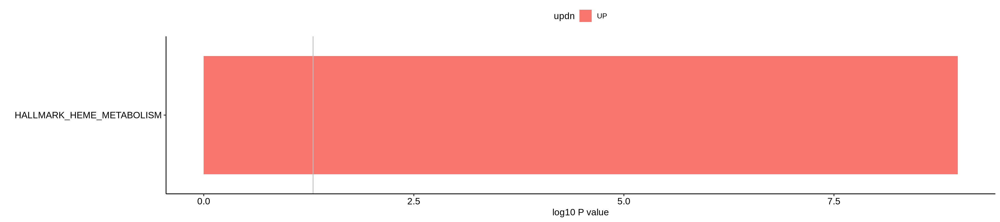

In [469]:
plotdat = deg_dt[.id == 'ITD_B1M__ITD_MIGR', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]

plotdat[, ranking := -log2FoldChange*log10(padj)]
r_top = max(plotdat$ranking[is.finite(plotdat$ranking)])
r_bot = min(plotdat$ranking[is.finite(plotdat$ranking)])
xx = plotdat[ranking > r_top, ]
plotdat[ranking > r_top, ranking := r_top + 1:nrow(xx)]
xx = plotdat[ranking < r_bot, ]
plotdat[ranking < r_bot, ranking := r_bot - 1:nrow(xx)]
xx = plotdat[!is.na(ranking), ] 

ranked = plotdat$ranking
names(ranked) = plotdat$rn
ranked = sort(ranked, decreasing = TRUE)

fgsea <- fgsea(pathways = pathways, stats = ranked, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log(pval, 10)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[padj < 0.1, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 

options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr() + geom_hline(yintercept = -log(0.05, 10), color = 'grey')  + ylab('log10 P value') + xlab('')


### ITD_ITDB1M__ITD_ITDB1

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (0.07% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_INTERFERON_GAMMA_RESPONSE,7.641122e-05,0.003820561,0.5384341,0.7019251,1.625439,190,"Gbp4, Cx...."
HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,3.585023e-03,0.071785055,0.4317077,0.6470177,1.476633,173,"Itgb3, A...."
HALLMARK_MYOGENESIS,4.307103e-03,0.071785055,0.4070179,0.6232918,1.434178,181,"Cryab, F...."
HALLMARK_COMPLEMENT,7.159632e-03,0.089495394,0.4070179,0.6134004,1.409556,180,"Hspa1a, ...."
HALLMARK_INFLAMMATORY_RESPONSE,1.110011e-02,0.111001064,0.3807304,0.6191126,1.417692,177,"Cxcl9, I...."
HALLMARK_APICAL_JUNCTION,1.512756e-02,0.126063003,0.3807304,0.6088949,1.387443,165,"Nrap, Ac...."


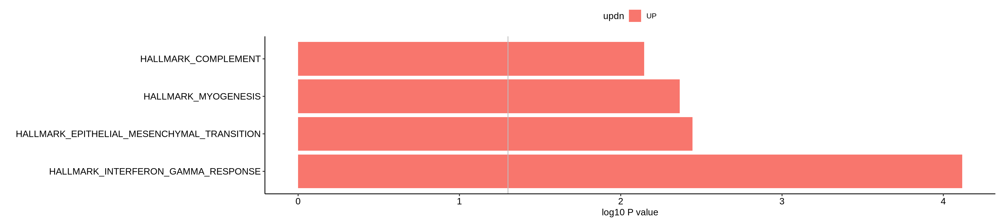

In [486]:
plotdat = deg_dt[.id == 'ITD_B1__ITD_B1M', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]

plotdat[, ranking := -log2FoldChange*log10(padj)]
r_top = max(plotdat$ranking[is.finite(plotdat$ranking)])
r_bot = min(plotdat$ranking[is.finite(plotdat$ranking)])
xx = plotdat[ranking > r_top, ]
plotdat[ranking > r_top, ranking := r_top + 1:nrow(xx)]
xx = plotdat[ranking < r_bot, ]
plotdat[ranking < r_bot, ranking := r_bot - 1:nrow(xx)]
xx = plotdat[!is.na(ranking), ] 

ranked = plotdat$ranking
names(ranked) = plotdat$rn
ranked = sort(ranked, decreasing = TRUE)

fgsea <- fgsea(pathways = pathways, stats = ranked, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log(pval, 10)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[padj < 0.1, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 

options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr() + geom_hline(yintercept = -log(0.05, 10), color = 'grey')  + ylab('log10 P value') + xlab('')


### others

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (0.01% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_HEME_METABOLISM,0.004927564,0.2463782,0.40701792,0.99927402,1.16463946,181,"Aqp3, Abcb6"
HALLMARK_CHOLESTEROL_HOMEOSTASIS,0.011638852,0.2909713,0.38073040,0.99954140,1.28051083,69,"Clu, Abca2"
HALLMARK_ADIPOGENESIS,0.359322034,0.9949410,0.08809450,0.97873633,1.14917807,193,"Cmbl, Pex14"
HALLMARK_ALLOGRAFT_REJECTION,0.900243309,0.9949410,0.05960370,-0.57583705,-0.70608195,188,"Cxcl9, C...."
HALLMARK_ANDROGEN_RESPONSE,0.959459459,0.9949410,0.05302125,-0.07208117,-0.09390481,90,"Zmiz1, Z...."
HALLMARK_ANGIOGENESIS,0.094298246,0.9949410,0.21654284,-0.99751618,-1.80787795,34,Col3a1


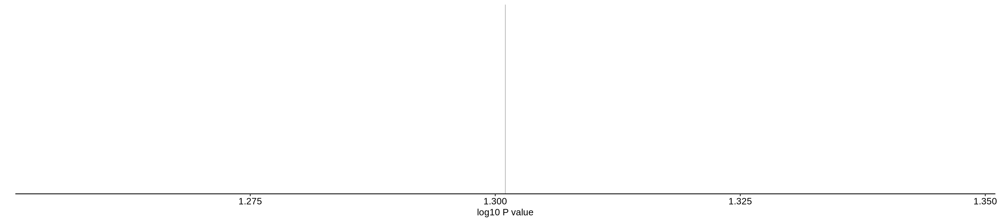

In [394]:
plotdat = deg_dt[.id == 'LSK_B1KI__LSK_B1KI_WT', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]

plotdat[, ranking := -log2FoldChange*log10(padj)]
r_top = max(plotdat$ranking[is.finite(plotdat$ranking)])
r_bot = min(plotdat$ranking[is.finite(plotdat$ranking)])
xx = plotdat[ranking > r_top, ]
plotdat[ranking > r_top, ranking := r_top + 1:nrow(xx)]
xx = plotdat[ranking < r_bot, ]
plotdat[ranking < r_bot, ranking := r_bot - 1:nrow(xx)]
xx = plotdat[!is.na(ranking), ] 

ranked = plotdat$ranking
names(ranked) = plotdat$rn
ranked = sort(ranked, decreasing = TRUE)

fgsea <- fgsea(pathways = pathways, stats = ranked, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log(pval, 10)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[padj < 0.1, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 

options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr() + geom_hline(yintercept = -log(0.05, 10), color = 'grey')  + ylab('log10 P value') + xlab('')


In [384]:
plotdat = deg_dt[.id == 'ITD_ITDB1__ITD_ITDMIGR', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]
length(fgseaRes[1, leadingEdge][[1]])
gene_sel = fgseaRes[1, leadingEdge][[1]]
head(plotdat[rn %in% gene_sel, ])

[1] 65

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM,updn,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
Ctse,ITD_ITDB1__ITD_ITDMIGR,3419.1250,-3.856945,0.2026733,-19.03035,9.560494e-81,1.430441e-76,NM_007799,chr1,⋯,10,"244,191,157,118,119,200,123,142,99,727,","0,23562,24299,24997,25970,29723,32372,33890,34131,36467,",2120.00,1956.43,969.00,112.19,94.83,dn,1.430441e-76
Blvrb,ITD_ITDB1__ITD_ITDMIGR,1567.7076,-4.052301,0.2681927,-15.10966,1.398547e-51,2.092506e-48,NM_001290525,chr7,⋯,5,"133,165,90,129,262,","0,6838,7145,10149,13302,",865.00,701.43,968.00,312.59,264.23,dn,2.092506e-48
Tspo2,ITD_ITDB1__ITD_ITDMIGR,254.0039,-4.553514,0.3822867,-11.91126,1.034076e-32,3.773621e-30,NM_027292,chr17,⋯,5,"366,142,188,190,49,","0,585,1448,2437,3018,",935.00,771.43,129.00,37.88,32.02,dn,3.773621e-30
Hbb-bt,ITD_ITDB1__ITD_ITDMIGR,15295.7255,-4.107810,0.3727026,-11.02168,3.003936e-28,6.809832e-26,NM_008220,chr7,⋯,3,"261,223,146,","0,915,1254,",630.00,466.44,12469.72,6055.34,5118.60,dn,6.809832e-26
Rhag,ITD_ITDB1__ITD_ITDMIGR,955.4850,-4.333900,0.4013243,-10.79900,3.479854e-27,6.675075e-25,NM_011269,chr17,⋯,10,"214,184,151,148,167,138,122,71,74,1047,","0,17214,17601,20041,20427,22260,23484,24868,25268,28559,",2316.00,2152.43,361.00,37.99,32.11,dn,6.675075e-25
Car1,ITD_ITDB1__ITD_ITDMIGR,6048.6373,-5.446603,0.5180363,-10.51394,7.451429e-26,1.198799e-23,NM_001083957,chr3,⋯,7,"439,156,63,96,119,198,113,","0,1190,3957,4594,10004,11515,12134,",1195.94,1032.37,2654.00,582.30,492.22,dn,1.198799e-23


## PCA

In [489]:
gene_sel = unique(deg_dt[padj < .05 & abs(log2FoldChange) > 1, ]) 
plotdat = logcpm_mmu[gene_sel$rn, ]
plotdat = pca_fun(plotdat) 
plotdat$plotdat = merge(plotdat$plotdat, dsn_rna[, .(`sample`, group, genotype)], by.x = 'rn', by.y = 'sample')


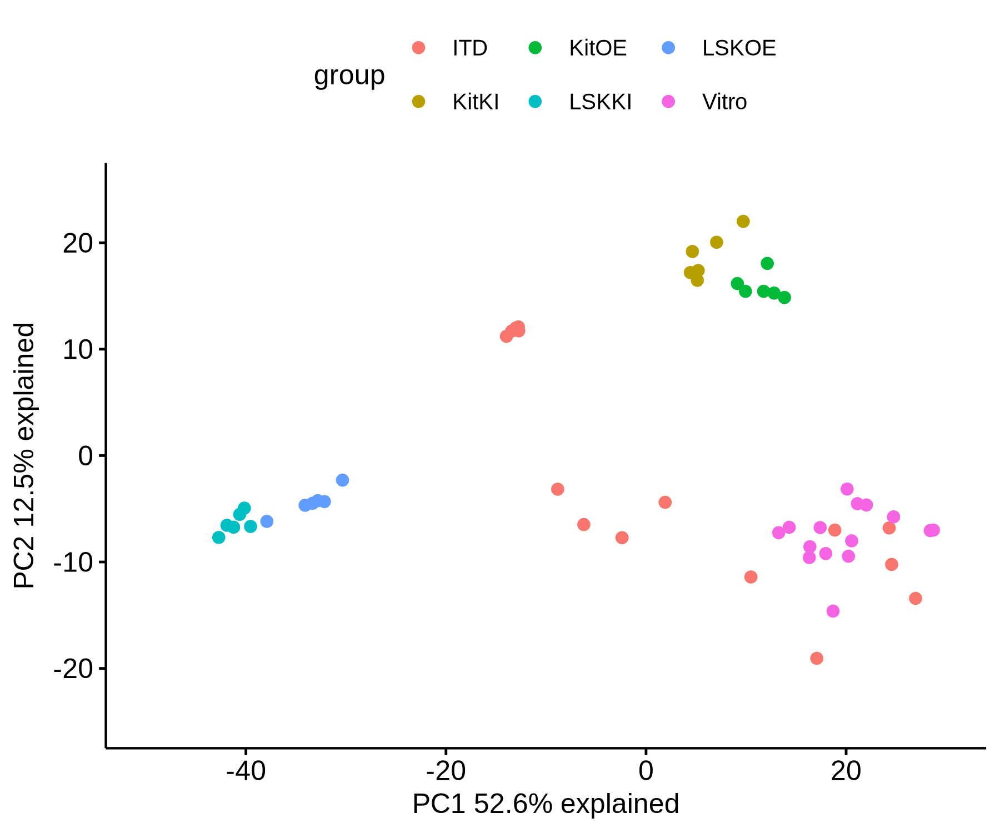

In [491]:
options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 300)
ggscatter(plotdat$plotdat, x = "PC1", y = "PC2", color = 'group') + xlab(plotdat$labx) +  ylab(plotdat$laby) + xlim(-50, 30) + ylim(-25, 25)


In [492]:
head(plotdat$plotdat)

rn,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,⋯,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,group,genotype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
JL_ITD_B1M_1_S26,-8.832526,-3.158923,6.140491,-18.7669194,15.043064,-9.64252504,4.4641970,3.4227623,-4.6127621,⋯,0.21640212,0.5224806,-0.07295202,-0.3083939,-0.22034060,0.2153592,0.002225072,4.080070e-15,ITD,B1M
JL_ITD_B1M_2_S27,24.307132,-6.802524,-2.496449,-0.8353349,-2.289699,-5.50461856,-3.5012897,1.1873834,6.9493038,⋯,-0.02608458,0.4145603,-0.25804140,-0.2351085,-0.22592031,0.1044725,0.132935407,-6.106227e-16,ITD,B1M
JL_ITD_B1M_3_S28,-6.222241,-6.481569,16.887282,30.2376980,13.932568,0.04744817,1.4251781,1.0141946,-1.3738952,⋯,-0.98977523,0.4738277,0.55373783,-0.7571168,-0.66742573,0.9776954,0.218293640,4.163336e-15,ITD,B1M
JL_ITD_B1M_4_S29,1.908578,-4.392318,3.181381,-13.6470026,10.870339,-8.16899875,1.1947786,1.7566706,-0.1023649,⋯,0.17641089,-0.9634576,0.54702023,0.3878840,-0.02769916,-0.3041505,-0.026939844,3.580469e-15,ITD,B1M
JL_ITD_B1M_5_S30,-2.401221,-7.715976,15.615877,29.6870992,12.702491,-0.40532554,2.0585183,0.3632219,-0.4605670,⋯,0.88296700,-0.4135866,-0.48220556,0.7742301,0.55339338,-1.0448908,-0.123990119,-3.663736e-15,ITD,B1M
JL_ITD_B1_1_S21,-12.763902,12.095636,-25.238330,4.8029517,3.074766,-2.17247696,-0.3280218,0.2055268,-1.0965055,⋯,-0.99760619,0.6082078,0.80260615,0.3344758,-0.81810319,0.4042548,-0.427555989,9.103829e-15,ITD,B1


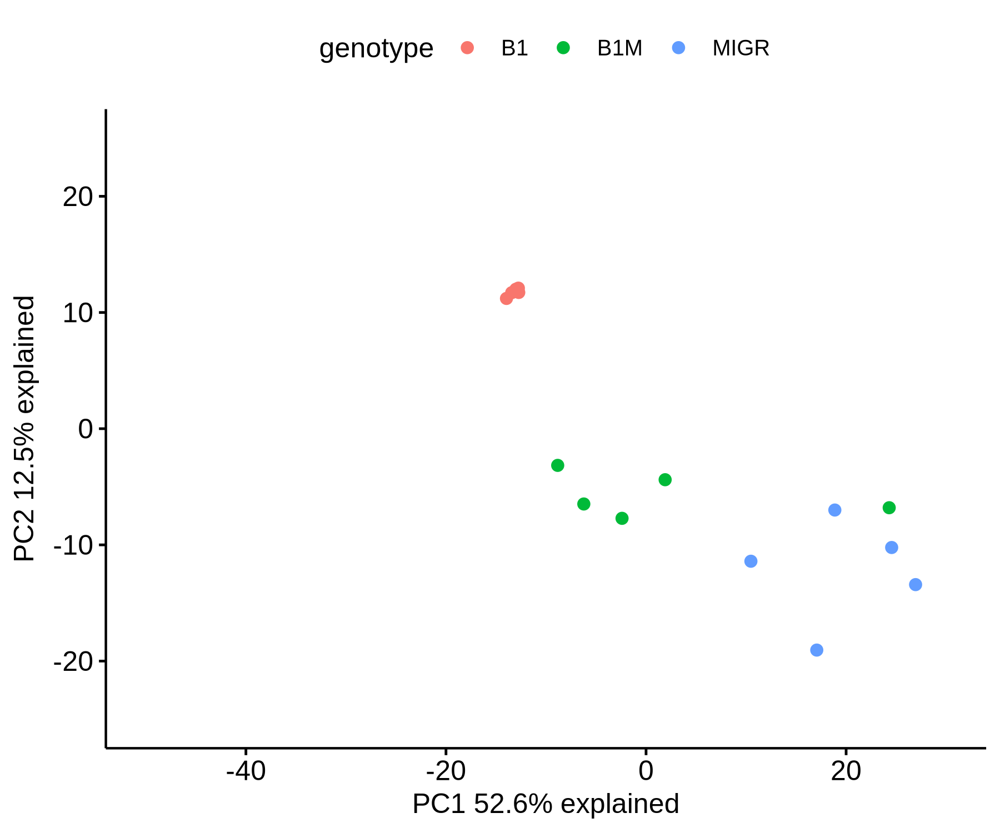

In [493]:
options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 300)
ggscatter(plotdat$plotdat[group == 'ITD', ], x = "PC1", y = "PC2", color = 'genotype') + xlab(plotdat$labx) +  ylab(plotdat$laby) + xlim(-50, 30) + ylim(-25, 25)


## heatmap

### ITD related

In [479]:
table(deg_dt$.id)


         ITD_B1__ITD_B1M         ITD_B1__ITD_MIGR        ITD_B1M__ITD_MIGR     KitKI_B1KI__KitKI_WT KitOE_B1OE__KitOE_WTMIGR 
                   24411                    24411                    24411                    24411                    24411 
    LSKKI_B1KI__LSKKI_WT LSKOE_WTB1__LSKOE_WTMIGR      Vitro_B1__Vitro_B1M     Vitro_B1__Vitro_MIGR    Vitro_B1M__Vitro_MIGR 
                   24411                    24411                    24411                    24411                    24411 

[1] 3618   26

[1] 3618   15

`use_raster` is automatically set to TRUE for a matrix with more than 2000 rows. You can control `use_raster`
argument by explicitly setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



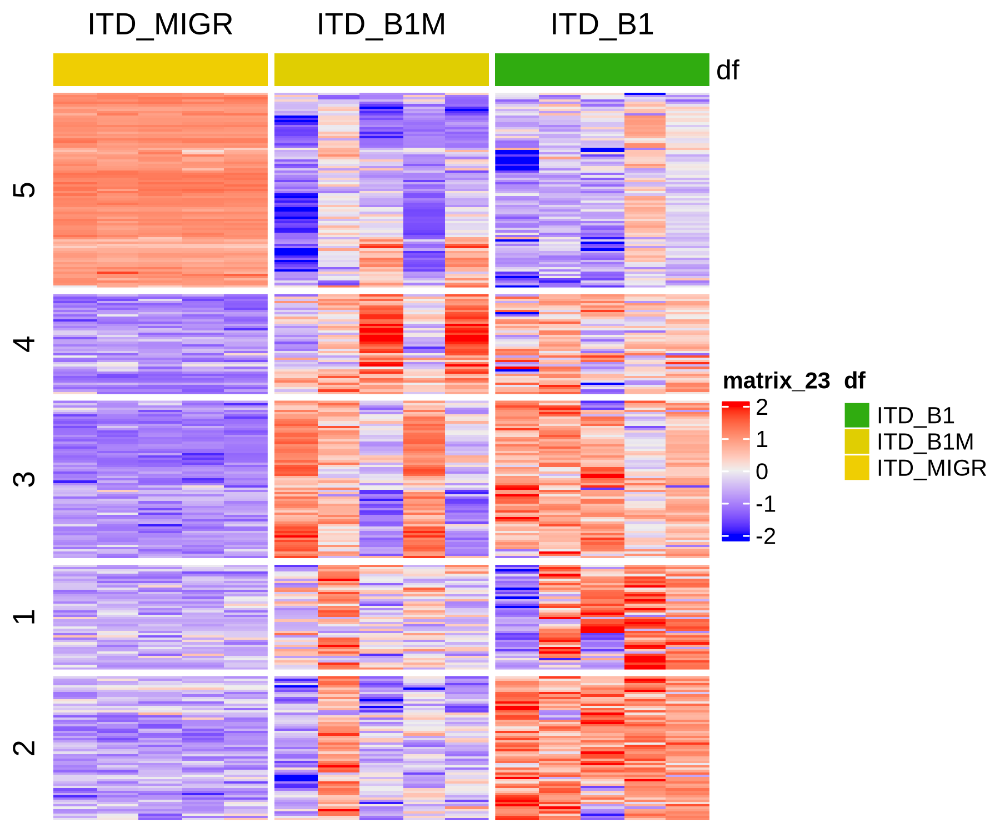

In [556]:
cmp_idt = c('ITD_B1__ITD_B1M', 'ITD_B1__ITD_MIGR', 'ITD_B1M__ITD_MIGR')
grp_idt = c('ITD_MIGR', 'ITD_B1M', 'ITD_B1')
dsn_idt = dsn_rna[grp %in% grp_idt, ]

gene_sel = deg_dt[.id %in% 'ITD_B1__ITD_MIGR' & padj < .05 & abs(log2FoldChange) > 1 & !is.na(updn), ][!duplicated(rn), ]
dim(gene_sel)

plotdat = logcpm_mmu[gene_sel$rn, dsn_idt$sample]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
dim(plotdat)

column_ha = HeatmapAnnotation(df = dsn_idt[, grp, drop = F])
#row_ha = rowAnnotation(df = dsn_rna[, .(updn)])
args = list(matrix = plotdat, top_annotation = column_ha, row_km = 5, # left_annotation = row_ha, 
                column_split = factor(dsn_idt$grp, levels = grp_idt), show_column_names = F, 
                show_row_names = F, show_column_dend = F, cluster_rows = T, cluster_columns = F, 
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)

options(repr.plot.width = 6, repr.plot.height=5, repr.plot.res = 300)

hp = do.call(Heatmap, args)
hp


In [ ]:
##### mar 
plotdat = logcpm_mmu[gene_sel$rn, dsn_idt$sample]

plotdat = cbind(plotdat, unname(unlist(apply(plotdat[, 11:15], 1, mean) )))
colnames(plotdat)[ncol(plotdat)] = 'IDT_MIGR'
plotdat = cbind(plotdat, unname(unlist(apply(plotdat[, 6:10], 1, mean) )))
colnames(plotdat)[ncol(plotdat)] = 'IDT_B1'
plotdat = cbind(plotdat, unname(unlist(apply(plotdat[, 1:5], 1, mean) )))
colnames(plotdat)[ncol(plotdat)] = 'IDT_B1M'
head(plotdat) 
plotdat = plotdat[, c('IDT_MIGR', 'IDT_B1', 'IDT_B1M')]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
dim(plotdat)

args = list(matrix = plotdat, row_km = 3, # left_annotation = row_ha, 
                show_row_names = F, show_column_dend = F, cluster_rows = T, cluster_columns = F, 
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)

options(repr.plot.width = 6, repr.plot.height=5, repr.plot.res = 300)

hp = do.call(Heatmap, args)
draw(hp) 

fname = '~/WenhuoHu/plot/mar/mouse_IDT_3group_mean_heatmap.pdf'
pdf(file = fname, width = 2, height = 4)
draw(hp)
dev.off()

#plotdat$IDT_MIGR = unlist(apply(plotdat[, 11:15], 1, mean) )
#plotdat$IDT_B1 = apply(plotdat[, 6:10], 1, mean) 
#plotdat$IDT_B1M = apply(plotdat[, 1:5], 1, mean) 

,JL_ITD_B1M_1_S26,JL_ITD_B1M_2_S27,JL_ITD_B1M_3_S28,JL_ITD_B1M_4_S29,JL_ITD_B1M_5_S30,JL_ITD_B1_1_S21,JL_ITD_B1_2_S22,JL_ITD_B1_3_S23,JL_ITD_B1_4_S24,JL_ITD_B1_5_S25,JL_ITD_MIGR_1_S16,JL_ITD_MIGR_2_S17,JL_ITD_MIGR_3_S18,JL_ITD_MIGR_4_S19,JL_ITD_MIGR_5_S20,IDT_MIGR,IDT_B1,IDT_B1M
1110006O24Rik,3.798857,2.939940,3.9419765,4.226394,4.3913576,2.973841,2.968202,3.081057,2.7035624,2.156558,3.185258,3.546903,5.204447,2.411483,4.459570,3.761532,2.776644,3.8597050
1110028F11Rik,4.030324,3.307195,0.0000000,4.309316,0.9022341,1.245648,2.260628,0.000000,0.8381259,1.620633,3.185258,3.022376,4.033303,3.269096,3.000127,3.302032,1.193007,2.5098137
1110032F04Rik,4.656544,5.193519,3.3642588,4.896881,2.6354637,1.245648,1.331591,1.317575,0.0000000,1.253021,5.631599,4.696976,2.614603,3.803292,3.663099,4.081914,1.029567,4.1493333
1110038B12Rik,8.406351,8.266761,9.3724985,8.685968,9.2070691,7.252885,7.545413,7.585232,7.5216201,7.487507,8.950894,7.672876,9.392995,8.023547,8.170070,8.442077,7.478531,8.7877296
1110046J04Rik,1.386658,1.689120,0.8838171,0.000000,0.0000000,0.000000,0.000000,0.000000,0.0000000,0.000000,0.000000,0.000000,2.614603,2.903099,2.502620,1.604065,0.000000,0.7919188
1300002E11Rik,7.758659,6.418439,6.1529102,7.825983,6.1922634,4.430871,4.969749,4.981652,4.7961146,4.655895,6.935960,7.200295,7.887094,6.131823,6.962076,7.023450,4.766856,6.8696508


[1] 3618    3

In [557]:
gene_sel = deg_dt[.id %in% 'ITD_B1__ITD_MIGR' & padj < .05 & abs(log2FoldChange) > 1 & !is.na(updn), ][!duplicated(rn), ]
dim(gene_sel)

plotdat = logcpm_mmu[gene_sel$rn, dsn_idt$sample]
head(plotdat)


[1] 3618   26

,JL_ITD_B1M_1_S26,JL_ITD_B1M_2_S27,JL_ITD_B1M_3_S28,JL_ITD_B1M_4_S29,JL_ITD_B1M_5_S30,JL_ITD_B1_1_S21,JL_ITD_B1_2_S22,JL_ITD_B1_3_S23,JL_ITD_B1_4_S24,JL_ITD_B1_5_S25,JL_ITD_MIGR_1_S16,JL_ITD_MIGR_2_S17,JL_ITD_MIGR_3_S18,JL_ITD_MIGR_4_S19,JL_ITD_MIGR_5_S20
1110006O24Rik,3.798857,2.939940,3.9419765,4.226394,4.3913576,2.973841,2.968202,3.081057,2.7035624,2.156558,3.185258,3.546903,5.204447,2.411483,4.459570
1110028F11Rik,4.030324,3.307195,0.0000000,4.309316,0.9022341,1.245648,2.260628,0.000000,0.8381259,1.620633,3.185258,3.022376,4.033303,3.269096,3.000127
1110032F04Rik,4.656544,5.193519,3.3642588,4.896881,2.6354637,1.245648,1.331591,1.317575,0.0000000,1.253021,5.631599,4.696976,2.614603,3.803292,3.663099
1110038B12Rik,8.406351,8.266761,9.3724985,8.685968,9.2070691,7.252885,7.545413,7.585232,7.5216201,7.487507,8.950894,7.672876,9.392995,8.023547,8.170070
1110046J04Rik,1.386658,1.689120,0.8838171,0.000000,0.0000000,0.000000,0.000000,0.000000,0.0000000,0.000000,0.000000,0.000000,2.614603,2.903099,2.502620
1300002E11Rik,7.758659,6.418439,6.1529102,7.825983,6.1922634,4.430871,4.969749,4.981652,4.7961146,4.655895,6.935960,7.200295,7.887094,6.131823,6.962076


[1] 1775   26

[1] 1775   10

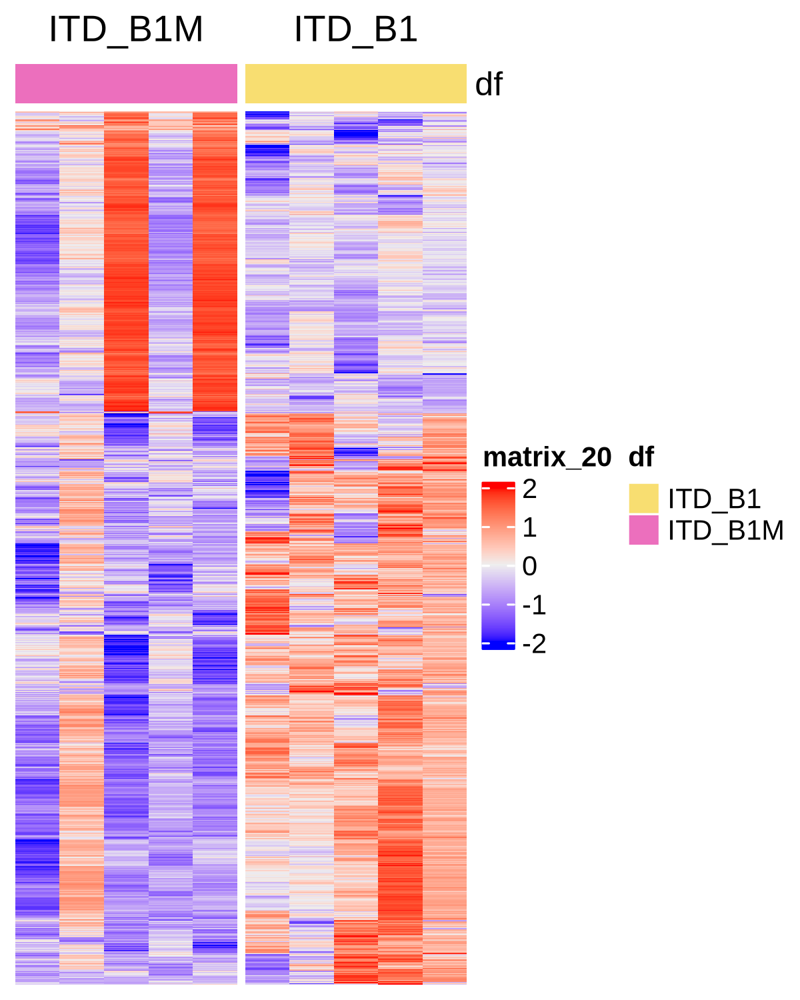

In [485]:
cmp_idt = c('ITD_B1__ITD_B1M')
grp_idt = c('ITD_B1M', 'ITD_B1')
dsn_idt = dsn_rna[grp %in% grp_idt, ]

options(repr.plot.width = 4, repr.plot.height=3, repr.plot.res = 300)
gene_sel = deg_dt[.id %in% cmp_idt & padj < .05 & abs(log2FoldChange) > 1 & !is.na(updn), ][!duplicated(rn), ]
dim(gene_sel)

plotdat = logcpm_mmu[gene_sel$rn, dsn_idt$sample]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
dim(plotdat)

column_ha = HeatmapAnnotation(df = dsn_idt[, grp, drop = F])
#row_ha = rowAnnotation(df = dsn_rna[, .(updn)])
args = list(matrix = plotdat, top_annotation = column_ha, # left_annotation = row_ha, 
                column_split = factor(dsn_idt$grp, levels = grp_idt), show_column_names = F, 
                show_row_names = F, show_column_dend = F, cluster_rows = T, cluster_columns = F, 
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)

options(repr.plot.width = 4, repr.plot.height=5, repr.plot.res = 300)

hp = do.call(Heatmap, args)
hp


[1] 3618   26

[1] 3618   10

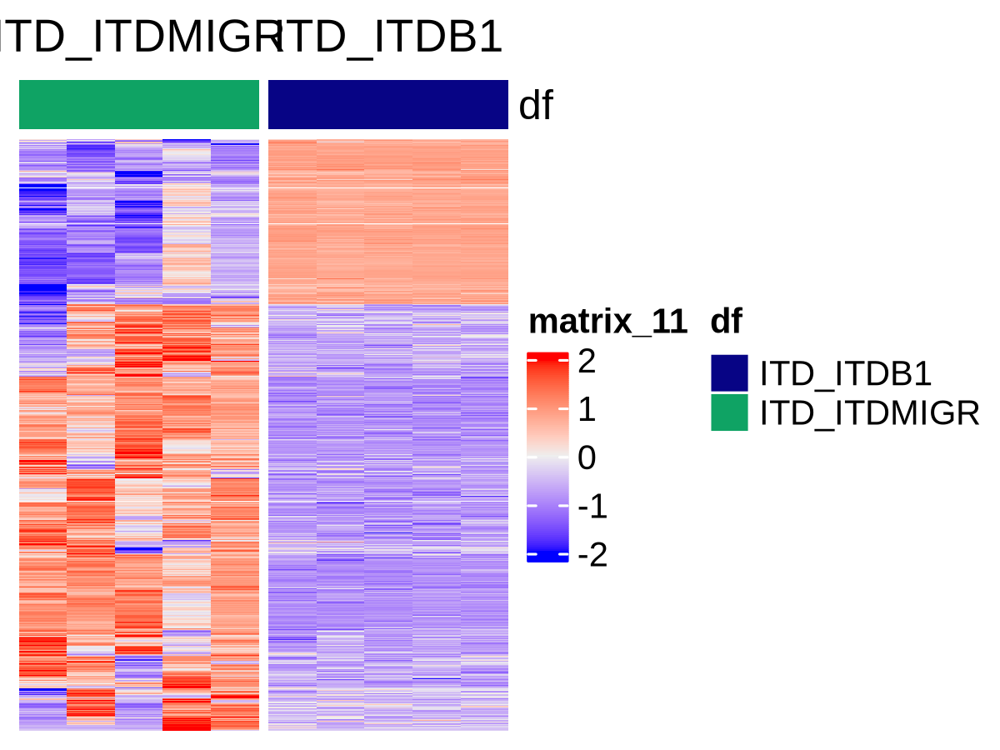

In [142]:
cmp_idt = c('ITD_ITDB1__ITD_ITDMIGR')
grp_idt = c('ITD_ITDMIGR', 'ITD_ITDB1')
dsn_idt = dsn_rna[grp %in% grp_idt, ]

gene_sel = deg_dt[.id %in% cmp_idt & padj < .05 & abs(log2FoldChange) > 1 & !is.na(updn), ][!duplicated(rn), ]
dim(gene_sel)

plotdat = logcpm_mmu[gene_sel$rn, dsn_idt$sample]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
dim(plotdat)

column_ha = HeatmapAnnotation(df = dsn_idt[, grp, drop = F])
#row_ha = rowAnnotation(df = dsn_rna[, .(updn)])
args = list(matrix = plotdat, top_annotation = column_ha, # left_annotation = row_ha, 
                column_split = factor(dsn_idt$grp, levels = grp_idt), show_column_names = F, 
                show_row_names = F, show_column_dend = F, cluster_rows = T, cluster_columns = F, 
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)

options(repr.plot.width = 4, repr.plot.height=3, repr.plot.res = 300)

hp = do.call(Heatmap, args)
hp


### others

In [349]:
groups = c('ITD', 'Kit', 'LSK', 'vitro')
hp_list = lapply(groups, function(group_ii){
    dsn_sel = dsn_rna[group == group_ii, ]
    gene_sel = unique(deg_dt[grepl(group_ii, .id) & padj < .05 & abs(log2FoldChange) > 1 & !is.na(updn), ])  
    plotdat = logcpm_mmu[gene_sel$rn, dsn_sel$sample]
    plotdat = scale_fun(plotdat)
    plotdat[plotdat > 2] = 2
    plotdat[plotdat < -2] = -2
    dim(plotdat)

    column_ha = HeatmapAnnotation(df = dsn_sel[, "genotype", drop = F])
    row_ha = rowAnnotation(df = gene_sel[, .(updn)])
    args = list(matrix = plotdat, top_annotation = column_ha, left_annotation = row_ha, 
                column_split = factor(dsn_sel$genotype, levels = group_sel), show_column_names = F, 
                show_row_names = F, show_column_dend = F, cluster_rows = T, cluster_columns = F, 
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)

    options(repr.plot.width = 8, repr.plot.height=4, repr.plot.res = 300)
    hp = do.call(Heatmap, args)
    hp
})



`use_raster` is automatically set to TRUE for a matrix with more than 2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

`use_raster` is automatically set to TRUE for a matrix with more than 2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



[1] 4131   15

`use_raster` is automatically set to TRUE for a matrix with more than 2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



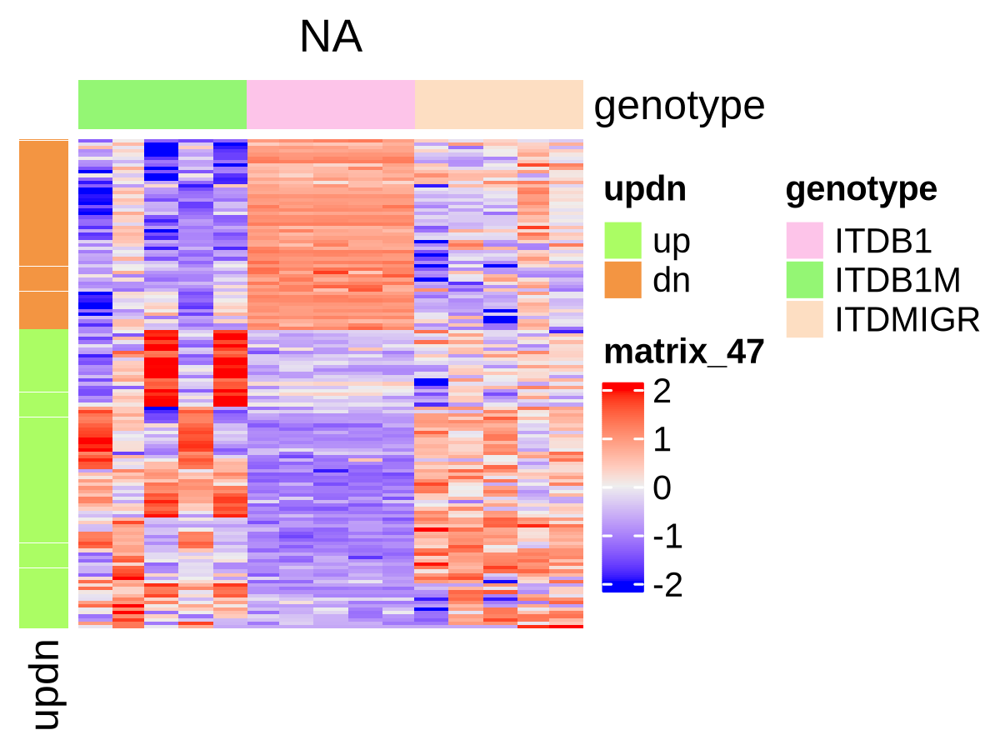

In [357]:
options(repr.plot.width = 4, repr.plot.height=3, repr.plot.res = 300)
groups = c('ITD', 'Kit', 'LSK', 'vitro')
group_ii = 'ITD'
dsn_sel = dsn_rna[group == group_ii, ]
gene_sel = unique(deg_dt[grepl(group_ii, .id) & padj < .05 & abs(log2FoldChange) > 1 & !is.na(updn), ])  
gene_sel = gene_sel[.id %in% c('ITD_ITDB1M__ITD_ITDB1', 'ITD_ITDB1__ITD_ITDB1'), ]
plotdat = logcpm_mmu[gene_sel$rn, dsn_sel$sample]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
dim(plotdat)

column_ha = HeatmapAnnotation(df = dsn_sel[, "genotype", drop = F])
row_ha = rowAnnotation(df = gene_sel[, .(updn)])
args = list(matrix = plotdat, top_annotation = column_ha, left_annotation = row_ha, 
                column_split = factor(dsn_sel$genotype, levels = group_sel), show_column_names = F, 
                show_row_names = F, show_column_dend = F, cluster_rows = T, cluster_columns = F, 
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)

options(repr.plot.width = 4, repr.plot.height=3, repr.plot.res = 300)

hp = do.call(Heatmap, args)
hp


In [360]:
groups = c('ITD', 'Kit', 'LSK', 'vitro')
group_ii = groups[2]
gene_sel = unique(deg_dt[grepl(group_ii, .id) & padj < .05 & abs(log2FoldChange) > 1 & !is.na(updn), ])  

table(gene_sel$.id)


      Kit_B1KI__Kit_B1OE    Kit_B1KI__Kit_B1OE_WT    Kit_B1KI_WT__Kit_B1OE Kit_B1KI_WT__Kit_B1OE_WT    Kit_B1OE__Kit_B1OE_WT 
                       6                        7                       17                       29                        2 

In [361]:
cmp_dt

.id,rn,grp1,grp2,tag
<chr>,<int>,<chr>,<chr>,<chr>
ITD,1,ITD_ITDB1M,ITD_ITDB1,ITD_ITDB1M__ITD_ITDB1
ITD,2,ITD_ITDB1M,ITD_ITDMIGR,ITD_ITDB1M__ITD_ITDMIGR
ITD,3,ITD_ITDB1,ITD_ITDMIGR,ITD_ITDB1__ITD_ITDMIGR
vitro,4,vitro_vitroB1M,vitro_vitroB1,vitro_vitroB1M__vitro_vitroB1
vitro,5,vitro_vitroB1M,vitro_vitroMIGR,vitro_vitroB1M__vitro_vitroMIGR
vitro,6,vitro_vitroB1,vitro_vitroMIGR,vitro_vitroB1__vitro_vitroMIGR
Kit,7,Kit_B1KI,Kit_B1KI_WT,Kit_B1KI__Kit_B1KI_WT
Kit,8,Kit_B1KI,Kit_B1OE,Kit_B1KI__Kit_B1OE
Kit,9,Kit_B1KI,Kit_B1OE_WT,Kit_B1KI__Kit_B1OE_WT


[1]  2 12

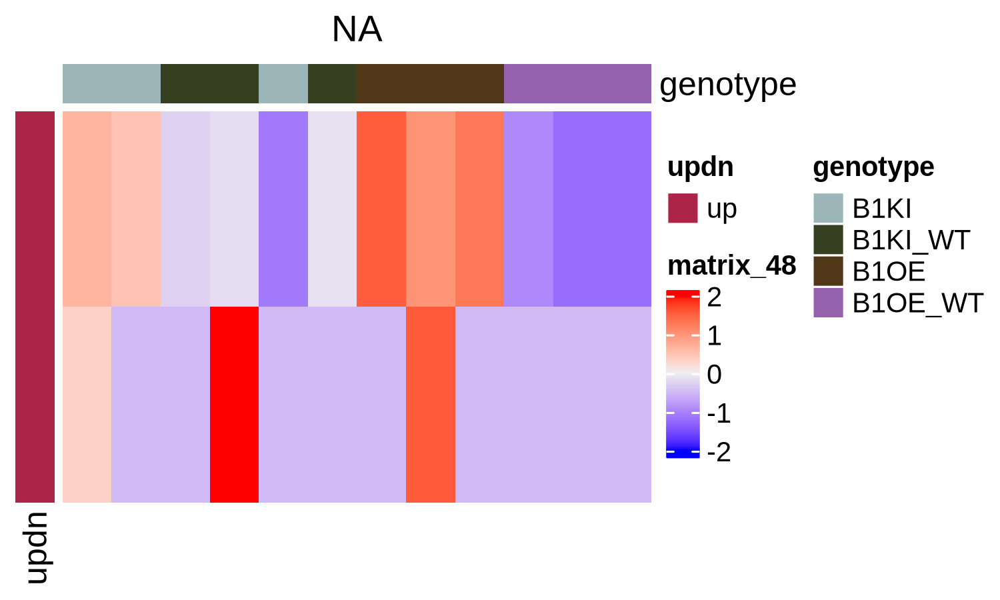

In [363]:
options(repr.plot.width = 4, repr.plot.height=3, repr.plot.res = 300)
groups = c('ITD', 'Kit', 'LSK', 'vitro')
group_ii = groups[2]
dsn_sel = dsn_rna[group == group_ii, ]
gene_sel = unique(deg_dt[grepl(group_ii, .id) & padj < .05 & abs(log2FoldChange) > 1 & !is.na(updn), ])  
gene_sel = gene_sel[.id %in% c('Kit_B1OE__Kit_B1OE_WT', 'Kit_B1OE__Kit_B1OE_WT'), ]
plotdat = logcpm_mmu[gene_sel$rn, dsn_sel$sample]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
dim(plotdat)

column_ha = HeatmapAnnotation(df = dsn_sel[, "genotype", drop = F])
row_ha = rowAnnotation(df = gene_sel[, .(updn)])
args = list(matrix = plotdat, top_annotation = column_ha, left_annotation = row_ha, 
                column_split = factor(dsn_sel$genotype, levels = group_sel), show_column_names = F, 
                show_row_names = F, show_column_dend = F, cluster_rows = T, cluster_columns = F, 
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)

options(repr.plot.width = 5, repr.plot.height=3, repr.plot.res = 300)

hp = do.call(Heatmap, args)
hp


[1] 7539   30

`use_raster` is automatically set to TRUE for a matrix with more than 2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



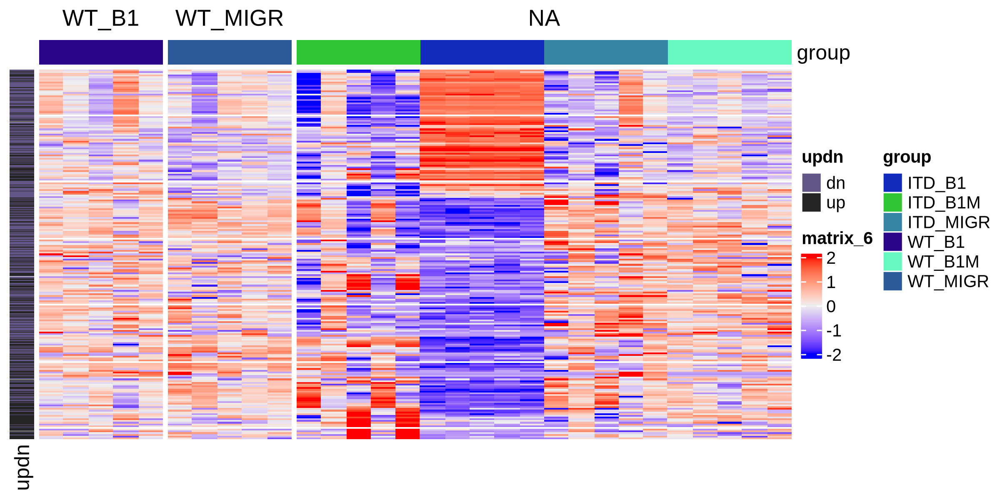

In [19]:
gene_sel = unique(deg_dt[.id %in% comb_sel & padj < .05 & abs(log2FoldChange) > 1, ]) 
plotdat = logcpm_mmu[gene_sel$rn, dsn_mmu_rna$sample]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
dim(plotdat)

column_ha = HeatmapAnnotation(df = dsn_mmu_rna_df[, "group", drop = F])
row_ha = rowAnnotation(df = gene_sel[, .(updn)])
args = list(matrix = plotdat, top_annotation = column_ha, left_annotation = row_ha, 
                column_split = factor(dsn_mmu_rna_df$group, levels = group_sel), show_column_names = F, 
                show_row_names = F, show_column_dend = F, cluster_rows = T, cluster_columns = F, 
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)

options(repr.plot.width = 8, repr.plot.height=4, repr.plot.res = 300)
hp = do.call(Heatmap, args)
draw(hp)


## barplot

In [143]:
table(deg_dt$.id)


         ITD_ITDB1__ITD_ITDMIGR           ITD_ITDB1M__ITD_ITDB1         ITD_ITDB1M__ITD_ITDMIGR           Kit_B1KI__Kit_B1KI_WT              Kit_B1KI__Kit_B1OE 
                          24411                           24411                           24411                           24411                           24411 
          Kit_B1KI__Kit_B1OE_WT           Kit_B1KI_WT__Kit_B1OE        Kit_B1KI_WT__Kit_B1OE_WT           Kit_B1OE__Kit_B1OE_WT           LSK_B1KI__LSK_B1KI_WT 
                          24411                           24411                           24411                           24411                           24411 
             LSK_B1KI__LSK_B1OE           LSK_B1KI__LSK_B1OE_WT           LSK_B1KI_WT__LSK_B1OE        LSK_B1KI_WT__LSK_B1OE_WT           LSK_B1OE__LSK_B1OE_WT 
                          24411                           24411                           24411                           24411                           24411 
 vitro_vitroB1__vitro_vitroMIGR  

Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(plotdat). In the next version, this warning will become an error.”


Var1,Var2,value
<fct>,<fct>,<int>
up,ITD_B1__ITD_MIGR,3007
dn,ITD_B1__ITD_MIGR,4448
up,ITD_B1M__ITD_B1,5145
dn,ITD_B1M__ITD_B1,3313
up,WT_B1__WT_MIGR,4
dn,WT_B1__WT_MIGR,0
up,WT_B1M__WT_B1,3
dn,WT_B1M__WT_B1,6


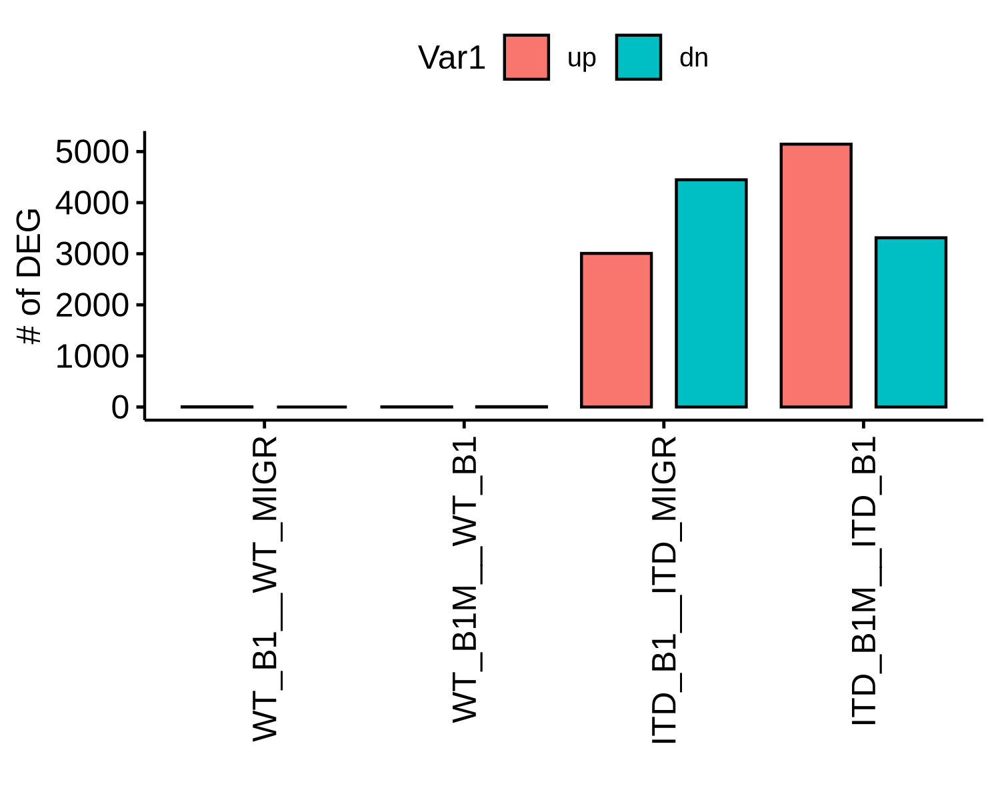

In [103]:
plotdat = deg_dt[.id %in% comb_sel & padj < .1 & abs(log2FoldChange) > 0, ] 
plotdat = table(plotdat$updn, plotdat$.id)
plotdat = as.data.table(melt(plotdat))
plotdat[, Var2 := factor(Var2, levels = comb_sel)]
plotdat

options(repr.plot.width = 5, repr.plot.height=4, repr.plot.res = 300)
ggbarplot(plotdat, x = 'Var2', y = 'value', fill = 'Var1', position = position_dodge()) + rotate_x_text(90) + xlab('') + ylab('# of DEG') 


# DNA Methylation

## import bead array meta data (deprected)

In [ ]:
# https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GPL33022

In [10]:
library(GEOquery)

In [ ]:
gpl = getGEO('GPL32685')

In [12]:
saveRDS(gpl, file = 'GPL32685.rds')

In [125]:
gpl = readRDS('GPL32685.rds')
gpl_dt = as.data.table(gpl@dataTable@table)
head(gpl_dt)
dim(gpl_dt)
colnames(gpl_dt)


ID,SPOT_ID,AddressA_ID,AlleleA_ProbeSeq,AddressB_ID,AlleleB_ProbeSeq,Next_Base,Color_Channel,Col,Probe_Type,⋯,CpG_Island_chromEnd,CpG_Island_length,CpG_Island_cpgNum,CpG_Island_gcNum,CpG_Island_perCpg,CpG_Island_perGc,CpG_Island_obsExp,S_Shore,S_Shelf,MFG_Change_Flagged
<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>
cg00101675_BC21,cg00101675,91684905,TTCCTAAAAAAACTTCAACAATACTATATCATTTTTAACTTCATAAACAC,NA,,,,,cg,⋯,NA,NA,NA,NA,NA,NA,NA,,,FALSE
cg00116289_BC21,cg00116289,20615285,ACRTAACRTAAAACAACCAAAACRTCAAAACATTTTTACCTATCCAAAAC,NA,,,,,cg,⋯,NA,NA,NA,NA,NA,NA,NA,,,FALSE
cg00211372_TC21,cg00211372,67615859,ATTTATAATATTACCATATTACCTAACCATTAACCCTACAAATAACTCAC,NA,,,,,cg,⋯,NA,NA,NA,NA,NA,NA,NA,,,FALSE
cg00531009_BC21,cg00531009,3755113,CCTCCCATAAACCCTTCTAACTTTATCACCATAATAAACATAAAAATAAC,NA,,,,,cg,⋯,NA,NA,NA,NA,NA,NA,NA,chr19:6375517-6375855,,FALSE
cg00747726_TC21,cg00747726,55704492,AACCACRTCCCATTCTCTCATACTCACTATCAAATTTATAATAATTATAC,NA,,,,,cg,⋯,NA,NA,NA,NA,NA,NA,NA,,,FALSE
cg00896209_TC21,cg00896209,28725255,TATAAAATTATTACRATTTAACTTATACATCRCTCTTATAACCAATCCCC,NA,,,,,cg,⋯,89169681,255,19,170,14.9,66.7,0.77,chr3:89168711-89168913,,TRUE


[1] 287050     38

[1] "ID"                    "SPOT_ID"               "AddressA_ID"           "AlleleA_ProbeSeq"      "AddressB_ID"           "AlleleB_ProbeSeq"     
 [7] "Next_Base"             "Color_Channel"         "Col"                   "Probe_Type"            "Strand"                "Strand_TB"            
[13] "Strand_CO"             "Infinium_Design_Type"  "Rep_Num"               "CHR"                   "MAPINFO"               "Species"              
[19] "Genome_Build"          "SourceSeq"             "Forward_Sequence"      "Top_Sequence"          "Genome_Build_NCBI"     "N_Shelf"              
[25] "N_Shore"               "CpG_Island"            "CpG_Island_chrom"      "CpG_Island_chromStart" "CpG_Island_chromEnd"   "CpG_Island_length"    
[31] "CpG_Island_cpgNum"     "CpG_Island_gcNum"      "CpG_Island_perCpg"     "CpG_Island_perGc"      "CpG_Island_obsExp"     "S_Shore"              
[37] "S_Shelf"               "MFG_Change_Flagged"

## import methylation data

In [ ]:
-rwxrwx--- 1 Domain Users 3.0K Sep 24 14:34  2024-09-11_xu_lyu_mousemethylation_835144.csv
-rwxrwx--- 1 Domain Users 5.4K Sep 24 14:48  2024-09-11_xu_lyu_mousemethylation_835144_qc_table.txt
-rwxrwx--- 1 Domain Users 313M Sep 24 14:51  2024-09-11_xu_lyu_mousemethylation_835144_sample_methylation_profile.txt
drwxrwx--- 2 Domain Users 4.0K Sep 26 16:35  207810940029
drwxrwx--- 2 Domain Users 4.0K Sep 26 16:35  207810940059
drwxrwx--- 2 Domain Users 4.0K Sep 26 16:35  207996700048
-rwxrwx--- 1 Domain Users 450K Sep 26 14:10  835144_Mouse_Methylation_QC_report.pdf
-rwxrwx--- 1 Domain Users  62K Sep 26 13:04 'Methylation reagent lot and plate layout spreadsheet _091824.xlsm'

In [174]:
# mouse model FLT3 ITD
# import design table
dsn1 = as.data.table(fread(paste0(data_dir1, '2024-09-11_xu_lyu_mousemethylation_835144.csv'), skip = 7))
#dsn1 = dsn1[2:nrow(dsn1), ]
#dsn[, sample_name := paste0(Sentrix_ID, '_', Sentrix_Position) ]
dsn1 = dsn1[!grepl('lab_control', Sample_Group), ]
datatable(dsn1)


HTML widgets cannot be represented in plain text (need html)

In [175]:
dsn1[, grp := sub('_.*', '', Sample_Name)]
dsn1[, grp := sub('-.$', '', grp)]
table(dsn1$grp)
lvls = c('WT-MIGR',  'WT-B1',  'WT-B1M',  'ITD-MIGR',  'ITD-B1',  'ITD-B1M') 
dsn1[, grp := factor(grp, levels = lvls) ]
dsn1 = dsn1[order(grp), ]
dsn1[, sample_name := sub('__.*', '', Sample_Name)]
dsn1[, id := paste0(Sentrix_ID, '_', Sentrix_Position) ]
setkey(dsn1, 'id')



  ITD-B1  ITD-B1M ITD-MIGR    WT-B1   WT-B1M  WT-MIGR 
       5        4        5        5        5        5 

In [20]:
#fname = paste0(data_dir, '2024-09-11_xu_lyu_mousemethylation_835144_sample_methylation_profile.txt')
#meth = fread(fname) 


## batch 2 dsn

In [176]:
# import design table
dsn2 = as.data.table(fread(paste0(data_dir2, '2024-12-12_xu_lyu_mousemethylation_841689.csv'), skip = 7))
dsn2 = dsn2[2:nrow(dsn2), ]
#dsn2[, sample_name := paste0(Sentrix_ID, '_', Sentrix_Position) ]
dim(dsn2)
datatable(dsn2)


[1] 31  7

HTML widgets cannot be represented in plain text (need html)

In [177]:
options(width = 126)

In [178]:
dsn2[, grp := sub('_.*', '', Sample_Name)]
dsn2[grep('gDNA', Sample_Name),        grp := 'lab_control' ]
dsn2[grep('B1-Kit', Sample_Name),      grp := 'B1Kit' ]
dsn2[grep('B1-LSK', Sample_Name),      grp := 'B1LSK' ]
dsn2[grep('MIGR-Kit', Sample_Name),    grp := 'MIGRKit' ]
dsn2[grep('MIGR-LSK', Sample_Name),    grp := 'MIGRLSK' ]
dsn2[grep('QM8-Kit', Sample_Name),  grp := 'ITDKit' ]
dsn2[grep('QM28-Kit', Sample_Name), grp := 'ITDKit' ]
dsn2[grep('QM46-Kit', Sample_Name), grp := 'ITDKit' ]
dsn2[grep('QM47-Kit', Sample_Name), grp := 'ITDB1Kit' ]
dsn2[grep('QM48-Kit', Sample_Name), grp := 'ITDB1Kit' ]
dsn2[grep('QM49-Kit', Sample_Name), grp := 'ITDB1Kit' ]
dsn2[grep('QM8-LSK', Sample_Name),  grp := 'ITDLSK' ]
dsn2[grep('QM28-LSK', Sample_Name), grp := 'ITDLSK' ]
dsn2[grep('QM46-LSK', Sample_Name), grp := 'ITDLSK' ]
dsn2[grep('QM47-LSK', Sample_Name), grp := 'ITDB1LSK' ]
dsn2[grep('QM48-LSK', Sample_Name), grp := 'ITDB1LSK' ]
dsn2[grep('QM49-LSK', Sample_Name), grp := 'ITDB1LSK' ]
table(dsn2$grp)



      B1Kit       B1LSK    ITDB1Kit    ITDB1LSK      ITDKit      ITDLSK lab_control     MIGRKit     MIGRLSK 
          3           3           3           3           3           3           7           3           3 

In [179]:
dsn2 = dsn2[order(grp), ]
dsn2[, sample_name := sub('__.*', '', Sample_Name)]

dsn2[, id := paste0(Sentrix_ID, '_', Sentrix_Position) ]
setkey(dsn2, 'id')


## combine two cohort

In [499]:
dsn = rbind(dsn1, dsn2)

In [500]:
datatable(dsn)

HTML widgets cannot be represented in plain text (need html)

In [501]:
table(dsn_rna$grp)


      ITD_B1      ITD_B1M     ITD_MIGR   KitKI_B1KI     KitKI_WT   KitOE_B1OE KitOE_WTMIGR   LSKKI_B1KI     LSKKI_WT 
           5            5            5            3            3            3            3            3            3 
  LSKOE_WTB1 LSKOE_WTMIGR     Vitro_B1    Vitro_B1M   Vitro_MIGR 
           3            3            5            5            5 

In [502]:
head(dsn_rna[, .(sample, genotype, group, grp )])

sample,genotype,group,grp
<chr>,<chr>,<chr>,<chr>
JL_ITD_B1M_1_S26,B1M,ITD,ITD_B1M
JL_ITD_B1M_2_S27,B1M,ITD,ITD_B1M
JL_ITD_B1M_3_S28,B1M,ITD,ITD_B1M
JL_ITD_B1M_4_S29,B1M,ITD,ITD_B1M
JL_ITD_B1M_5_S30,B1M,ITD,ITD_B1M
JL_ITD_B1_1_S21,B1,ITD,ITD_MIGR


In [503]:
dsn[, sample := sub('_.*', '', sample_name) ]
dsn[, sample := gsub('-', '_', sample) ]

In [504]:
dsn_rna[, sample2 := sub('JL_', '', sample) ]
dsn_rna[, sample2 := sub('_S.*', '', sample2) ]

In [505]:
dsn[, sample2 := sample ]
dsn[sample == 'QM8_Kit',  sample2 := 'QM8_C1_Kit']
dsn[sample == 'QM8_LSK',  sample2 := 'QM8_C1_LSK']
dsn[sample == 'QM28_Kit', sample2 := 'QM28_E1_Kit']
dsn[sample == 'QM28_LSK', sample2 := 'QM28_E1_LSK']
dsn[sample == 'QM46_Kit', sample2 := 'QM46_E2_Kit']
dsn[sample == 'QM46_LSK', sample2 := 'QM46_E2_LSK']
dsn[sample == 'QM47_Kit', sample2 := 'QM47_C2_Kit']
dsn[sample == 'QM47_LSK', sample2 := 'QM47_C2_LSK']
dsn[sample == 'QM48_Kit', sample2 := 'QM48_C3_Kit']
dsn[sample == 'QM48_LSK', sample2 := 'QM48_C3_LSK']
dsn[sample == 'QM49_Kit', sample2 := 'QM49_E3_Kit']
dsn[sample == 'QM49_LSK', sample2 := 'QM49_E3_LSK']


In [506]:
ov = intersect(dsn_rna$sample2, dsn$sample2)
length(ov)


[1] 53

In [507]:
sort(setdiff(dsn_rna$sample2, ov))
sort(setdiff(dsn$sample2, ov))

[1] "ITD_B1M_5"

[1] "Mouse gDNA2" "Mouse gDNA3" "Mouse gDNA4" "Mouse gDNA5" "Mouse gDNA6" "Mouse gDNA7" "Mouse gDNA8"

In [508]:
intersect(colnames(dsn),  colnames(dsn_rna))

[1] "grp"     "sample"  "sample2"

In [509]:
dsn_both = merge(dsn_rna[, .(sample2, sample, genotype, group, grp)], dsn[, .(Sample_Name, id, Sample_Group, sample_name, sample2)], by.x = 'sample2', by.y = 'sample2', all.x = T)
dim(dsn_both)
head(dsn_both)

[1] 54  9

sample2,sample,genotype,group,grp,Sample_Name,id,Sample_Group,sample_name
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ITD_B1M_1,JL_ITD_B1M_1_S26,B1M,ITD,ITD_B1M,ITD-B1M-1_3196934__mousemethylation,207996700048_R02C01,Xu_835144,ITD-B1M-1_3196934
ITD_B1M_2,JL_ITD_B1M_2_S27,B1M,ITD,ITD_B1M,ITD-B1M-2_3196935__mousemethylation,207996700048_R03C01,Xu_835144,ITD-B1M-2_3196935
ITD_B1M_3,JL_ITD_B1M_3_S28,B1M,ITD,ITD_B1M,ITD-B1M-3_3196936__mousemethylation,207996700048_R04C01,Xu_835144,ITD-B1M-3_3196936
ITD_B1M_4,JL_ITD_B1M_4_S29,B1M,ITD,ITD_B1M,ITD-B1M-4_3196937__mousemethylation,207996700048_R05C01,Xu_835144,ITD-B1M-4_3196937
ITD_B1M_5,JL_ITD_B1M_5_S30,B1M,ITD,ITD_B1M,NA,NA,NA,NA
ITD_B1_1,JL_ITD_B1_1_S21,B1,ITD,ITD_MIGR,ITD-B1-1_3196929__mousemethylation,207810940059_R03C02,Xu_835144,ITD-B1-1_3196929


In [510]:
datatable(dsn_both)

HTML widgets cannot be represented in plain text (need html)

In [ ]:
QM8_C1_Kit	ITD	Kit
QM28_E1_Kit	ITD	Kit
QM46_E2_Kit	ITD	Kit
QM47_C2_Kit	ITDB1	Kit
QM48_C3_Kit	ITDB1	Kit
QM49_E3_Kit	ITDB1	Kit


In [ ]:
lvls = c('WT-MIGR',  'WT-B1',  'WT-B1M',  'ITD-MIGR',  'ITD-B1',  'ITD-B1M') 
dsn2[, grp := factor(grp, levels = lvls) ]


## read dna methylation data

In [16]:
meth1 = read.metharray.exp(base = data_dir1, recursive = T)

In [17]:
meth2 = read.metharray.exp(base = data_dir2, recursive = T)


In [18]:
meth = combine(meth1, meth2)


In [87]:
# saveRDS(meth, file = 'meth_BCAT1KO_mouse_Feb25.rds')


In [156]:
meth = readRDS('meth_BCAT1KO_mouse_Feb25.rds')

In [167]:
rownames(rgSet@colData)

[1] "207810940029_R01C01" "207810940029_R01C02" "207810940029_R02C01" "207810940029_R02C02" "207810940029_R03C01" "207810940029_R03C02" "207810940029_R04C01"
 [8] "207810940029_R04C02" "207810940029_R05C01" "207810940029_R05C02" "207810940029_R06C01" "207810940029_R06C02" "207810940059_R01C01" "207810940059_R01C02"
[15] "207810940059_R02C01" "207810940059_R02C02" "207810940059_R03C01" "207810940059_R03C02" "207810940059_R04C01" "207810940059_R04C02" "207810940059_R05C01"
[22] "207810940059_R05C02" "207810940059_R06C01" "207810940059_R06C02" "207996700048_R01C01" "207996700048_R02C01" "207996700048_R03C01" "207996700048_R04C01"
[29] "207996700048_R05C01"

In [163]:
meth

class: RGChannelSet 
dim: 361821 94 
metadata(0):
assays(2): Green Red
rownames(361821): 1600149 1600245 ... 99810932 99810936
rowData names(0):
colnames(94): 207810940029_R01C01 207810940029_R01C02 ... 208706080030_R06C01 208706080030_R06C02
colData names(0):
Annotation
  array: Unknown
  annotation: Unknown

In [189]:
rgSet = copy(meth)

In [190]:
rgSet = rgSet[, dsn_both[!is.na(id), id]]

In [191]:
rgSet

class: RGChannelSet 
dim: 361821 53 
metadata(0):
assays(2): Green Red
rownames(361821): 1600149 1600245 ... 99810932 99810936
rowData names(0):
colnames(53): 207996700048_R02C01 207996700048_R03C01 ... 208362130071_R02C02 208362130071_R03C02
colData names(0):
Annotation
  array: Unknown
  annotation: Unknown

In [192]:
annotation(rgSet)["array"] = "IlluminaMouseMethylation"
#annotation(rgSet)["array"] = "MouseMethylation-12v1"
#ailluminahumanmethylationepicmanifest


In [161]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua"

## QC

In [193]:
rgSet

class: RGChannelSet 
dim: 361821 53 
metadata(0):
assays(2): Green Red
rownames(361821): 1600149 1600245 ... 99810932 99810936
rowData names(0):
colnames(53): 207996700048_R02C01 207996700048_R03C01 ... 208362130071_R02C02 208362130071_R03C02
colData names(0):
Annotation
  array: IlluminaMouseMethylation
  annotation: Unknown

NULL

NULL

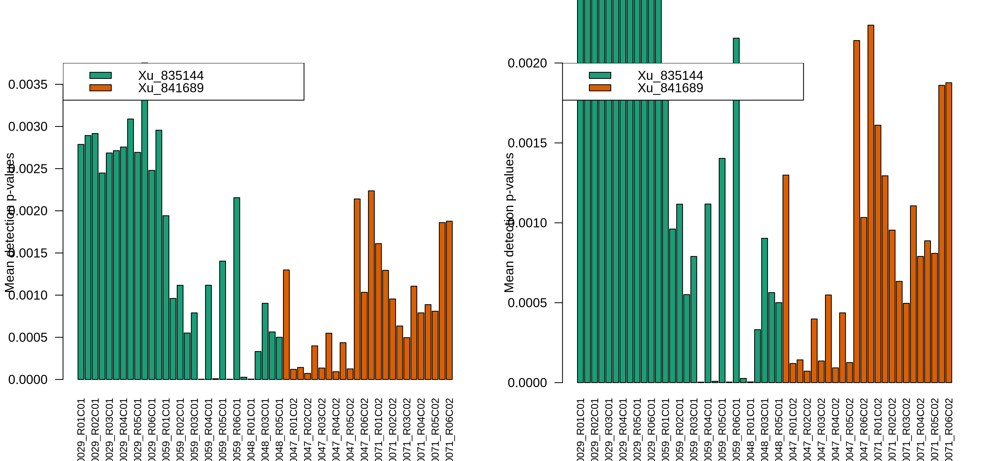

In [47]:
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 300)
detP <- detectionP(rgSet)
pal <- brewer.pal(8,"Dark2")
par(mfrow=c(1,2))
barplot(colMeans(detP), col=pal[factor(dsn$Sample_Group)], las=2,  cex.names=0.8, ylab="Mean detection p-values") + xlim(0, .2)
abline(h=0.05,col="red")
legend("topleft", legend=levels(factor(dsn$Sample_Group)), fill=pal, bg="white")

barplot(colMeans(detP), col=pal[factor(dsn$Sample_Group)], las=2,  cex.names=0.8, ylim=c(0,0.002), ylab="Mean detection p-values") + xlim(0, .2)
abline(h=0.05,col="red")
legend("topleft", legend=levels(factor(dsn$Sample_Group)), fill=pal,  bg="white")


In [48]:
keep <- colMeans(detP) < 0.05


## normalization

In [194]:
#ann <- getAnnotation(IlluminaHumanMethylationEPICanno.ilm10b5.hg38)
rgSet@annotation = c(array = "IlluminaMouseMethylation", annotation = "12.v1.mm10")

In [195]:
rgSet

class: RGChannelSet 
dim: 361821 53 
metadata(0):
assays(2): Green Red
rownames(361821): 1600149 1600245 ... 99810932 99810936
rowData names(0):
colnames(53): 207996700048_R02C01 207996700048_R03C01 ... 208362130071_R02C02 208362130071_R03C02
colData names(0):
Annotation
  array: IlluminaMouseMethylation
  annotation: 12.v1.mm10

In [196]:
mSetSq <- preprocessQuantile(rgSet) 

[preprocessQuantile] Mapping to genome.

[preprocessQuantile] Fixing outliers.

[preprocessQuantile] Quantile normalizing.



In [197]:
mSetRaw <- preprocessRaw(rgSet)


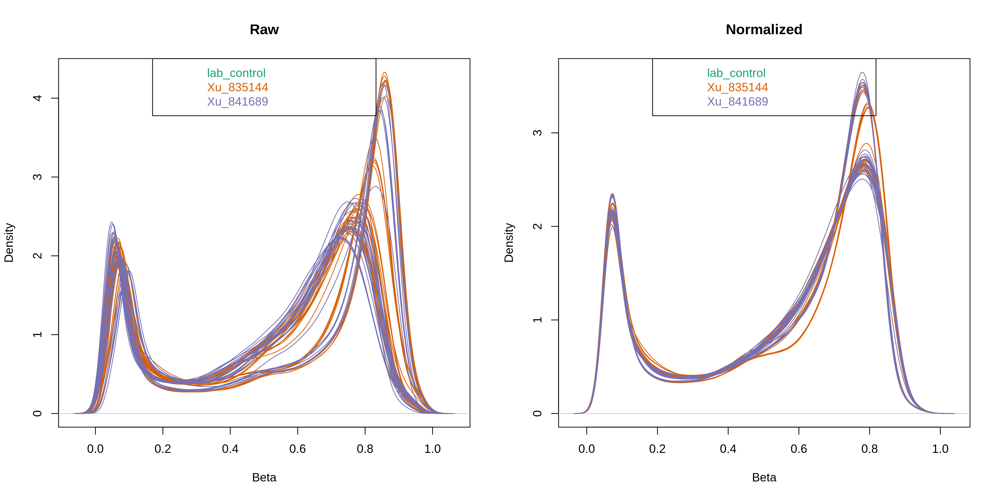

In [201]:
options(repr.plot.width = 14, repr.plot.height = 7, repr.plot.res = 300)
par(mfrow=c(1,2))
densityPlot(rgSet, sampGroups=dsn$Sample_Group,main="Raw", legend=FALSE)
legend("top", legend = levels(factor(dsn$Sample_Group)),  text.col=brewer.pal(8,"Dark2"))
densityPlot(getBeta(mSetSq), sampGroups=dsn$Sample_Group, main="Normalized", legend=FALSE)
legend("top", legend = levels(factor(dsn$Sample_Group)),  text.col=brewer.pal(8,"Dark2"))


In [206]:
dsn_both[, replication := paste0('rep', 1:nrow(.SD)), by = 'grp']
head(dsn_both)


sample2,sample,genotype,group,grp,Sample_Name,id,Sample_Group,sample_name,replication
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ITD_B1M_1,JL_ITD_B1M_1_S26,ITDB1M,ITD,ITD_ITDB1M,ITD-B1M-1_3196934__mousemethylation,207996700048_R02C01,Xu_835144,ITD-B1M-1_3196934,rep1
ITD_B1M_2,JL_ITD_B1M_2_S27,ITDB1M,ITD,ITD_ITDB1M,ITD-B1M-2_3196935__mousemethylation,207996700048_R03C01,Xu_835144,ITD-B1M-2_3196935,rep2
ITD_B1M_3,JL_ITD_B1M_3_S28,ITDB1M,ITD,ITD_ITDB1M,ITD-B1M-3_3196936__mousemethylation,207996700048_R04C01,Xu_835144,ITD-B1M-3_3196936,rep3
ITD_B1M_4,JL_ITD_B1M_4_S29,ITDB1M,ITD,ITD_ITDB1M,ITD-B1M-4_3196937__mousemethylation,207996700048_R05C01,Xu_835144,ITD-B1M-4_3196937,rep4
ITD_B1M_5,JL_ITD_B1M_5_S30,ITDB1M,ITD,ITD_ITDB1M,NA,NA,NA,NA,rep5
ITD_B1_1,JL_ITD_B1_1_S21,ITDB1,ITD,ITD_ITDB1,ITD-B1-1_3196929__mousemethylation,207810940059_R03C02,Xu_835144,ITD-B1-1_3196929,rep1


In [209]:
table(dsn_both$grp)


      ITD_ITDB1      ITD_ITDB1M     ITD_ITDMIGR        Kit_B1KI     Kit_B1KI_WT        Kit_B1OE     Kit_B1OE_WT 
              5               5               5               3               3               3               3 
       LSK_B1KI     LSK_B1KI_WT        LSK_B1OE     LSK_B1OE_WT   vitro_vitroB1  vitro_vitroB1M vitro_vitroMIGR 
              3               3               3               3               5               5               5 

In [207]:
targets = copy(dsn_both[!is.na(id), ])

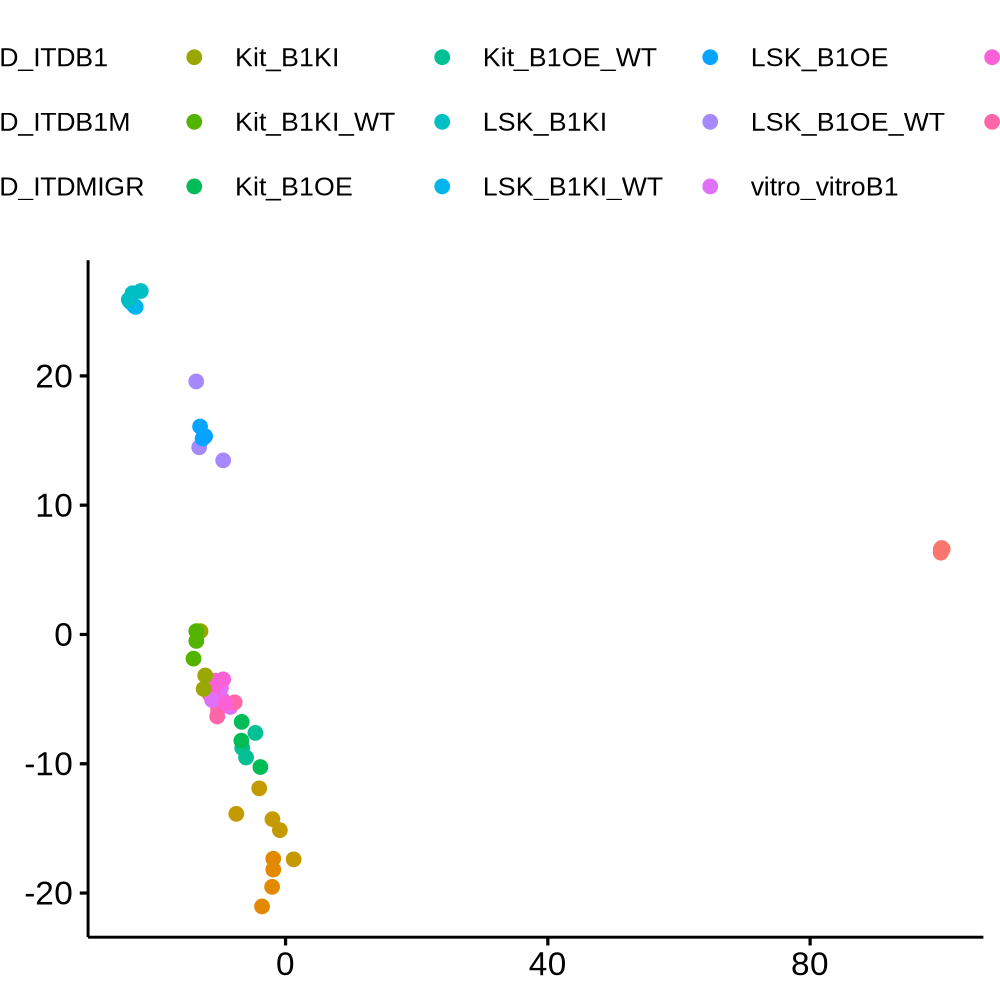

In [216]:
plotdat = getM(mSetSq)
plotdat = pca_fun(plotdat, ntop = 2000)
mtx = plotdat$plotdat
mtx = merge(mtx, targets, by.x = 'rn', by.y = 'id')
gg = ggscatter(mtx, x = 'PC1', y = 'PC2', color = 'grp') + xlab(plotdat$lblx) + ylab(plotdat$lbly)
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
gg

In [218]:
levels(factor(targets$grp))

[1] "ITD_ITDB1"       "ITD_ITDB1M"      "ITD_ITDMIGR"     "Kit_B1KI"        "Kit_B1KI_WT"     "Kit_B1OE"       
 [7] "Kit_B1OE_WT"     "LSK_B1KI"        "LSK_B1KI_WT"     "LSK_B1OE"        "LSK_B1OE_WT"     "vitro_vitroB1"  
[13] "vitro_vitroB1M"  "vitro_vitroMIGR"

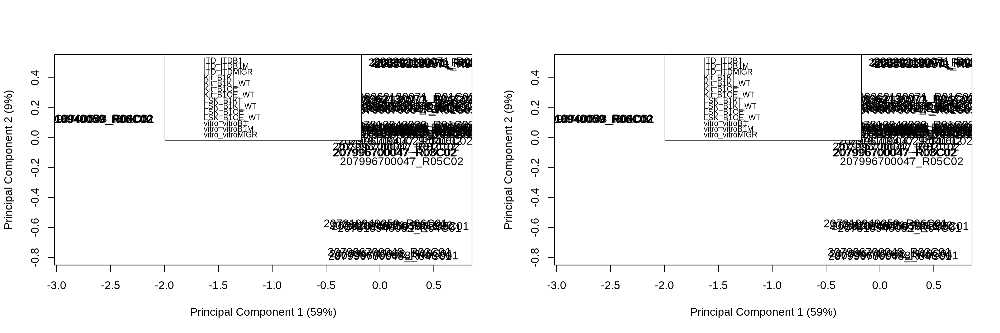

In [223]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 200)

par(mfrow=c(1,2))
plotMDS(getM(mSetSq), top=1000, gene.selection="common") 
legend("top", legend=levels(factor(targets$grp)),  bg="white", cex=0.7)

plotMDS(getM(mSetSq), top=1000, gene.selection="common")
legend("top", legend=levels(factor(targets$grp)),  bg="white", cex=0.7)


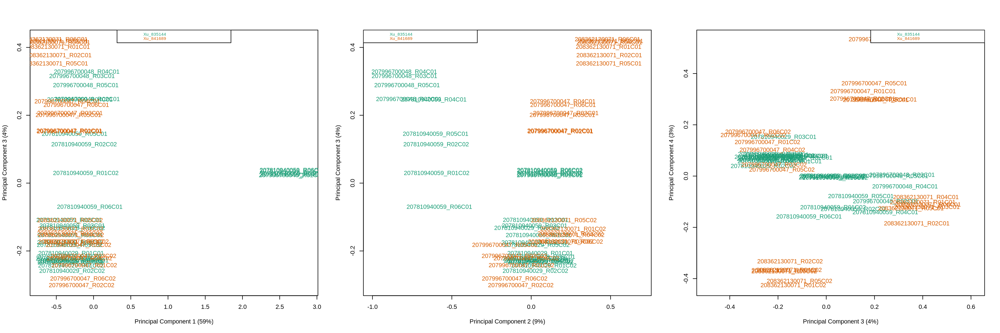

In [59]:
options(repr.plot.width = 18, repr.plot.height = 6, repr.plot.res = 200)
par(mfrow=c(1,3))
plotMDS(getM(mSetSq), top=1000, gene.selection="common",  col=pal[factor(targets$Sample_Group)], dim=c(1,3))
legend("top", legend=levels(factor(targets$Sample_Group)), text.col=pal,  cex=0.7, bg="white")

plotMDS(getM(mSetSq), top=1000, gene.selection="common",  col=pal[factor(targets$Sample_Group)], dim=c(2,3))
legend("topleft", legend=levels(factor(targets$Sample_Group)), text.col=pal, cex=0.7, bg="white")

plotMDS(getM(mSetSq), top=1000, gene.selection="common",  col=pal[factor(targets$Sample_Group)], dim=c(3,4))
legend("topright", legend=levels(factor(targets$Sample_Group)), text.col=pal, cex=0.7, bg="white")


## filter data

In [224]:
detP <- detectionP(rgSet)


In [225]:
detP <- detP[match(featureNames(mSetSq),rownames(detP)),] 

# remove any probes that have failed in one or more samples
keep <- rowSums(detP < 0.01) == ncol(mSetSq) 
table(keep)


keep
 FALSE   TRUE 
  3434 282228 

In [226]:
mSetSqFlt <- mSetSq[keep,]
mSetSqFlt


class: GenomicRatioSet 
dim: 282228 53 
metadata(0):
assays(2): M CN
rownames(282228): cg36602742_TC11 cg36602743_TC21 ... cg48344158_BC11 cg48344197_BC21
rowData names(0):
colnames(53): 207996700048_R02C01 207996700048_R03C01 ... 208362130071_R02C02 208362130071_R03C02
colData names(3): xMed yMed predictedSex
Annotation
  array: IlluminaMouseMethylation
  annotation: 12.v1.mm10
Preprocessing
  Method: Raw (no normalization or bg correction)
  minfi version: 1.48.0
  Manifest version: 0.0.1

In [ ]:
#keep <- !(featureNames(mSetSqFlt) %in% ann450k$Name[ann450k$chr %in%  c("chrX","chrY")])
#table(keep)
#mSetSqFlt <- mSetSqFlt[keep,]


In [ ]:
mSetSqFlt <- dropLociWithSnps(mSetSqFlt)
mSetSqFlt


In [ ]:
class(rgSet)

In [230]:
table(dsn_both$grp)


      ITD_ITDB1      ITD_ITDB1M     ITD_ITDMIGR        Kit_B1KI     Kit_B1KI_WT        Kit_B1OE     Kit_B1OE_WT 
              5               5               5               3               3               3               3 
       LSK_B1KI     LSK_B1KI_WT        LSK_B1OE     LSK_B1OE_WT   vitro_vitroB1  vitro_vitroB1M vitro_vitroMIGR 
              3               3               3               3               5               5               5 

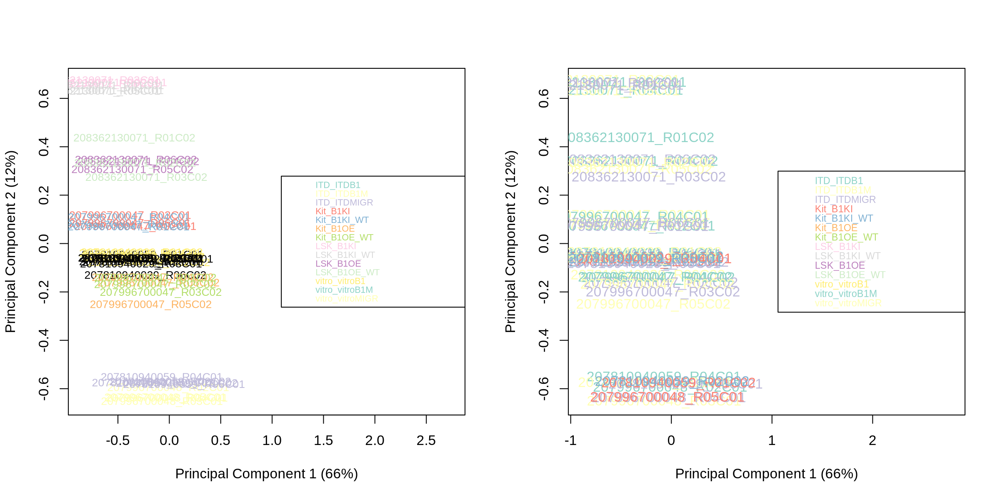

In [231]:
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 200)

num_groups <- length(unique(targets$grp))
pal <- brewer.pal(min(num_groups, 12), "Set3")  # Use "Set1", "Set3", or "Paired" for good contrast


par(mfrow=c(1,2))
plotMDS(getM(mSetSqFlt), top=1000, gene.selection="common",  col=pal[factor(targets$grp)], cex=0.8)
legend("right", legend=levels(factor(targets$grp)), text.col=pal, cex=0.65, bg="white")

plotMDS(getM(mSetSqFlt), top=1000, gene.selection="common",  col=pal[factor(targets$replication)])
legend("right", legend=levels(factor(targets$grp)), text.col=pal, cex=0.7, bg="white")


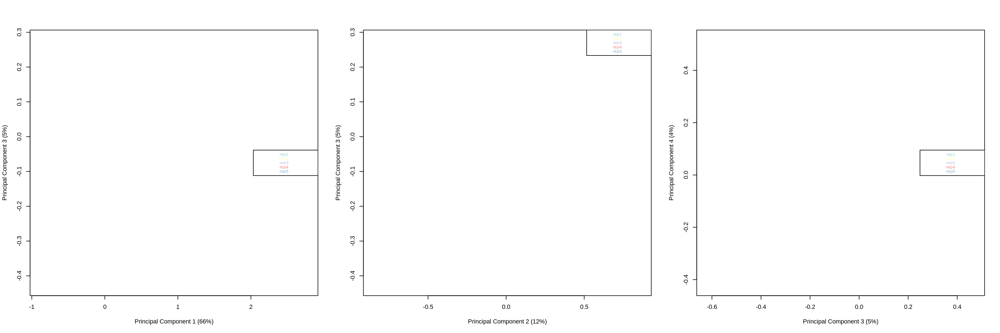

In [232]:
options(repr.plot.width = 18, repr.plot.height = 6, repr.plot.res = 200)

par(mfrow=c(1,3))
# Examine higher dimensions to look at other sources of variation
plotMDS(getM(mSetSqFlt), top=1000, gene.selection="common",  col=pal[factor(targets$Sample_Source)], dim=c(1,3))
legend("right", legend=levels(factor(targets$replication)), text.col=pal, cex=0.7, bg="white")

plotMDS(getM(mSetSqFlt), top=1000, gene.selection="common",  col=pal[factor(targets$Sample_Source)], dim=c(2,3))
legend("topright", legend=levels(factor(targets$replication)), text.col=pal, cex=0.7, bg="white")

plotMDS(getM(mSetSqFlt), top=1000, gene.selection="common",  col=pal[factor(targets$Sample_Source)], dim=c(3,4))
legend("right", legend=levels(factor(targets$replication)), text.col=pal, cex=0.7, bg="white")


In [233]:
mVals <- getM(mSetSqFlt)
head(mVals[,1:5])


,207996700048_R02C01,207996700048_R03C01,207996700048_R04C01,207996700048_R05C01,207810940059_R03C02
cg36602742_TC11,-0.3816438,-0.06662727,0.02186577,-0.09811216,-0.2631457
cg36602743_TC21,1.0920684,0.95727264,1.09519469,0.85297910,1.2815000
cg36602902_BC11,1.3767045,0.48861198,0.90922516,0.95730968,2.1449358
cg36603113_TC21,-0.3159375,-0.38945154,-0.42661391,-0.36293113,-0.5441404
cg36603287_TC21,0.7464880,0.93755921,0.88936453,0.84049574,0.6276777
cg36603393_BC21,1.3550561,0.84854838,1.16264044,1.12278032,1.6649868


In [234]:
dim(mVals)

[1] 282228     53

In [235]:
bVals <- getBeta(mSetSqFlt)
head(bVals[,1:5])


,207996700048_R02C01,207996700048_R03C01,207996700048_R04C01,207996700048_R05C01,207810940059_R03C02
cg36602742_TC11,0.4342491,0.4884564,0.5037890,0.4830050,0.4545263
cg36602743_TC21,0.6806942,0.6600531,0.6811651,0.6436496,0.7085326
cg36602902_BC11,0.7219709,0.5838698,0.6525409,0.6600589,0.8155909
cg36603113_TC21,0.4454700,0.4329200,0.4266075,0.4374384,0.4068098
cg36603287_TC21,0.6265457,0.6569804,0.6494131,0.6416625,0.6070844
cg36603393_BC21,0.7189488,0.6429449,0.6912311,0.6853033,0.7602555


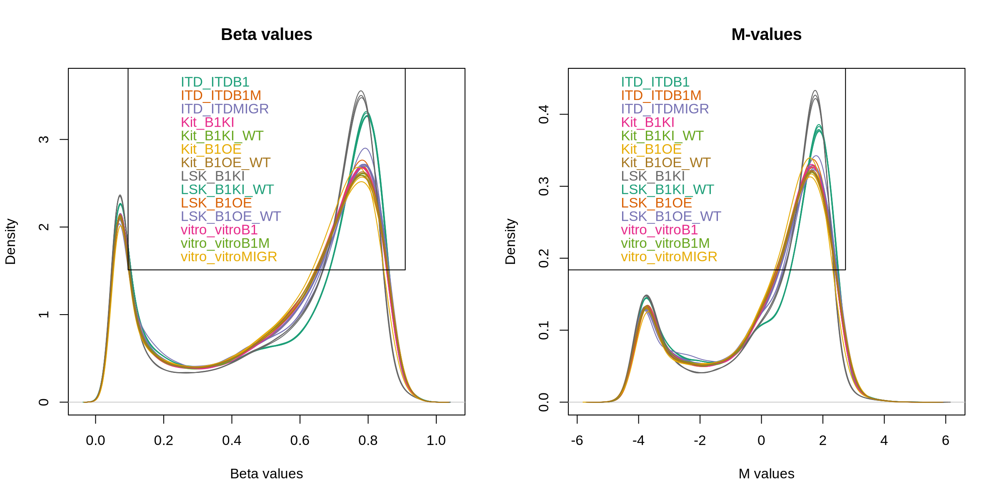

In [237]:
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 200)

par(mfrow=c(1,2))
densityPlot(bVals, sampGroups=targets$grp, main="Beta values",  legend=FALSE, xlab="Beta values")
legend("top", legend = levels(factor(targets$grp)),  text.col=brewer.pal(8,"Dark2"))
densityPlot(mVals, sampGroups=targets$grp, main="M-values",  legend=FALSE, xlab="M values")
legend("topleft", legend = levels(factor(targets$grp)),  text.col=brewer.pal(8,"Dark2"))


## Probe-wise differential methylation analysis

In [494]:
cmp_dt

.id,rn,grp1,grp2,tag
<chr>,<int>,<chr>,<chr>,<chr>
ITD,1,ITD_B1,ITD_B1M,ITD_B1__ITD_B1M
ITD,2,ITD_B1,ITD_MIGR,ITD_B1__ITD_MIGR
ITD,3,ITD_B1M,ITD_MIGR,ITD_B1M__ITD_MIGR
Vitro,4,Vitro_B1,Vitro_B1M,Vitro_B1__Vitro_B1M
Vitro,5,Vitro_B1,Vitro_MIGR,Vitro_B1__Vitro_MIGR
Vitro,6,Vitro_B1M,Vitro_MIGR,Vitro_B1M__Vitro_MIGR
KitKI,7,KitKI_B1KI,KitKI_WT,KitKI_B1KI__KitKI_WT
LSKKI,8,LSKKI_B1KI,LSKKI_WT,LSKKI_B1KI__LSKKI_WT
KitOE,9,KitOE_B1OE,KitOE_WTMIGR,KitOE_B1OE__KitOE_WTMIGR


In [511]:
# grp1 - grp2
dmp_list = lapply(1:nrow(cmp_dt), function(ii){
    message(ii)
    grp1 = cmp_dt[ii, grp1]
    grp2 = cmp_dt[ii, grp2]
    #message(ii, '\t', grp1, '\t', grp2)
    dsn1 = dsn_both[grp %in% grp1, ] 
    dsn2 = dsn_both[grp %in% grp2, ] 
    dsn_sel = rbind(dsn1, dsn2)
    dsn_sel = dsn_sel[!is.na(id), ]
    mtx = mVals[, dsn_sel$id]
    dsn_sel[grp == grp1, design := 1 ]
    dsn_sel[grp == grp2, design := -1 ]
    fit <- lmFit(mtx, design = dsn_sel$design)
    fit <- eBayes(fit)
    tmp = as.data.table(topTable(fit, num=Inf), keep.rownames = T)
    tmp[order(P.Value), ]
})


1

2

3

4

5

6

7

8

9

10



In [513]:
length(dmp_list)

[1] 10

In [521]:
names(dmp_list) = cmp_dt$tag
dmp_dt = rbindlist(dmp_list, idcol = T)
dmp_dt[, name := paste0('dmp_name_', 1:nrow(dmp_dt)) ]
dmp_dt[logFC > 0, updn := 'up'] 
dmp_dt[logFC < 0, updn := 'dn'] 
dmp_dt[, updn := factor(updn, levels = c('up', 'dn'))]
dmp_dt = dmp_dt[order(P.Value), ]
dim(dmp_dt) 
head(dmp_dt) 


[1] 2822280      10

.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B,name,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
ITD_B1__ITD_MIGR,cg29188670_BC21,2.308754,0.11506277,15.50565,1.140384e-08,0.0009488698,8.891528,dmp_name_282229,up
ITD_B1__ITD_MIGR,cg32077401_TC21,2.401575,-0.11131427,15.48268,1.157884e-08,0.0009488698,8.882342,dmp_name_282230,up
ITD_B1__ITD_MIGR,cg43169037_BC21,2.352198,0.15540135,15.19598,1.402733e-08,0.0009488698,8.765643,dmp_name_282231,up
ITD_B1__ITD_MIGR,cg37913724_TC21,2.335033,0.16335604,14.78343,1.859628e-08,0.0009488698,8.590809,dmp_name_282232,up
ITD_B1__ITD_MIGR,cg29187497_BC21,2.162301,0.07880345,14.73158,1.927691e-08,0.0009488698,8.568238,dmp_name_282233,up
ITD_B1__ITD_MIGR,cg35958454_TC21,2.128291,0.02279903,14.48646,2.288343e-08,0.0009488698,8.459677,dmp_name_282234,up


In [514]:
table(dmp_dt$.id)


         ITD_B1__ITD_B1M         ITD_B1__ITD_MIGR        ITD_B1M__ITD_MIGR     KitKI_B1KI__KitKI_WT KitOE_B1OE__KitOE_WTMIGR 
                  282228                   282228                   282228                   282228                   282228 
    LSKKI_B1KI__LSKKI_WT LSKOE_WTB1__LSKOE_WTMIGR      Vitro_B1__Vitro_B1M     Vitro_B1__Vitro_MIGR    Vitro_B1M__Vitro_MIGR 
                  282228                   282228                   282228                   282228                   282228 

In [515]:
head(dmp_dt[.id == 'ITD_B1__ITD_MIGR',])

.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B,name,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
ITD_B1__ITD_MIGR,cg29188670_BC21,2.308754,0.11506277,15.50565,1.140384e-08,0.0009488698,8.891528,dmp_name_282229,up
ITD_B1__ITD_MIGR,cg32077401_TC21,2.401575,-0.11131427,15.48268,1.157884e-08,0.0009488698,8.882342,dmp_name_282230,up
ITD_B1__ITD_MIGR,cg43169037_BC21,2.352198,0.15540135,15.19598,1.402733e-08,0.0009488698,8.765643,dmp_name_282231,up
ITD_B1__ITD_MIGR,cg37913724_TC21,2.335033,0.16335604,14.78343,1.859628e-08,0.0009488698,8.590809,dmp_name_282232,up
ITD_B1__ITD_MIGR,cg29187497_BC21,2.162301,0.07880345,14.73158,1.927691e-08,0.0009488698,8.568238,dmp_name_282233,up
ITD_B1__ITD_MIGR,cg35958454_TC21,2.128291,0.02279903,14.48646,2.288343e-08,0.0009488698,8.459677,dmp_name_282234,up


In [516]:
ann = getAnnotation(rgSet)
ann = as.data.table(ann, keep.rownames = T)


Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [522]:
dmp_dt = merge(dmp_dt, ann, by.x = 'rn', by.y = 'rn', all.x = T) 
dim(dmp_dt)
head(dmp_dt[order(P.Value), ])

[1] 2822280      30

rn,.id,logFC,AveExpr,t,P.Value,adj.P.Val,B,name,updn,⋯,Color,RepNum,Islands_Name,Relation_to_Island,GeneName_NCBI,Feature_NCBI,Transcript_NCBI,GeneName_UCSC,Feature_UCSC,Transcript_UCSC
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
cg29188670_BC21,ITD_B1__ITD_MIGR,2.308754,0.11506277,15.50565,1.140384e-08,0.0009488698,8.891528,dmp_name_282229,up,⋯,,1,NA,OpenSea,Tbc1d10a,tss_body,NM_134023.1,Q5SPX8;P58802,tss_body,ENSMUST00000147485.7;ENSMUST00000041042.12;ENSMUST00000180088.1
cg32077401_TC21,ITD_B1__ITD_MIGR,2.401575,-0.11131427,15.48268,1.157884e-08,0.0009488698,8.882342,dmp_name_282230,up,⋯,,1,chr13:111977845-111978120,Island,NA,NA,NA,chr13-111977845-111978120,Island,
cg43169037_BC21,ITD_B1__ITD_MIGR,2.352198,0.15540135,15.19598,1.402733e-08,0.0009488698,8.765643,dmp_name_282231,up,⋯,,1,NA,OpenSea,Gm36503,tss_body,XR_377353.2;XR_377354.3;XR_377356.2,,tss_body,ENSMUST00000204284.1
cg37913724_TC21,ITD_B1__ITD_MIGR,2.335033,0.16335604,14.78343,1.859628e-08,0.0009488698,8.590809,dmp_name_282232,up,⋯,,1,NA,OpenSea,NA,NA,NA,NA,NA,NA
cg29187497_BC21,ITD_B1__ITD_MIGR,2.162301,0.07880345,14.73158,1.927691e-08,0.0009488698,8.568238,dmp_name_282233,up,⋯,,1,NA,OpenSea,Sec14l2,tss_body,NM_144520.2,Q99J08,tss_body;tss_1500,ENSMUST00000003681.7;ENSMUST00000132421.7;ENSMUST00000123901.7;ENSMUST00000133631.1;ENSMUST00000119801.1
cg35958454_TC21,ITD_B1__ITD_MIGR,2.128291,0.02279903,14.48646,2.288343e-08,0.0009488698,8.459677,dmp_name_282234,up,⋯,,1,NA,OpenSea,Rnf165;Gm41783,tss_body,NM_001164504.1;XR_877580.1,E9QAU8;A0A0R4J2A4,tss_body;tss_1500,ENSMUST00000026494.13;ENSMUST00000182024.1;ENSMUST00000182153.2;ENSMUST00000236419.1


In [524]:
table(dmp_dt$.id)


         ITD_B1__ITD_B1M         ITD_B1__ITD_MIGR        ITD_B1M__ITD_MIGR     KitKI_B1KI__KitKI_WT KitOE_B1OE__KitOE_WTMIGR 
                  282228                   282228                   282228                   282228                   282228 
    LSKKI_B1KI__LSKKI_WT LSKOE_WTB1__LSKOE_WTMIGR      Vitro_B1__Vitro_B1M     Vitro_B1__Vitro_MIGR    Vitro_B1M__Vitro_MIGR 
                  282228                   282228                   282228                   282228                   282228 

In [523]:
plotdat = dmp_dt[adj.P.Val < 0.05 & abs(logFC) > .2, ]
plotdat = as.data.table(table(plotdat$.id), keep.rownames = T)
plotdat


V1,N
<chr>,<int>
ITD_B1__ITD_MIGR,1561
ITD_B1M__ITD_MIGR,1313


In [525]:
mVals2 = mVals[, targets$id]
bVals2 = bVals[, targets$id]


## summary DMC with RNASeq

In [100]:
comb_sel = c('WT_B1__WT_MIGR', 'WT_B1M__WT_B1', 'ITD_B1__ITD_MIGR', 'ITD_B1M__ITD_B1') 


In [278]:
table(dmp_dt$.id)


         ITD_ITDB1__ITD_ITDMIGR           ITD_ITDB1M__ITD_ITDB1         ITD_ITDB1M__ITD_ITDMIGR 
                         282228                          282228                          282228 
          Kit_B1KI__Kit_B1KI_WT              Kit_B1KI__Kit_B1OE           Kit_B1KI__Kit_B1OE_WT 
                         282228                          282228                          282228 
          Kit_B1KI_WT__Kit_B1OE        Kit_B1KI_WT__Kit_B1OE_WT           Kit_B1OE__Kit_B1OE_WT 
                         282228                          282228                          282228 
          LSK_B1KI__LSK_B1KI_WT              LSK_B1KI__LSK_B1OE           LSK_B1KI__LSK_B1OE_WT 
                         282228                          282228                          282228 
          LSK_B1KI_WT__LSK_B1OE        LSK_B1KI_WT__LSK_B1OE_WT           LSK_B1OE__LSK_B1OE_WT 
                         282228                          282228                          282228 
 vitro_vitroB1__vitro_vitroMI

In [283]:
datatable(head(dmp_dt)) 

HTML widgets cannot be represented in plain text (need html)

In [284]:
head(deg_dt[.id == 'ITD_ITDB1__ITD_ITDMIGR' & rn == 'Bcat1',])

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V9,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
Bcat1,ITD_ITDB1__ITD_ITDMIGR,3667.838,-2.729792,0.7300539,-3.739165,0.0001846323,0.0007304253,NM_001024468,chr6,⋯,0,11,"6470,75,141,86,143,164,120,111,201,72,250,","0,10516,13781,16215,21614,25357,38948,40706,45600,53457,54728,",7852,7688.43,9452,278.46,235.39,dn


In [507]:
# gene expression reuslts
comb_ii = 'ITD_B1__ITD_MIGR'
deg_dt_sig = deg_dt[.id == comb_ii & padj < 0.1, .(rn, .id, log2FoldChange, pvalue, padj, chr, start, end, updn)]
deg_dt_sig[, tag := paste0(.id, '_', chr, '_', start, '_', end) ]
deg_dt_sig = deg_dt_sig[!duplicated(tag), ]
deg_dt_sig[, name := paste0('deg_name_', 1:nrow(deg_dt_sig)) ]
deg_dt_sig_gr = makeGRangesFromDataFrame(deg_dt_sig, keep.extra.columns = T)
head(deg_dt_sig_gr) 

# DNA methylation results
comb_ii = 'ITD_MIGR__ITD_B1'
plotdat = dmp_dt[.id == comb_ii, .(.id, rn, logFC, adj.P.Val, CHR, MAPINFO, name)]
plotdat[, chr := paste0('chr', CHR) ]
plotdat[, start := MAPINFO]
plotdat[, end := MAPINFO]
plotdat[, tag := paste0(chr, '_', start) ]
plotdat = plotdat[!duplicated(tag), ]
plotdat[, tag := paste0(chr, '_', start, '_', end) ]
plotdat = plotdat[, .(chr, start, end,  name, logFC, adj.P.Val, .id, tag)]
plotdat = makeGRangesFromDataFrame(plotdat, keep.extra.columns = T)
head(plotdat)

ov = findOverlapsOfPeaks(Peaks1 = deg_dt_sig_gr, Peaks2 = plotdat, maxgap = 10000) 
ov_dt = as.data.table(ov$overlappingPeaks$`deg_dt_sig_gr///plotdat`)

# based on m value
options(repr.plot.width = 8, repr.plot.height = 3, repr.plot.res = 200)
plotdat = ov_dt[abs(logFC) > .55, c(12, 15:ncol(ov_dt)), with = F]
dim(plotdat)
head(plotdat)

gg = ggplot(plotdat, aes(x = -logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('updn', nrow = 1)
gg

ggsave(gg, file = 'plot/mouse_itd_b1_migr.pdf', width = 8, height = 3)


GRanges object with 0 ranges and 8 metadata columns:
   seqnames    ranges strand |          rn         .id log2FoldChange    pvalue      padj     updn         tag        name
      <Rle> <IRanges>  <Rle> | <character> <character>      <numeric> <numeric> <numeric> <factor> <character> <character>
  -------
  seqinfo: no sequences

ERROR: Error in eval(jsub, SDenv, parent.frame()): object 'CHR' not found


GRanges object with 6 ranges and 8 metadata columns:
      seqnames            ranges strand |            rn              .id log2FoldChange      pvalue       padj     updn                    tag        name
         <Rle>         <IRanges>  <Rle> |   <character>      <character>      <numeric>   <numeric>  <numeric> <factor>            <character> <character>
  [1]    chr11 51685384-51688634      * | 0610009B22Rik ITD_B1__ITD_MIGR       0.460131 0.016538804 0.04055744       up ITD_B1__ITD_MIGR_chr..  deg_name_1
  [2]    chr11 23573775-23633631      * | 0610010F05Rik ITD_B1__ITD_MIGR      -0.453844 0.022637741 0.05215383       dn ITD_B1__ITD_MIGR_chr..  deg_name_2
  [3]    chr17 25875499-25877163      * | 0610011F06Rik ITD_B1__ITD_MIGR       0.714608 0.000253537 0.00121805       up ITD_B1__ITD_MIGR_chr..  deg_name_3
  [4]    chr16 31947050-31948521      * | 0610012G03Rik ITD_B1__ITD_MIGR      -0.361864 0.006635029 0.01923978       dn ITD_B1__ITD_MIGR_chr..  deg_name_4
  [5]     chr6 72

GRanges object with 6 ranges and 5 metadata columns:
      seqnames    ranges strand |             name     logFC   adj.P.Val              .id                    tag
         <Rle> <IRanges>  <Rle> |      <character> <numeric>   <numeric>      <character>            <character>
  [1]     chr6  16550394      * | dmp_name_3075328   2.37453 0.000347455 ITD_MIGR__ITD_B1 chr6_16550394_16550394
  [2]    chr11   4196893      * |  dmp_name_233668   2.29177 0.000347455 ITD_MIGR__ITD_B1  chr11_4196893_4196893
  [3]     chr1 186449490      * | dmp_name_1999243   2.35790 0.000347455 ITD_MIGR__ITD_B1 chr1_186449490_18644..
  [4]     chr6  16550400      * | dmp_name_3075343   2.29491 0.000366699 ITD_MIGR__ITD_B1 chr6_16550400_16550400
  [5]    chr11   4106894      * |  dmp_name_233338   2.13156 0.000366699 ITD_MIGR__ITD_B1  chr11_4106894_4106894
  [6]     chr4  94599323      * | dmp_name_2649703   2.73718 0.000366699 ITD_MIGR__ITD_B1 chr4_94599323_94599323
  -------
  seqinfo: 21 sequences from an u

duplicated or NA names found. 
                Rename all the names by numbers.

duplicated or NA names found. 
                Rename all the names by numbers.



[1] 7255   14

updn,peaks2,seqnames,start,end,width,strand,name,logFC,adj.P.Val,.id,tag,overlapFeature,shortestDistance
<fct>,<chr>,<fct>,<int>,<int>,<int>,<fct>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>
dn,033598,chr16,31944501,31944501,1,*,dmp_name_1234288,0.6455092,0.9999995,ITD_MIGR__ITD_B1,chr16_31944501_31944501,downstream,2549
up,036920,chr6,72349756,72349756,1,*,dmp_name_3150628,0.6433979,0.9999995,ITD_MIGR__ITD_B1,chr6_72349756_72349756,includeFeature,2440
dn,065070,chr5,115631253,115631253,1,*,dmp_name_2964433,-0.6123009,0.9999995,ITD_MIGR__ITD_B1,chr5_115631253_115631253,includeFeature,205
up,018234,chrX,70385785,70385785,1,*,dmp_name_4073128,0.9769916,0.7762985,ITD_MIGR__ITD_B1,chrX_70385785_70385785,downstream,127
up,037824,chrX,70385841,70385841,1,*,dmp_name_4073143,0.9314241,0.9999995,ITD_MIGR__ITD_B1,chrX_70385841_70385841,downstream,71
up,039066,chrX,70386320,70386320,1,*,dmp_name_4073158,0.9869506,0.9999995,ITD_MIGR__ITD_B1,chrX_70386320_70386320,includeFeature,408


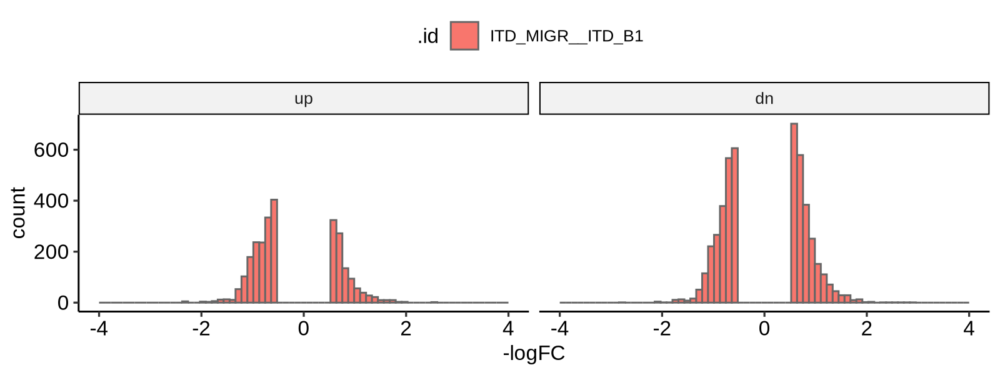

In [144]:
# gene expression reuslts
comb_ii = 'ITD_B1__ITD_MIGR'
deg_dt_sig = deg_dt[.id == comb_ii & padj < 0.1, .(rn, .id, log2FoldChange, pvalue, padj, chr, start, end, updn)]
deg_dt_sig[, tag := paste0(.id, '_', chr, '_', start, '_', end) ]
deg_dt_sig = deg_dt_sig[!duplicated(tag), ]
deg_dt_sig[, name := paste0('deg_name_', 1:nrow(deg_dt_sig)) ]
deg_dt_sig_gr = makeGRangesFromDataFrame(deg_dt_sig, keep.extra.columns = T)
head(deg_dt_sig_gr) 

# DNA methylation results
comb_ii = 'ITD_MIGR__ITD_B1'
plotdat = dmp_dt[.id == comb_ii, .(.id, rn, logFC, adj.P.Val, CHR, MAPINFO, name)]
plotdat[, chr := paste0('chr', CHR) ]
plotdat[, start := MAPINFO]
plotdat[, end := MAPINFO]
plotdat[, tag := paste0(chr, '_', start) ]
plotdat = plotdat[!duplicated(tag), ]
plotdat[, tag := paste0(chr, '_', start, '_', end) ]
plotdat = plotdat[, .(chr, start, end,  name, logFC, adj.P.Val, .id, tag)]
plotdat = makeGRangesFromDataFrame(plotdat, keep.extra.columns = T)
head(plotdat)

ov = findOverlapsOfPeaks(Peaks1 = deg_dt_sig_gr, Peaks2 = plotdat, maxgap = 10000) 
ov_dt = as.data.table(ov$overlappingPeaks$`deg_dt_sig_gr///plotdat`)

# based on m value
options(repr.plot.width = 8, repr.plot.height = 3, repr.plot.res = 200)
plotdat = ov_dt[abs(logFC) > .55, c(12, 15:ncol(ov_dt)), with = F]
dim(plotdat)
head(plotdat)

gg = ggplot(plotdat, aes(x = -logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('updn', nrow = 1)
gg

ggsave(gg, file = 'plot/mouse_itd_b1_migr.pdf', width = 8, height = 3)


In [133]:
head(plotdat)

GRanges object with 0 ranges and 5 metadata columns:
   seqnames    ranges strand |        name     logFC adj.P.Val         .id         tag
      <Rle> <IRanges>  <Rle> | <character> <numeric> <numeric> <character> <character>
  -------
  seqinfo: no sequences

In [134]:
table(dmp_dt$.id)


  ITD-B1__ITD-B1M  ITD-MIGR__ITD-B1 ITD-MIGR__ITD-B1M     WT-B1__ITD-B1    WT-B1__ITD-B1M   WT-B1__ITD-MIGR     WT-B1__WT-B1M    WT-B1M__ITD-B1   WT-B1M__ITD-B1M 
           282308            282308            282308            282308            282308            282308            282308            282308            282308 
 WT-B1M__ITD-MIGR   WT-MIGR__ITD-B1  WT-MIGR__ITD-B1M WT-MIGR__ITD-MIGR    WT-MIGR__WT-B1   WT-MIGR__WT-B1M 
           282308            282308            282308            282308            282308            282308 

In [135]:
# gene expression reuslts
comb_ii = 'ITD_B1__ITD_MIGR'
deg_dt_sig = deg_dt[.id == comb_ii & padj < 0.1 & log2FoldChange >0 , .(rn, .id, log2FoldChange, pvalue, padj, chr, start, end, updn)]
deg_dt_sig[, tag := paste0(.id, '_', chr, '_', start, '_', end) ]
deg_dt_sig = deg_dt_sig[!duplicated(tag), ]
deg_dt_sig[, name := paste0('deg_name_', 1:nrow(deg_dt_sig)) ]
deg_dt_sig_gr = makeGRangesFromDataFrame(deg_dt_sig, keep.extra.columns = T)

# DNA methylation results
comb_ii = 'ITD-MIGR__ITD-B1'
plotdat = dmp_dt[.id == comb_ii, .(.id, rn, logFC, adj.P.Val, CHR, MAPINFO, name)]
plotdat[, chr := paste0('chr', CHR) ]
plotdat[, start := MAPINFO]
plotdat[, end := MAPINFO]
plotdat[, tag := paste0(chr, '_', start) ]
plotdat = plotdat[!duplicated(tag), ]
plotdat[, tag := paste0(chr, '_', start, '_', end) ]
plotdat = plotdat[, .(chr, start, end,  name, logFC, adj.P.Val, .id, tag)]
plotdat = makeGRangesFromDataFrame(plotdat, keep.extra.columns = T)

ov = findOverlapsOfPeaks(Peaks1 = deg_dt_sig_gr, Peaks2 = plotdat, maxgap = 10000) 
ov_dt = as.data.table(ov$overlappingPeaks$`deg_dt_sig_gr///plotdat`)

# based on m value
options(repr.plot.width = 8, repr.plot.height = 3, repr.plot.res = 200)
plotdat = ov_dt[abs(logFC) > .55, c(12, 15:ncol(ov_dt)), with = F]
dim(plotdat)
head(plotdat)

gg = ggplot(plotdat, aes(x = -logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('updn', nrow = 1)
gg

#fname = 'plot/mouse_itd_b1_migr.pdf'
#pdf(file = fname, width = 8, height = 3)
#gg
#dev.off()


ERROR: Error in eval(jsub, SDenv, parent.frame()): object 'updn' not found


In [293]:
table(deg_dt$.id)


 ITD_B1__ITD_MIGR     ITD_B1__WT_B1    ITD_B1__WT_B1M   ITD_B1__WT_MIGR   ITD_B1M__ITD_B1 ITD_B1M__ITD_MIGR    ITD_B1M__WT_B1   ITD_B1M__WT_B1M  ITD_B1M__WT_MIGR 
            24411             24411             24411             24411             24411             24411             24411             24411             24411 
  ITD_MIGR__WT_B1  ITD_MIGR__WT_B1M ITD_MIGR__WT_MIGR    WT_B1__WT_MIGR     WT_B1M__WT_B1   WT_B1M__WT_MIGR 
            24411             24411             24411             24411             24411             24411 

In [294]:
table(dmp_dt[, .id])


  ITD_B1__ITD_B1M  ITD_MIGR__ITD_B1 ITD_MIGR__ITD_B1M     WT_B1__ITD_B1    WT_B1__ITD_B1M   WT_B1__ITD_MIGR     WT_B1__WT_B1M    WT_B1M__ITD_B1   WT_B1M__ITD_B1M 
           282308            282308            282308            282308            282308            282308            282308            282308            282308 
 WT_B1M__ITD_MIGR   WT_MIGR__ITD_B1  WT_MIGR__ITD_B1M WT_MIGR__ITD_MIGR    WT_MIGR__WT_B1   WT_MIGR__WT_B1M 
           282308            282308            282308            282308            282308            282308 

[1] 8453   10

[1] 278767     11

duplicated or NA names found. 
                Rename all the names by numbers.

duplicated or NA names found. 
                Rename all the names by numbers.



[1] 21877    14

updn,peaks2,seqnames,start,end,width,strand,name,logFC,adj.P.Val,.id,tag,overlapFeature,shortestDistance
<fct>,<chr>,<fct>,<int>,<int>,<int>,<fct>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>
dn,172041,chr11,51688856,51688856,1,*,dmp_name_297660,-0.5531912,0.9567420,ITD_B1__ITD_B1M,chr11_51688856_51688856,upstream,222
up,128339,chr18,38249736,38249736,1,*,dmp_name_1560825,-0.6754382,0.9567420,ITD_B1__ITD_B1M,chr18_38249736_38249736,downstream,512
up,005756,chr16,31944501,31944501,1,*,dmp_name_1234290,-1.2153746,0.1698744,ITD_B1__ITD_B1M,chr16_31944501_31944501,downstream,2549
up,148951,chr16,31948101,31948101,1,*,dmp_name_1234350,-0.6261730,0.9567420,ITD_B1__ITD_B1M,chr16_31948101_31948101,includeFeature,420
dn,024876,chr6,72349756,72349756,1,*,dmp_name_3150630,-0.9278286,0.8007041,ITD_B1__ITD_B1M,chr6_72349756_72349756,includeFeature,2440
dn,112082,chr6,72347222,72347222,1,*,dmp_name_3150570,-0.6822846,0.9567420,ITD_B1__ITD_B1M,chr6_72347222_72347222,downstream,94


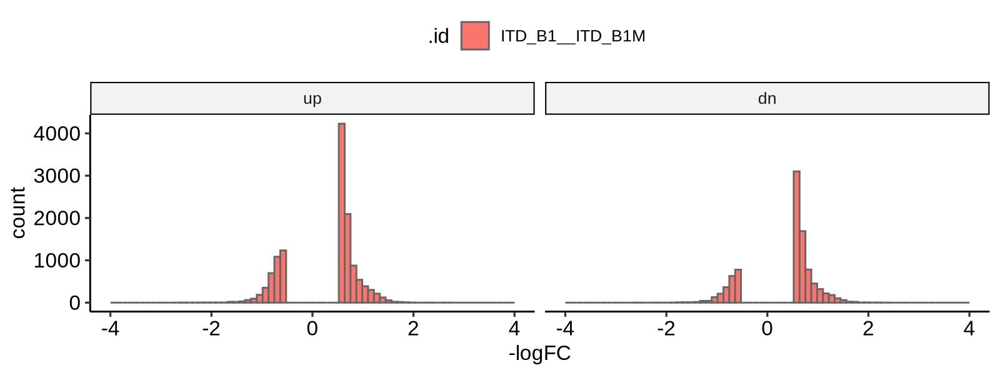

In [299]:
comb_ii = 'ITD_B1M__ITD_B1'
deg_dt_sig = deg_dt[.id == comb_ii & padj < 0.1, .(rn, .id, log2FoldChange, pvalue, padj, chr, start, end, updn)]
deg_dt_sig[, tag := paste0(.id, '_', chr, '_', start, '_', end) ]
deg_dt_sig = deg_dt_sig[!duplicated(tag), ]
dim(deg_dt_sig) 
deg_dt_sig[, name := paste0('deg_name_', 1:nrow(deg_dt_sig)) ]
deg_dt_sig_gr = makeGRangesFromDataFrame(deg_dt_sig, keep.extra.columns = T)

comb_ii = 'ITD_B1__ITD_B1M'
plotdat = dmp_dt[.id == comb_ii, .(.id, rn, logFC, adj.P.Val, CHR, MAPINFO, name)]
plotdat[, chr := paste0('chr', CHR) ]
plotdat[, start := MAPINFO]
plotdat[, end := MAPINFO]
plotdat[, tag := paste0(chr, '_', start) ]
plotdat = plotdat[!duplicated(tag), ]
dim(plotdat)
plotdat[, tag := paste0(chr, '_', start, '_', end) ]
plotdat = plotdat[, .(chr, start, end,  name, logFC, adj.P.Val, .id, tag)]
plotdat = makeGRangesFromDataFrame(plotdat, keep.extra.columns = T)

ov = findOverlapsOfPeaks(Peaks1 = deg_dt_sig_gr, Peaks2 = plotdat, maxgap = 10000) 
ov_dt = as.data.table(ov$overlappingPeaks$`deg_dt_sig_gr///plotdat`)

# based on m value
options(repr.plot.width = 8, repr.plot.height = 3, repr.plot.res = 200)
plotdat = ov_dt[abs(logFC) > .55, c(12, 15:ncol(ov_dt)), with = F]
dim(plotdat)
head(plotdat)

gg = ggplot(plotdat, aes(x = -logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('updn', nrow = 1)
gg

fname = 'plot/mouse_itd_b1m__itdb1.pdf'
pdf(file = fname, width = 8, height = 3)
gg
dev.off()


## summary DMC

Warning message:
“Removed 2 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range (`geom_bar()`).”


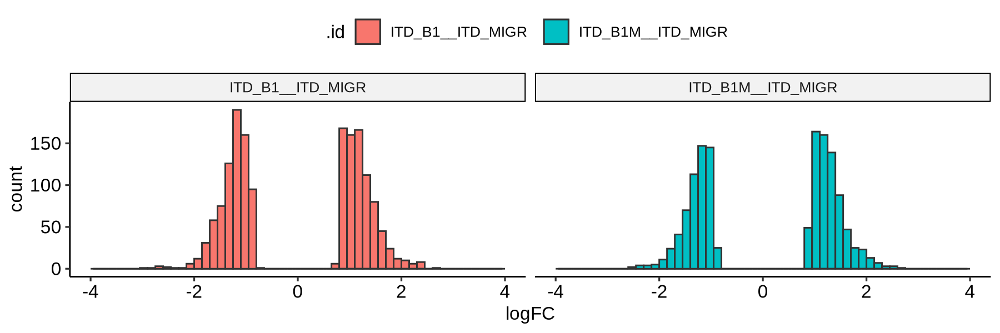

In [536]:
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = dmp_dt[ logFC > cut  & adj.P.Val < 0.05, ]
plotdat2 = dmp_dt[ logFC < -cut & adj.P.Val < 0.05, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 1) 
gg


In [545]:
table(dmp_dt$.id)


         ITD_B1__ITD_B1M         ITD_B1__ITD_MIGR        ITD_B1M__ITD_MIGR     KitKI_B1KI__KitKI_WT KitOE_B1OE__KitOE_WTMIGR 
                  282228                   282228                   282228                   282228                   282228 
    LSKKI_B1KI__LSKKI_WT LSKOE_WTB1__LSKOE_WTMIGR      Vitro_B1__Vitro_B1M     Vitro_B1__Vitro_MIGR    Vitro_B1M__Vitro_MIGR 
                  282228                   282228                   282228                   282228                   282228 

V1,V2,N,group,per
<chr>,<chr>,<int>,<chr>,<dbl>
-1,ITD_B1__ITD_MIGR,763,Hypo,0.2703488
1,ITD_B1__ITD_MIGR,798,Hyper,0.2827501
-1,ITD_B1M__ITD_MIGR,591,Hypo,0.2094052
1,ITD_B1M__ITD_MIGR,722,Hyper,0.2558215


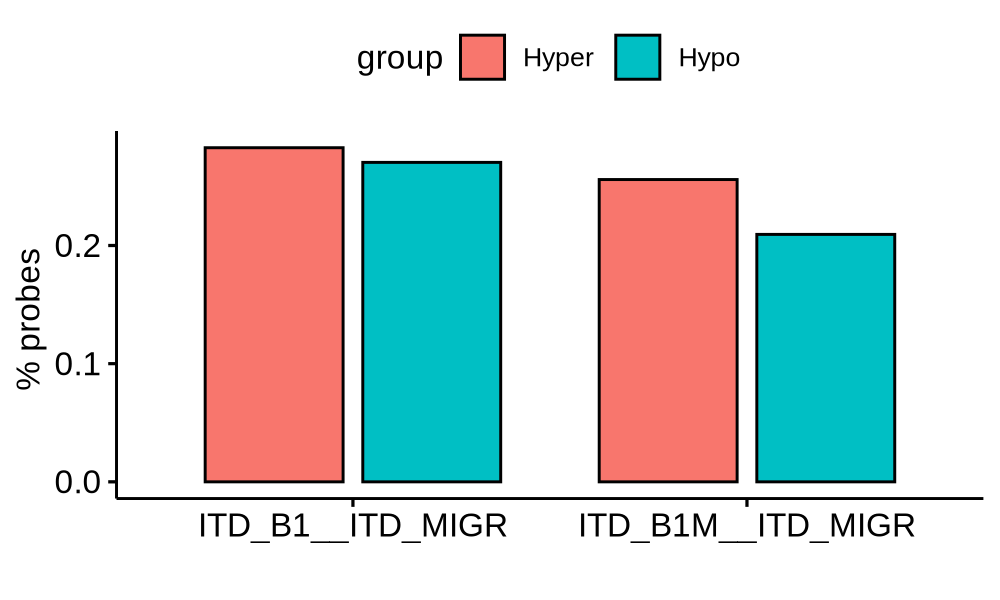

In [550]:
plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(table(sign(plotdat$logFC), plotdat$.id), keep.rownames = T)
plotdat[V1 == 1, group := 'Hyper' ]
plotdat[V1 == -1, group := 'Hypo' ]
plotdat[, per := 100 * N / 282228]
plotdat
gg = ggbarplot(plotdat, x = 'V2', y = 'per', fill = 'group', color = 'black', position = position_dodge(.8)) +
ylab('% probes ') + xlab('') + rotate_x_text(0)
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
gg


In [515]:
# based on m value
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
cnames = c('WT_B1',  'WT_B1M',  'ITD_B1',  'ITD_B1M',  'ITD_MIGR__WT',  'ITD_B1__WT',  'ITD_B1M__WT') 
cnames = c('ITD_ITDB1__ITD_ITDMIGR')
plotdat = dmp_dt[abs(logFC) > .55 & adj.P.Val < 0.05 & .id %in% cnames, ]

plotdat[, .id := factor(.id, levels = cnames) ]
gg = ggplot(plotdat, aes(x = logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
ggsave(gg, file = '~/WenhuoHu/plot/mouse_meth.pdf', width = 13, height = 6)


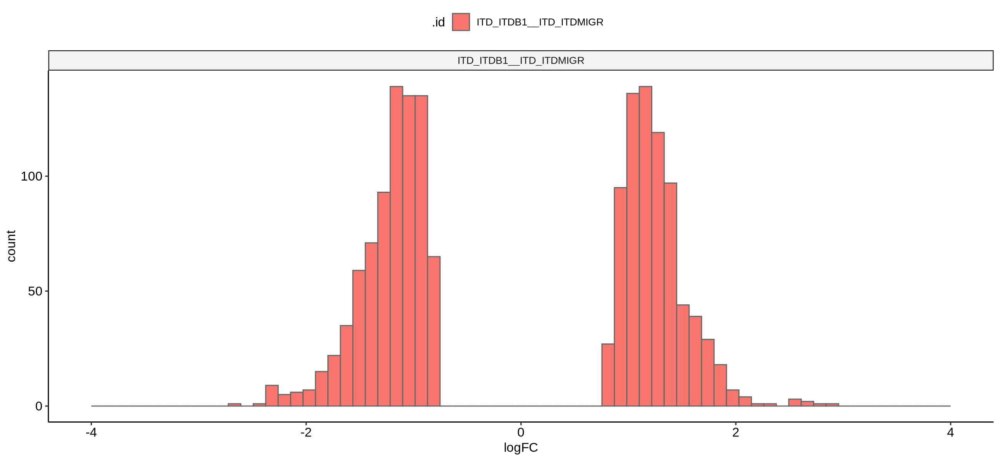

In [516]:
gg

In [512]:
dim(dmp_dt[.id == 'ITD_ITDB1__ITD_ITDMIGR', ])

[1] 282228     10

In [513]:
# based on m value
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
plotdat = dmp_dt[abs(logFC) > .55 & adj.P.Val < 0.05, ]
plotdat[, .id := factor(.id, levels = colnames(contMatrix)) ]
gg = ggplot(plotdat, aes(x = logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
ggsave(gg, file = '~/WenhuoHu/plot/mouse_meth.pdf', width = 13, height = 6)


ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'colnames': object 'contMatrix' not found


In [161]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua/mouse_methylation"

In [ ]:
#save.image('bcat_mouse_dna_methylation.rdata')
base::load('bcat_mouse_dna_methylation.rdata')

## heatmap

In [416]:
plotdat = getM(mSetSq)
head(plotdat) 


,207810940029_R01C01,207810940029_R01C02,207810940029_R02C01,207810940029_R02C02,207810940029_R03C01,207810940029_R03C02,207810940029_R04C01,207810940029_R04C02,207810940029_R05C01,207810940029_R05C02,⋯,208362130071_R02C01,208362130071_R02C02,208362130071_R03C01,208362130071_R03C02,208362130071_R04C01,208362130071_R04C02,208362130071_R05C01,208362130071_R05C02,208362130071_R06C01,208362130071_R06C02
cg36602742_TC11,0.08839998,0.03238848,0.07556649,0.07536375,0.2815465,0.0171692,0.2191459,-0.08101407,0.3111157,0.1624073,⋯,0.2304837,0.2367870,0.3221627,-0.3050882,0.1056040,0.003977636,-0.02610422,0.06101143,-0.08536287,0.04782878
cg36602743_TC21,0.82416675,1.21389534,0.92975831,1.11488173,1.2124681,1.1454788,1.0937340,1.09503503,1.2043288,0.9763633,⋯,1.2086272,0.4130516,1.2705410,0.5993894,1.2533012,0.706684134,0.59350457,1.26431785,1.32403918,1.16840437
cg36602902_BC11,0.79516765,1.38228665,1.18153623,1.03640505,0.8793659,1.0682669,1.3946404,1.21608343,1.1397226,1.4293125,⋯,0.1067244,1.2972385,0.5122585,0.8864417,0.2457224,1.318588886,0.51806066,1.63124830,0.36715727,1.29204481
cg36603113_TC21,-0.52559651,-0.59516120,-0.48890704,-0.60730702,-0.5594683,-0.5583247,-0.5650072,-0.55667955,-0.5559931,-0.5198697,⋯,-0.5583732,-0.5516856,-0.5697351,-0.5888534,-0.5767909,-0.517560604,-0.54323007,-0.55170611,-0.56654428,-0.56519290
cg36603287_TC21,1.09003152,1.14429664,0.61163478,0.92072623,1.0223983,1.1711538,0.6682145,1.00598282,0.8767981,0.9856716,⋯,1.0150433,0.6986230,1.3513127,0.2544006,1.3888110,0.879065997,1.44047753,0.91759680,1.19563605,0.96026199
cg36603393_BC21,1.39999770,1.55118105,1.30874331,1.30943237,1.2290969,1.3966440,1.4296397,1.48126334,1.3113037,1.4683921,⋯,1.2862635,1.4070528,1.2549676,1.3430989,1.2627990,1.297018130,1.20145604,1.56671756,1.35079182,1.44482072


In [417]:
cmp_sel

[1] "ITD_ITDB1__ITD_ITDMIGR"          "ITD_ITDB1M__ITD_ITDMIGR"         "Kit_B1KI__Kit_B1KI_WT"           "LSK_B1KI__LSK_B1KI_WT"          
[5] "Kit_B1OE__Kit_B1OE_WT"           "LSK_B1OE__LSK_B1OE_WT"           "vitro_vitroB1__vitro_vitroMIGR"  "vitro_vitroB1M__vitro_vitroMIGR"

In [426]:
plotdat

,207810940059_R03C02,207810940059_R04C02,207810940059_R05C02,207810940059_R06C02,207996700048_R01C01,207810940059_R04C01,207810940059_R05C01,207810940059_R06C01,207810940059_R01C02,207810940059_R02C02
cg41147187_TC21,-0.9202200,-0.9428197,-1.0094788,-1.000218,-0.8656120,0.9754595,0.9264041,0.9958005,0.9134487,0.9272357
cg40001570_BC11,0.9145601,0.9140994,0.9463521,0.957972,0.9956267,-0.8425446,-1.1219346,-0.8921400,-0.8779889,-0.9940021


In [427]:
dmp_sel

.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B,name,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
ITD_ITDB1__ITD_ITDMIGR,cg41147187_TC21,-2.700065,0.5696164,-11.77989,1.851685e-07,0.002090389,7.024179,dmp_name_25,dn
ITD_ITDB1__ITD_ITDMIGR,cg40001570_BC11,2.602440,-0.5176166,11.66617,2.039899e-07,0.002132283,6.952910,dmp_name_27,up


In [428]:
head(dmp_dt[.id %in% 'ITD_ITDB1__ITD_ITDMIGR',][order(P.Value), ])

.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B,name,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
ITD_ITDB1__ITD_ITDMIGR,cg29188670_BC21,-2.308754,0.11506277,-15.50711,1.140032e-08,0.0009487125,8.891725,dmp_name_1,dn
ITD_ITDB1__ITD_ITDMIGR,cg32077401_TC21,-2.401575,-0.11131427,-15.48399,1.157639e-08,0.0009487125,8.882481,dmp_name_2,dn
ITD_ITDB1__ITD_ITDMIGR,cg43169037_BC21,-2.352198,0.15540135,-15.19728,1.402418e-08,0.0009487125,8.765794,dmp_name_3,dn
ITD_ITDB1__ITD_ITDMIGR,cg37913724_TC21,-2.335033,0.16335604,-14.78462,1.859271e-08,0.0009487125,8.590948,dmp_name_4,dn
ITD_ITDB1__ITD_ITDMIGR,cg29187497_BC21,-2.162301,0.07880345,-14.73301,1.926983e-08,0.0009487125,8.568488,dmp_name_5,dn
ITD_ITDB1__ITD_ITDMIGR,cg35958454_TC21,-2.128291,0.02279903,-14.48787,2.287491e-08,0.0009487125,8.459936,dmp_name_6,dn


In [431]:
dsn_sel

sample2,sample,genotype,group,grp,Sample_Name,id,Sample_Group,sample_name
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ITD_B1M_1,JL_ITD_B1M_1_S26,ITDB1M,ITD,ITD_ITDB1M,ITD-B1M-1_3196934__mousemethylation,207996700048_R02C01,Xu_835144,ITD-B1M-1_3196934
ITD_B1M_2,JL_ITD_B1M_2_S27,ITDB1M,ITD,ITD_ITDB1M,ITD-B1M-2_3196935__mousemethylation,207996700048_R03C01,Xu_835144,ITD-B1M-2_3196935
ITD_B1M_3,JL_ITD_B1M_3_S28,ITDB1M,ITD,ITD_ITDB1M,ITD-B1M-3_3196936__mousemethylation,207996700048_R04C01,Xu_835144,ITD-B1M-3_3196936
ITD_B1M_4,JL_ITD_B1M_4_S29,ITDB1M,ITD,ITD_ITDB1M,ITD-B1M-4_3196937__mousemethylation,207996700048_R05C01,Xu_835144,ITD-B1M-4_3196937
ITD_B1M_5,JL_ITD_B1M_5_S30,ITDB1M,ITD,ITD_ITDB1M,NA,NA,NA,NA
ITD_B1_1,JL_ITD_B1_1_S21,ITDB1,ITD,ITD_ITDB1,ITD-B1-1_3196929__mousemethylation,207810940059_R03C02,Xu_835144,ITD-B1-1_3196929
ITD_B1_2,JL_ITD_B1_2_S22,ITDB1,ITD,ITD_ITDB1,ITD-B1-2_3196930__mousemethylation,207810940059_R04C02,Xu_835144,ITD-B1-2_3196930
ITD_B1_3,JL_ITD_B1_3_S23,ITDB1,ITD,ITD_ITDB1,ITD-B1-3_3196931__mousemethylation,207810940059_R05C02,Xu_835144,ITD-B1-3_3196931
ITD_B1_4,JL_ITD_B1_4_S24,ITDB1,ITD,ITD_ITDB1,ITD-B1-4_3196932__mousemethylation,207810940059_R06C02,Xu_835144,ITD-B1-4_3196932


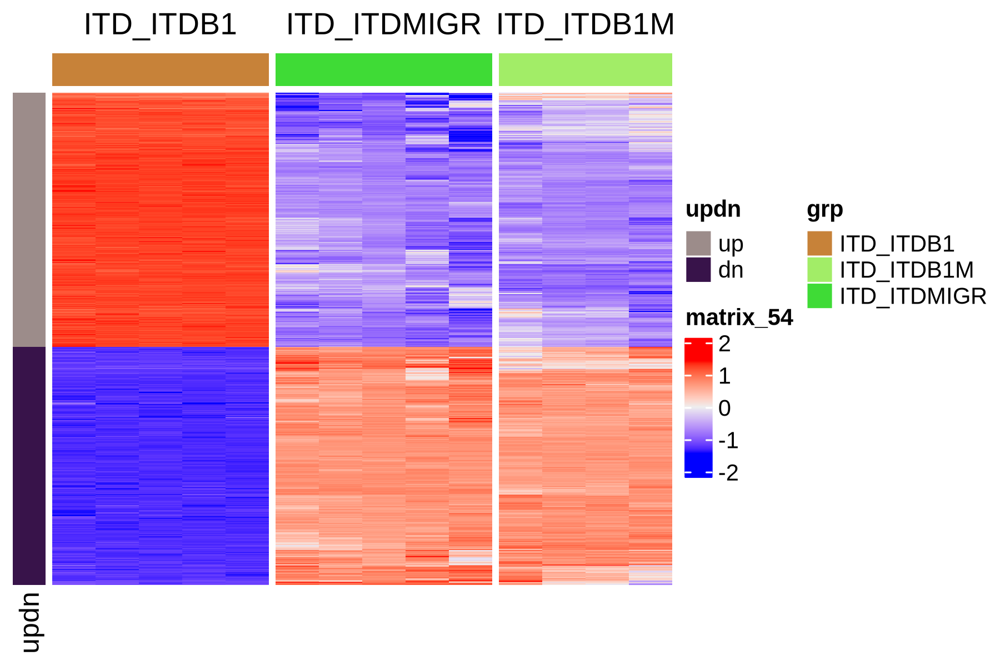

In [436]:
dmp_sel = dmp_dt[.id %in% c('ITD_ITDB1__ITD_ITDMIGR','ITD_ITDB1M__ITD_ITDMIGR') & abs(logFC) > 1 & adj.P.Val < .05, ]
dsn_sel = dsn_both[grepl('ITD', group) & !is.na(id), ]
plotdat = getM(mSetSq)
plotdat = scale_fun(plotdat[dmp_sel$rn, dsn_sel$id]) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2


column_ha = HeatmapAnnotation(df = dsn_sel[, 'grp', drop = F], show_annotation_name = F)
row_ha = rowAnnotation(df = dmp_sel[, .(updn)])

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = T, left_annotation = row_ha,
        cluster_rows = T,  #row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_sel$grp))  

In [437]:
cmp_sel

[1] "ITD_ITDB1__ITD_ITDMIGR"          "ITD_ITDB1M__ITD_ITDMIGR"         "Kit_B1KI__Kit_B1KI_WT"           "LSK_B1KI__LSK_B1KI_WT"          
[5] "Kit_B1OE__Kit_B1OE_WT"           "LSK_B1OE__LSK_B1OE_WT"           "vitro_vitroB1__vitro_vitroMIGR"  "vitro_vitroB1M__vitro_vitroMIGR"

In [440]:
dmp_sel = dmp_dt[.id %in% c('vitro_vitroB1__vitro_vitroMIGR','vitro_vitroB1M__vitro_vitroMIGR') & abs(logFC) > 1 & adj.P.Val < .05, ]
dsn_sel = dsn_both[grepl('Kit', group) & !is.na(id), ]
plotdat = getM(mSetSq)
plotdat = scale_fun(plotdat[dmp_sel$rn, dsn_sel$id]) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2


column_ha = HeatmapAnnotation(df = dsn_sel[, 'grp', drop = F], show_annotation_name = F)
row_ha = rowAnnotation(df = dmp_sel[, .(updn)])

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = T, left_annotation = row_ha,
        cluster_rows = T,  #row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_sel$grp))  

ERROR while rich displaying an object: Error in valid.viewport(x, y, width, height, just, gp, clip, mask, xscale, : invalid 'yscale' in viewport

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_

In [439]:
dmp_sel = dmp_dt[.id %in% c('LSK_B1KI__LSK_B1KI_WT','LSK_B1OE__LSK_B1OE_WT') & abs(logFC) > 1 & adj.P.Val < .05, ]
dsn_sel = dsn_both[grepl('LSK', group) & !is.na(id), ]
plotdat = getM(mSetSq)
plotdat = scale_fun(plotdat[dmp_sel$rn, dsn_sel$id]) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2


column_ha = HeatmapAnnotation(df = dsn_sel[, 'grp', drop = F], show_annotation_name = F)
row_ha = rowAnnotation(df = dmp_sel[, .(updn)])

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = T, left_annotation = row_ha,
        cluster_rows = T,  #row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_sel$grp))  

`use_raster` is automatically set to TRUE for a matrix with more than 2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [438]:
dmp_sel = dmp_dt[.id %in% c('Kit_B1KI__Kit_B1KI_WT','Kit_B1OE__Kit_B1OE_WT') & abs(logFC) > 1 & adj.P.Val < .05, ]
dsn_sel = dsn_both[grepl('Kit', group) & !is.na(id), ]
plotdat = getM(mSetSq)
plotdat = scale_fun(plotdat[dmp_sel$rn, dsn_sel$id]) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2


column_ha = HeatmapAnnotation(df = dsn_sel[, 'grp', drop = F], show_annotation_name = F)
row_ha = rowAnnotation(df = dmp_sel[, .(updn)])

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = T, left_annotation = row_ha,
        cluster_rows = T,  #row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_sel$grp))  

`use_raster` is automatically set to TRUE for a matrix with more than 2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [196]:
tmp = dmp_dt[abs(logFC) > 2.5 & adj.P.Val < .01, ]
locus_sel = unique(tmp$rn)
length(locus_sel) 


[1] 1868

In [197]:
plotdat = getM(mSetSq)
plotdat = scale_fun(plotdat[locus_sel, targets$id]) 

dim(plotdat)
head(plotdat)

[1] 1868   29

,207810940029_R01C01,207810940029_R01C02,207810940029_R02C01,207810940029_R02C02,207810940029_R03C01,207810940029_R03C02,207810940029_R04C01,207810940029_R04C02,207810940029_R05C01,207810940029_R05C02,⋯,207810940059_R04C02,207810940059_R05C01,207810940059_R05C02,207810940059_R06C01,207810940059_R06C02,207996700048_R01C01,207996700048_R02C01,207996700048_R03C01,207996700048_R04C01,207996700048_R05C01
cg36295631_BC11,-0.5212151,-0.5146688,-0.4853549,-0.5030956,-0.4495927,-0.4851470,-0.5212176,-0.4583036,-0.4933049,-0.4482373,⋯,2.128648,-0.4303448,2.140314,-0.4601942,2.140974,2.230254,-0.2935652,-0.3606710,-0.3771576,-0.4051590
cg29187497_BC21,0.4564169,0.4438842,0.3952540,0.4519348,0.4443103,0.3733194,0.5015213,0.4856739,0.4280145,0.4921305,⋯,-2.163987,0.4569393,-2.102415,0.3967754,-2.138639,-2.169952,0.4231827,0.4215913,0.4250641,0.4672829
cg37584011_TC21,0.3380725,0.3743885,0.3398147,0.2967758,0.3106348,0.2789135,0.2896402,0.3659849,0.3269035,0.3235862,⋯,1.438238,-1.3811756,1.437692,-1.4422989,1.513737,1.383267,-1.2177822,-1.2540594,-1.2978285,-1.2705973
cg44186141_TC11,-0.4451371,-0.4059148,-0.3899446,-0.4173476,-0.4604622,-0.4294585,-0.4721195,-0.4277823,-0.3923974,-0.4957886,⋯,2.116609,-0.4443267,2.063236,-0.4678427,2.159519,2.233663,-0.5091811,-0.3942331,-0.5084855,-0.4896184
cg35249737_BC21,0.4134527,0.4640978,0.4521953,0.5395694,0.3703332,0.4664504,0.4265010,0.5633104,0.4491836,0.4386093,⋯,-2.199722,0.4236462,-2.076623,0.5692624,-2.139257,-2.153622,0.2725151,0.3933753,0.3354243,0.3941917
cg38223675_BC21,0.5279434,0.5195491,0.4494453,0.4469170,0.4240680,0.5037217,0.5033000,0.4333482,0.4730884,0.4271737,⋯,-2.163033,0.3970380,-2.167330,0.4069238,-2.185877,-2.078916,0.5615789,0.4214368,0.5114042,0.5087686


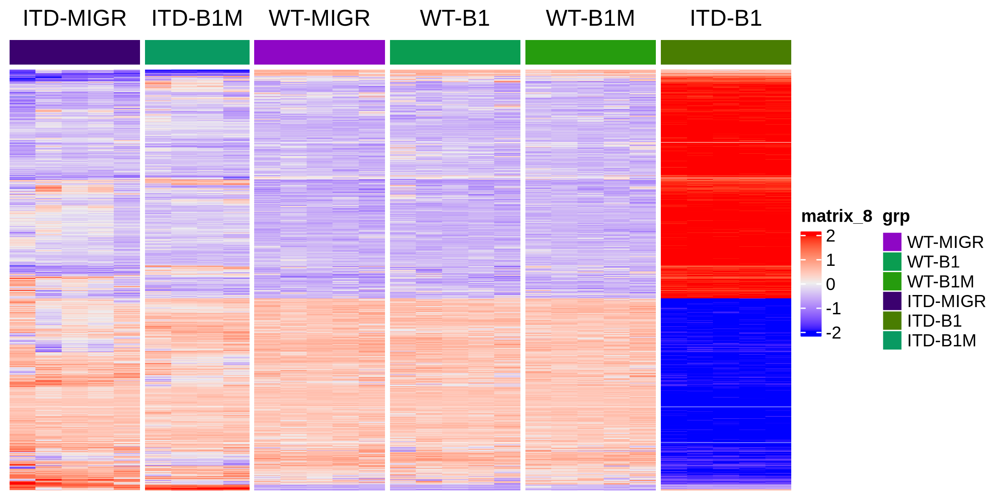

In [212]:
plotdat = getM(mSetSq)
plotdat = scale_fun(plotdat[locus_sel, targets$id]) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = targets[, 'grp', drop = F], show_annotation_name = F)

options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = T, 
        cluster_rows = T,  #row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(targets$grp))  


In [213]:
plotdat = getM(mSetSq)
row_sd = rowSdsplotdat) 

ERROR: Error in parse(text = x, srcfile = src): <text>:2:16: unexpected invalid token
1: plotdat = getM(mSetSq)
2: row_sd = rowSds（
                  ^


In [ ]:
head(row_sd)

# backup code

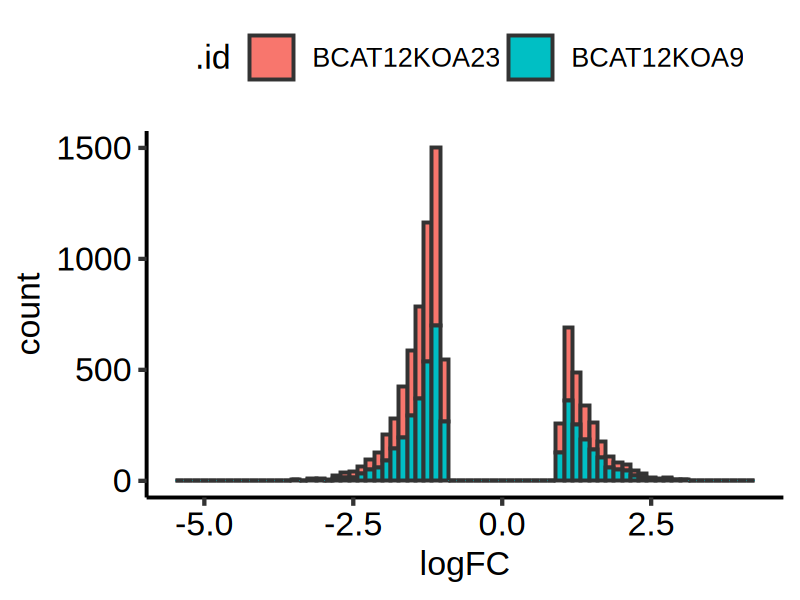

In [211]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
ggplot(dmp_dt[.id %in% c('BCAT12KOA9', 'BCAT12KOA23') & adj.P.Val < 0.05 & abs(logFC) > 1, ], aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr()

Warning message:
"Removed 4 rows containing non-finite outside the scale range (`stat_bin()`)."


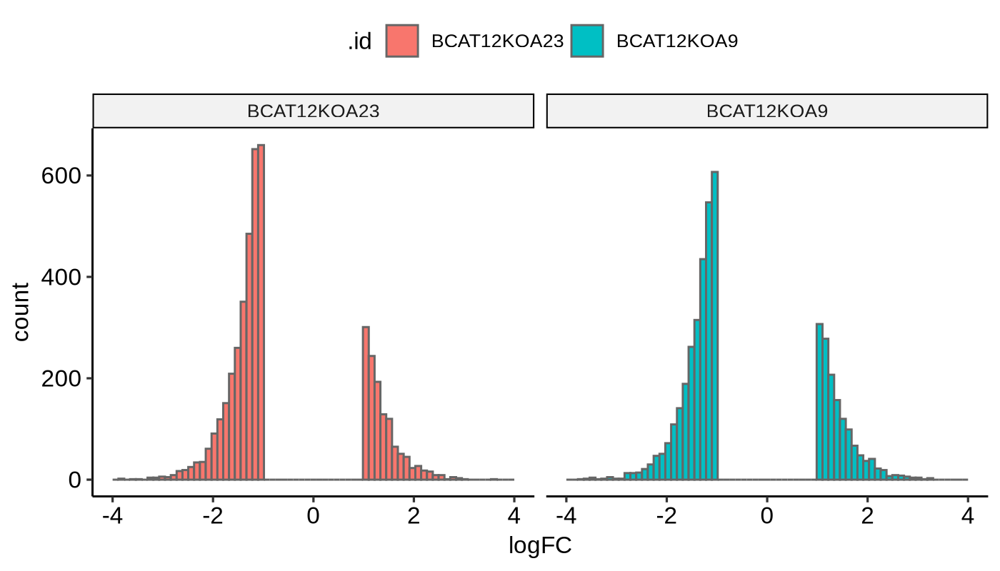

In [224]:
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 200)
ggplot(dmp_dt[.id %in% c('BCAT12KOA9', 'BCAT12KOA23') & abs(logFC) > 1 & adj.P.Val < 0.05, ], aes(x = logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 1)

In [143]:
head(dmp_dt[.id == 'ITD_B1', ])

.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ITD_B1,cg36295631_BC11,4.892786,-3.4134708,110.78892,1.330658e-36,3.756554e-31,69.21451
ITD_B1,cg29187497_BC21,-4.263124,1.2691650,-101.68435,1.258414e-35,1.672131e-30,67.74357
ITD_B1,cg37584011_TC21,5.213025,-1.3404930,100.35375,1.776922e-35,1.672131e-30,67.50954
ITD_B1,cg44186141_TC11,3.506872,-3.2005839,81.27756,4.431488e-33,3.048037e-28,63.49070
ITD_B1,cg35249737_BC21,-3.965781,0.6127238,-80.66660,5.398425e-33,3.048037e-28,63.33795
ITD_B1,cg38223675_BC21,-3.197773,0.5524403,-74.74752,3.960330e-32,1.863388e-27,61.76391


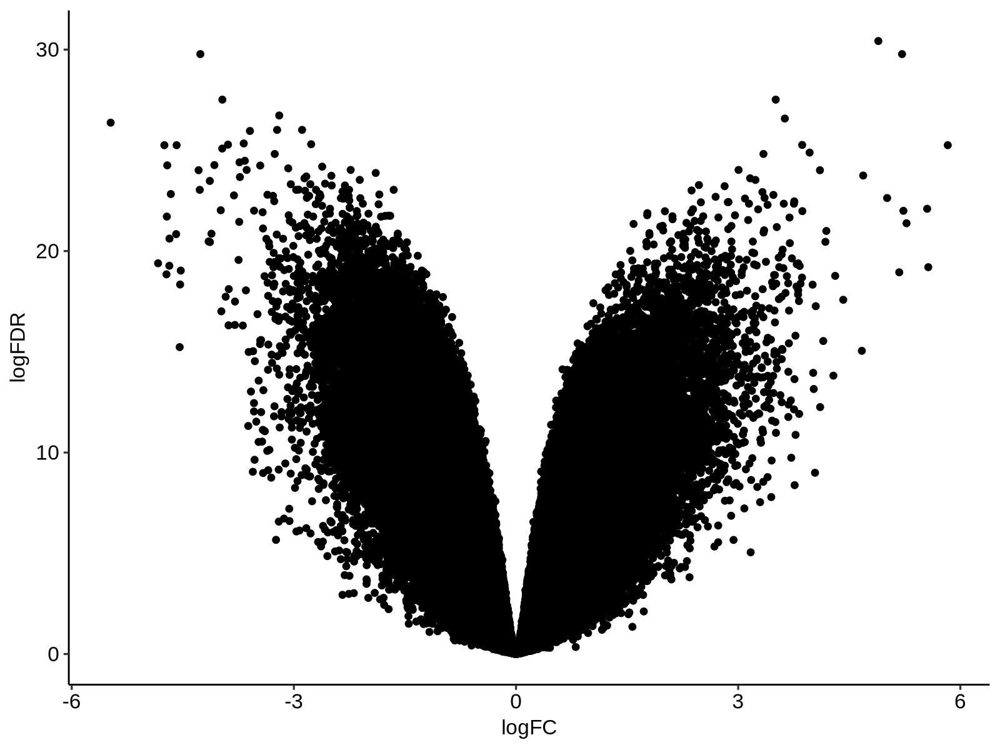

In [141]:
options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 200)
plotdat = dmp_dt[.id == 'ITD_B1', ]
plotdat[, logFDR := -log(adj.P.Val, 10) ]
ggplot(plotdat, aes(logFC, logFDR)) + geom_point() + theme_pubr() 


In [244]:
tmp1 = dmp_dt[.id == 'BCAT12KOA9' & adj.P.Val < 0.05 & logFC < -1, rn]
tmp2 = dmp_dt[.id == 'BCAT12KOA23' & adj.P.Val < 0.05 & logFC< -1, rn]
tmp3 = dmp_dt[.id == 'BCAT1KOC3' & adj.P.Val < 0.05 & logFC  < -1, rn]
tmp4 = dmp_dt[.id == 'BCAT1KOC11' & adj.P.Val < 0.05 & logFC < -1, rn]

# regional DMR analysis

In [ ]:
# above is based on :
# https://www.bioconductor.org/packages/release/workflows/vignettes/methylationArrayAnalysis/inst/doc/methylationArrayAnalysis.html#probe-wise-differential-methylation-analysis

# regional analysis is based on :
# https://bioconductor.org/packages/release/bioc/vignettes/DMRcate/inst/doc/EPICv2.pdf


In [144]:
library(DMRcate)

In [145]:
mVals3 <- minfi::logit2(mVals2)

Warning message in minfi::logit2(mVals2):
"NaNs produced"
Warning message in minfi::logit2(mVals2):
"NaNs produced"


In [146]:
mVals3 <- rmSNPandCH(mVals3, rmcrosshyb = FALSE)
#mVals3 <- rmPosReps(mVals3, filter.strategy="mean")

Assuming EPICv2 data. Proceeding...

see ?DMRcatedata and browseVignettes('DMRcatedata') for documentation

downloading 1 resources

retrieving 1 resource

loading from cache



In [320]:
#grset <- makeGenomicRatioSetFromMatrix(mat = mVals2, array = "IlluminaHumanMethylationEPIC", annotation = "ilm10b5.hg38",  what = 'M')


In [151]:
contMatrix

ERROR: Error: object 'contMatrix' not found


In [153]:
contMatrix

,WT_B1,WT_B1M,ITD_B1,ITD_B1M,ITD_MIGR__WT,ITD_B1__WT,ITD_B1M__WT
WT_MIGR,-1,-1,0,0,-1,-1,-1
WT_B1,1,0,0,0,0,0,0
WT_B1M,0,1,0,0,0,0,0
ITD_MIGR,0,0,-1,-1,1,0,0
ITD_B1,0,0,1,0,0,1,0
ITD_B1M,0,0,0,1,0,0,1


In [159]:
dmr_list = lapply(1:7, function(ii){
    fit = lmFit(mVals2, design) 
    fit = contrasts.fit(fit, contMatrix)
    fit = eBayes(fit)
    tt = topTable(fit, coef = ii, number = nrow(mVals2))
    nsig = sum(tt$adj.P.Val < 0.05)
    betafit = lmFit(ilogit2(mVals2), design)
    betafit = contrasts.fit(betafit, contMatrix)
    betafit = eBayes(betafit)
    betatt = topTable(betafit, coef = ii, number = nrow(mVals2))
    m = match(rownames(tt), rownames(betatt))
    tt$diff = betatt$logFC[m]
    m = match(rownames(mVals2), rownames(tt))
    tt = tt[m, ]
    anno = getAnnotation(IlluminaHumanMethylationEPICanno.ilm10b5.hg38)
    anno = getAnnotation(IlluminaMouseMethylationanno.12.v1.mm10)
    stat = tt$t
    tt = cbind(tt, anno[rownames(tt), ])
    annotated = GRanges(as.character(tt$chr), IRanges(tt$pos, tt$pos), stat = stat, diff = tt$diff, ind.fdr = tt$adj.P.Val,  is.sig = tt$adj.P.Val < 0.05)
    names(annotated) = rownames(tt)
    annotated = sort(annotated)
    annotated = new("CpGannotated", ranges = annotated)
    annotated
})
# #ann <- getAnnotation(IlluminaHumanMethylationEPICanno.ilm10b5.hg38)
# rgSet@annotation = c(array = "IlluminaMouseMethylation", annotation = "12.v1.mm10")


In [152]:
dmr_list2 = lapply(1:7, function(ii){dmrcate(dmr_list[[ii]], lambda=1000, C=2)})


ERROR: Error in FUN(X[[i]], ...): object 'dmr_list' not found


In [ ]:
dmr_list3 = lapply(1:7, function(ii){
    res = dmr_list2[[ii]]
    as.data.table(as.data.frame(extractRanges(res)))
})


In [279]:
names(dmr_list3) = colnames(contMatrix)
dmr_dt = rbindlist(dmr_list3, idcol = T)
head(dmr_dt)

.id,seqnames,start,end,width,strand,no.cpgs,min_smoothed_fdr,Stouffer,HMFDR,Fisher,maxdiff,meandiff,overlapping.genes
<chr>,<fct>,<int>,<int>,<int>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
KO__WT,chr16,49317262,49317767,506,*,2,4.300384e-180,2.497371e-08,4.321072e-20,9.306452e-19,0.3522825,0.17734087,NA
KO__WT,chr4,120133382,120134582,1201,*,3,2.005574e-76,5.279068e-12,1.530333e-14,1.990768e-17,-0.2734587,-0.03334540,"USP53, RP11-455G16.1"
KO__WT,chr10,104372682,104373849,1168,*,3,1.499500e-55,4.451717e-13,1.663522e-10,2.820868e-17,-0.1557026,-0.10099251,SUFU
KO__WT,chr3,196728589,196728969,381,*,2,3.452951e-118,1.033399e-11,1.166105e-17,4.415802e-17,-0.3848249,-0.23862166,"MFI2-AS1, MFI2"
KO__WT,chr3,30792902,30793799,898,*,2,4.708530e-94,9.798980e-07,4.891579e-16,8.306981e-15,-0.1965554,-0.09927880,GADL1
KO__WT,chr2,16409618,16410143,526,*,2,1.908090e-33,1.764609e-14,2.239867e-09,4.304344e-14,-0.2072880,-0.07215543,AC010745.2


In [280]:
saveRDS(dmr_dt, file = 'nb_methylation_dmr_dt_Aug24.rds')

# summary for DMR

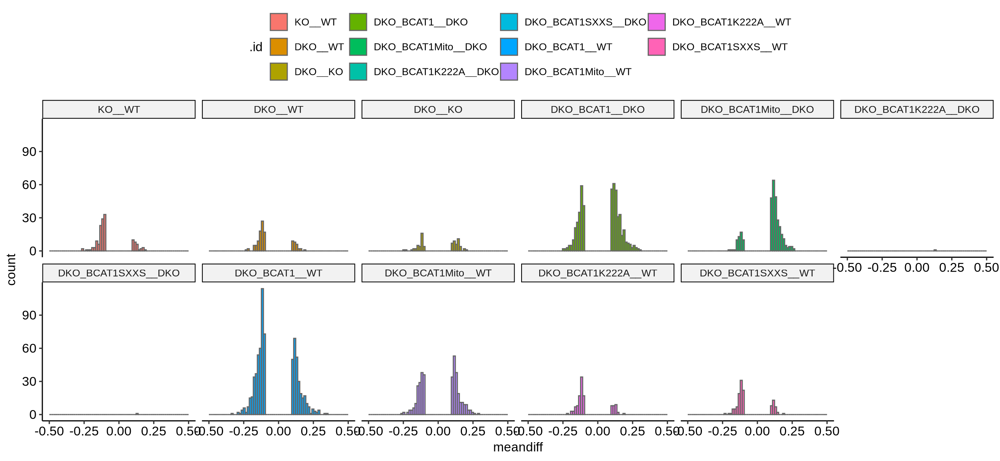

In [282]:
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
plotdat = dmr_dt[HMFDR < 0.001 & abs(meandiff) > .1, ]
plotdat[, .id := factor(.id, levels = colnames(contMatrix)) ]
ggplot(plotdat, aes(x = meandiff, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-0.5, 0.5) + facet_wrap('.id', nrow = 2)


# QC 2

In [292]:
dim(bVals)
dim(targets2)

[1] 114003     42

[1] 39 13

In [299]:
bVals2 = bVals[, targets2$sample_name]

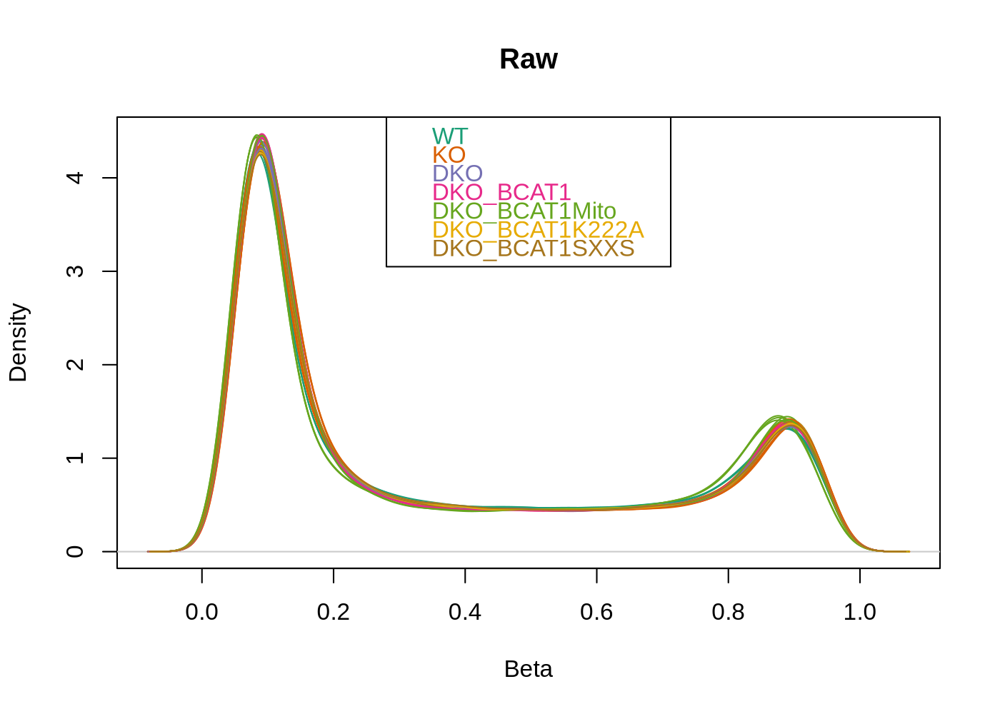

In [309]:
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
densityPlot(bVals2, sampGroups=targets2$cellType,main="Raw", legend=FALSE)
legend("top", legend = levels(factor(targets2$cellType)),  text.col=brewer.pal(8,"Dark2"))


In [316]:
pal <- brewer.pal(8,"Dark2")


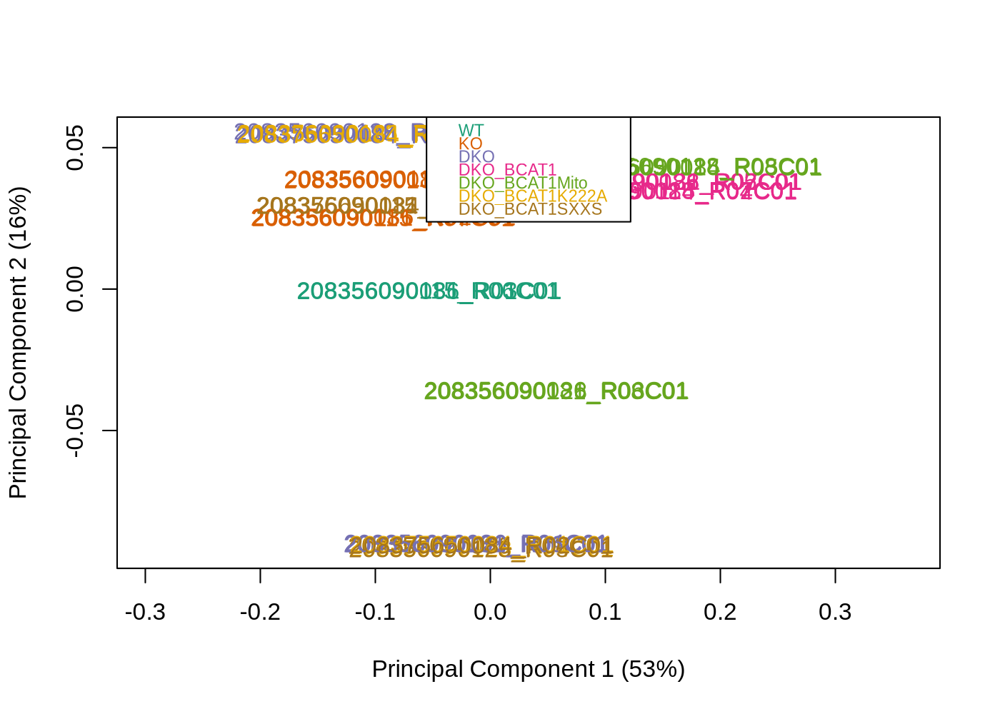

In [337]:
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)

xx = plotMDS(bVals2, top=4000, gene.selection="common",  col=pal[factor(targets2$cellType)], labels = )
legend("top", legend=levels(factor(targets2$cellType)), text.col=pal, bg="white", cex=0.7)


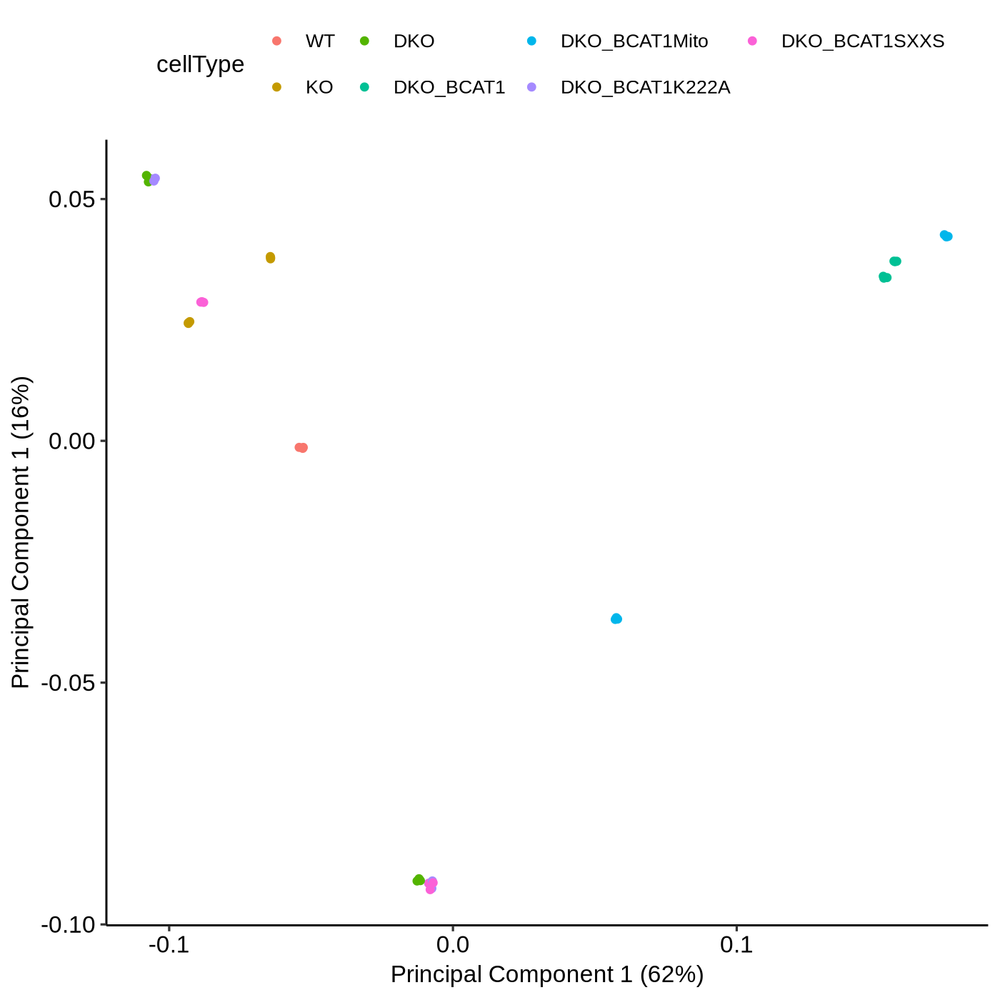

In [340]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 200)
targets2$x = xx$x
targets2$y = xx$y
ggplot(targets2, aes(x, y, color = cellType)) + geom_point() + theme_pubr() + 
xlab('Principal Component 1 (62%)') + ylab('Principal Component 1 (16%)')

# methylation levels responding

In [341]:
head(bVals2)

,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01,208356090086_R06C01,208356090086_R07C01,208356090086_R08C01,208356090115_R01C01,208356090115_R02C01,⋯,208356090131_R06C01,208356090131_R07C01,208356090131_R08C01,208375650084_R01C01,208375650084_R02C01,208375650084_R03C01,208375650084_R04C01,208375650084_R05C01,208375650084_R06C01,208375650084_R07C01
cg14817997,0.58053995,0.5952878,0.50323842,0.66416312,0.53722827,0.62309217,0.63468141,0.65820076,0.47761091,0.5392100,⋯,0.63504997,0.54451492,0.59413290,0.63010808,0.61269119,0.48159658,0.5495567,0.53285477,0.49907257,0.53608139
cg01803908,0.86325423,0.8956900,0.87571791,0.89498250,0.88815169,0.86620425,0.90504706,0.87884102,0.90000071,0.8911727,⋯,0.90474320,0.88176206,0.88605282,0.90179195,0.90420110,0.90285151,0.8634666,0.88504272,0.87434294,0.90500028
cg15174812,0.86659176,0.8771695,0.86539567,0.85225935,0.87767454,0.84575556,0.90106191,0.89181173,0.90188623,0.8826851,⋯,0.87023968,0.88720453,0.84911678,0.87970958,0.88056934,0.86696803,0.8752262,0.85271432,0.87932162,0.89215182
cg05001044,0.16046240,0.1473014,0.18007322,0.13858528,0.13229634,0.13202773,0.12977363,0.14078286,0.14253078,0.1209620,⋯,0.14692757,0.11881978,0.12351765,0.13340829,0.11481840,0.14622374,0.1373881,0.13584319,0.11779043,0.15379330
cg17501828,0.07783401,0.1052236,0.07784738,0.08158618,0.08666302,0.07325923,0.07223814,0.08268699,0.08810865,0.0877876,⋯,0.08174426,0.08074092,0.07976716,0.07520276,0.06863003,0.08309484,0.0838547,0.08777394,0.08459277,0.05579347
cg18263059,0.90779523,0.9329955,0.88452635,0.90258390,0.93210906,0.90157439,0.87529620,0.92640842,0.87845230,0.9549501,⋯,0.97533822,0.89445666,0.87881148,0.90573738,0.84489220,0.88735472,0.9105447,0.95483362,0.93120513,0.88472382


In [344]:
dmp_sel = dmp_dt[.id == 'KO__WT',]
head(dmp_sel) 
dim(dmp_sel) 

.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
KO__WT,cg04399289,2.291157,-0.2375542,26.85689,1.895157e-25,2.160536e-20,45.60951
KO__WT,cg18732252,-2.468068,1.0004378,-22.33018,1.022872e-22,5.830525e-18,40.30901
KO__WT,cg02921266,-1.697106,-2.3962468,-19.66939,7.094355e-21,2.445790e-16,36.56945
KO__WT,cg20414753,-2.135340,-2.2870066,-19.55653,8.581492e-21,2.445790e-16,36.39884
KO__WT,cg22494876,-1.843048,-0.5117567,-18.98598,2.278031e-20,5.194048e-16,35.52019
KO__WT,cg02799565,-1.716870,-1.7742804,-18.58649,4.578586e-20,8.699543e-16,34.88852


[1] 114003      8

# export data

In [ ]:
saveRDS(dmp_dt, file = 'nb_methylation_dmp_dt_beta_mosue_Feb26.rds') # based on beta value
saveRDS(deg_dt, file = 'nb_methylation_deg_dt_beta_mosue_nov11.rds') # based on beta value
saveRDS(dsn, file = 'nb_methylation_dsn_mosue_nov11.rds') 
saveRDS(gpl_dt, file = 'GPL32685_mouse_dt.rds')
saveRDS(logcpm_mmu, file = 'logcpm_mmu.rds')

In [14]:
dsn = readRDS('nb_methylation_dsn_mosue_nov11.rds')
deg_dt = readRDS('nb_methylation_deg_dt_beta_mosue_nov11.rds')
dmp_dt = readRDS('nb_methylation_dmp_dt_beta_mosue_nov11.rds')
gpl_dt = readRDS('GPL32685_mouse_dt.rds')
logcpm_mmu = readRDS('logcpm_mmu.rds')


In [45]:
head(deg_dt)

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,tx,chr,⋯,V11,V12,length,effective_length,expected_count,TPM,FPKM,min_start,max_end,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<fct>
0610005C13Rik,ITD_B1M__ITD_B1,0.1113075,-0.02165438,5.161233,-0.004195582,0.9966524,NA,NR_038165,chr7,⋯,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,45567794,45575176,dn
0610005C13Rik,ITD_B1M__ITD_MIGR,0.1113075,-2.57541301,5.155605,-0.499536507,0.6174015,NA,NR_038165,chr7,⋯,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,45567794,45575176,dn
0610005C13Rik,ITD_B1M__WT_B1M,0.1113075,0.00000000,5.161474,0.000000000,1.0000000,NA,NR_038165,chr7,⋯,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,45567794,45575176,NA
0610005C13Rik,ITD_B1M__WT_B1,0.1113075,-1.15422914,5.161474,-0.223623941,0.8230499,NA,NR_038165,chr7,⋯,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,45567794,45575176,dn
0610005C13Rik,ITD_B1M__WT_MIGR,0.1113075,0.00000000,5.161474,0.000000000,1.0000000,NA,NR_038165,chr7,⋯,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,45567794,45575176,NA
0610005C13Rik,ITD_B1__ITD_MIGR,0.1113075,-2.55375863,5.155365,-0.495359460,0.6203464,NA,NR_038165,chr7,⋯,"585,110,170,50,","0,6618,6813,7332,",1018.5,854.93,0,0,0,45567794,45575176,dn
